## Deep Learning-Based Energy Disaggregation and Time-Series Analysis for Optimizing Household Appliance Use

#####  Here we apply the LSTM algorithm to predict appliance usage.  The REFIT dataset contains data of 21 houses. We first train, test the model only on data from house 1 and check how well the model performs on the unseen-pattern data of house 2.  

#### Import packages, read house 1 and house 2 data

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import display
import datetime
import time
import math
import warnings
warnings.filterwarnings("ignore")
import glob


from keras.layers import Dense, Activation, Dropout
from keras.models import Sequential
from keras.layers import LSTM, Dense, Bidirectional
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.optimizers import Adam
from keras.regularizers import l2

In [13]:
#  file paths for each house
file_paths = ['/Users/eujean/Desktop/FinalProject/data/house_1.csv',
              '/Users/eujean/Desktop/FinalProject/data/house_2.csv']

# read and merge data for each house
def read_merge_data(house):
    
    df = pd.read_csv(file_paths[house-1])
    
    # Convert 'unix_time' column to datetime
    df['timestamp'] = pd.to_datetime(df['Unix'], unit='s')
    df.drop(columns=['Time'], inplace=True)
    
  
    df.drop(columns=['Unix'], inplace=True)
    
    # Set 'timestamp' as the index
    df.set_index('timestamp', inplace=True)
    
    df.dropna(axis=0, how='any', inplace=True)
    
    return df

# Initialize a dictionary to store DataFrames for each house
dfs = {}

# Iterate over each house and read/merge data
for house in range(1, 3):
    dfs[house] = read_merge_data(house)

for house, df in dfs.items():
    print(f"House {house} DataFrame:")
    print(df.head())
    print("\n")


House 1 DataFrame:
                     Fridge  Television  Microwave
timestamp                                         
2014-03-06 16:23:19     0.0        62.0        2.0
2014-03-06 16:23:33     0.0        63.0        2.0
2014-03-06 16:23:41     0.0        63.0        2.0
2014-03-06 16:23:47     0.0        63.0        2.0
2014-03-06 16:23:55     0.0        62.0        2.0


House 2 DataFrame:
                     Fridge  Television  Microwave
timestamp                                         
2014-03-07 10:33:18   116.0        20.0        1.0
2014-03-07 10:33:32   117.0        20.0        1.0
2014-03-07 10:33:47   116.0        20.0        1.0
2014-03-07 10:34:18   115.0        20.0        1.0
2014-03-07 10:34:33   115.0        20.0        1.0




In [14]:
for i in range(1, 3):
    print('House {} data has shape: '.format(i), dfs[i].shape)
    display(dfs[i].tail(3))


House 1 data has shape:  (55763, 3)


,Fridge,Television,Microwave
timestamp,,,
2014-03-10 14:40:33,75.0,21.0,2.0
2014-03-10 14:40:46,74.0,21.0,2.0
2014-03-10 14:40:47,74.0,21.0,2.0


House 2 data has shape:  (53838, 3)


,Fridge,Television,Microwave
timestamp,,,
2014-03-11 05:28:48,9.0,25.0,1.0
2014-03-11 05:28:58,9.0,24.0,1.0
2014-03-11 05:29:02,9.0,24.0,1.0


In [15]:
dates = {}
for i in range(1, 3):  # Iterate over each house

    dates[i] = [str(time)[:10] for time in dfs[i].index.values]
    dates[i] = sorted(list(set(dates[i])))
    print('House {0} data contain {1} days from {2} to {3}.'.format(i, len(dates[i]), dates[i][0], dates[i][-1]))
    print(dates[i], '\n')


House 1 data contain 5 days from 2014-03-06 to 2014-03-10.
['2014-03-06', '2014-03-07', '2014-03-08', '2014-03-09', '2014-03-10'] 

House 2 data contain 5 days from 2014-03-07 to 2014-03-11.
['2014-03-07', '2014-03-08', '2014-03-09', '2014-03-10', '2014-03-11'] 



House 1 DataFrame Index:
DatetimeIndex(['2014-03-06 16:23:19', '2014-03-06 16:23:33',
               '2014-03-06 16:23:41', '2014-03-06 16:23:47',
               '2014-03-06 16:23:55', '2014-03-06 16:24:02',
               '2014-03-06 16:24:09', '2014-03-06 16:24:16',
               '2014-03-06 16:24:19', '2014-03-06 16:24:24',
               ...
               '2014-03-10 14:40:00', '2014-03-10 14:40:03',
               '2014-03-10 14:40:15', '2014-03-10 14:40:17',
               '2014-03-10 14:40:18', '2014-03-10 14:40:29',
               '2014-03-10 14:40:32', '2014-03-10 14:40:33',
               '2014-03-10 14:40:46', '2014-03-10 14:40:47'],
              dtype='datetime64[ns]', name='timestamp', length=55763, freq=None)


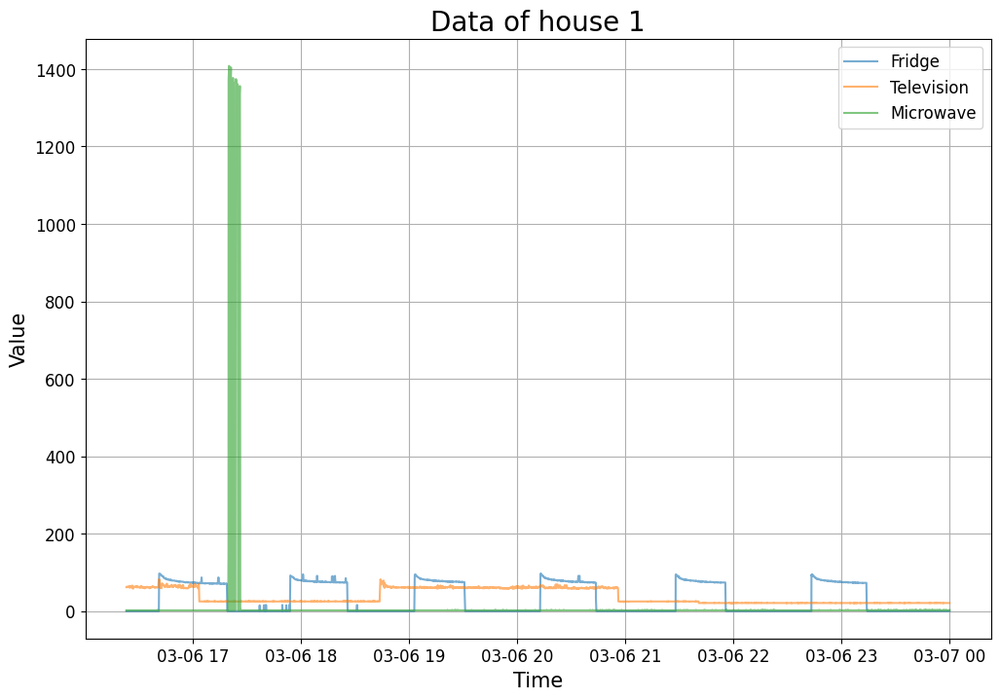

House 2 DataFrame Index:
DatetimeIndex(['2014-03-07 10:33:18', '2014-03-07 10:33:32',
               '2014-03-07 10:33:47', '2014-03-07 10:34:18',
               '2014-03-07 10:34:33', '2014-03-07 10:34:47',
               '2014-03-07 10:35:01', '2014-03-07 10:35:15',
               '2014-03-07 10:35:19', '2014-03-07 10:35:30',
               ...
               '2014-03-11 05:28:13', '2014-03-11 05:28:16',
               '2014-03-11 05:28:19', '2014-03-11 05:28:27',
               '2014-03-11 05:28:30', '2014-03-11 05:28:34',
               '2014-03-11 05:28:44', '2014-03-11 05:28:48',
               '2014-03-11 05:28:58', '2014-03-11 05:29:02'],
              dtype='datetime64[ns]', name='timestamp', length=53838, freq=None)


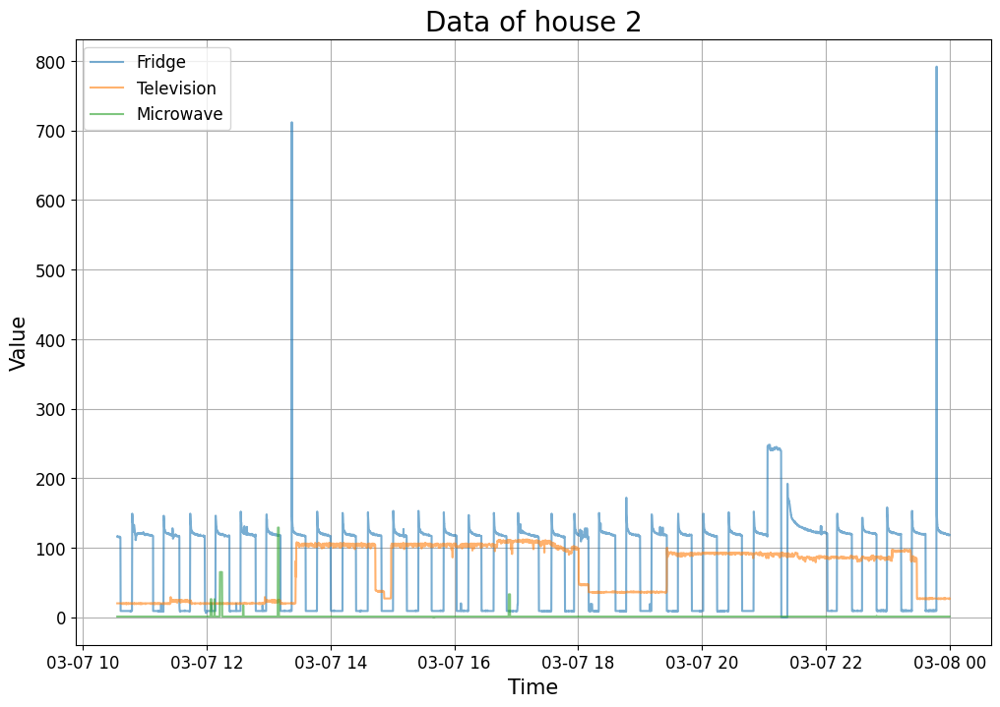

In [11]:
# Plot the first 2 days of data for each house
for i in range(1, 3):
    # Sort the DataFrame index
    sorted_df = dfs[i].sort_index()
    
    # Print the DataFrame index for debugging
    print("House", i, "DataFrame Index:")
    print(sorted_df.index)
    
    # Extract the first two days of data
    start_date = dates[i][0]
    end_date = pd.to_datetime(start_date) + pd.Timedelta(days=1)
    plot_df(sorted_df.loc[start_date:end_date], 'Data of house {}'.format(i))


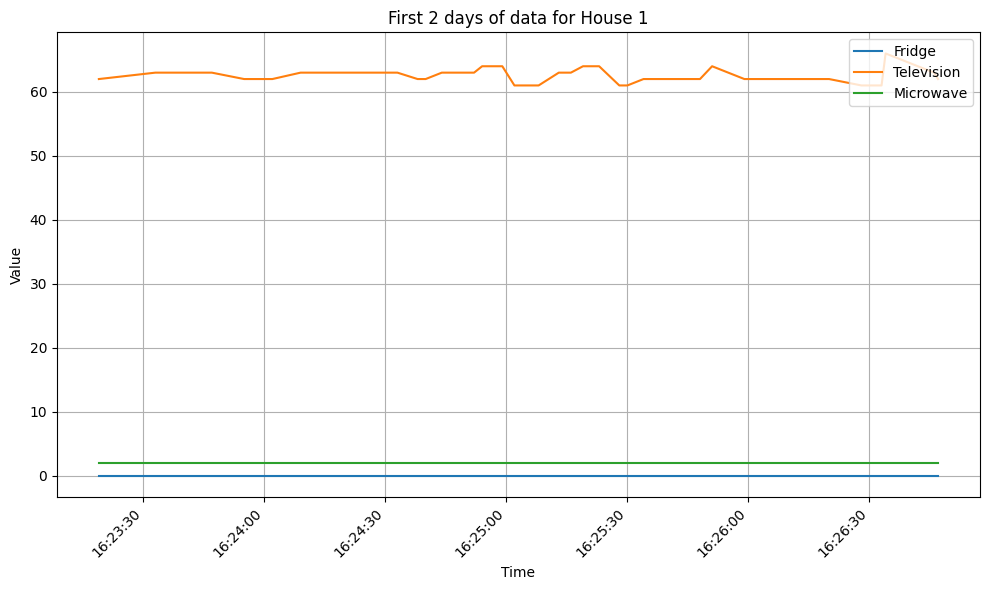

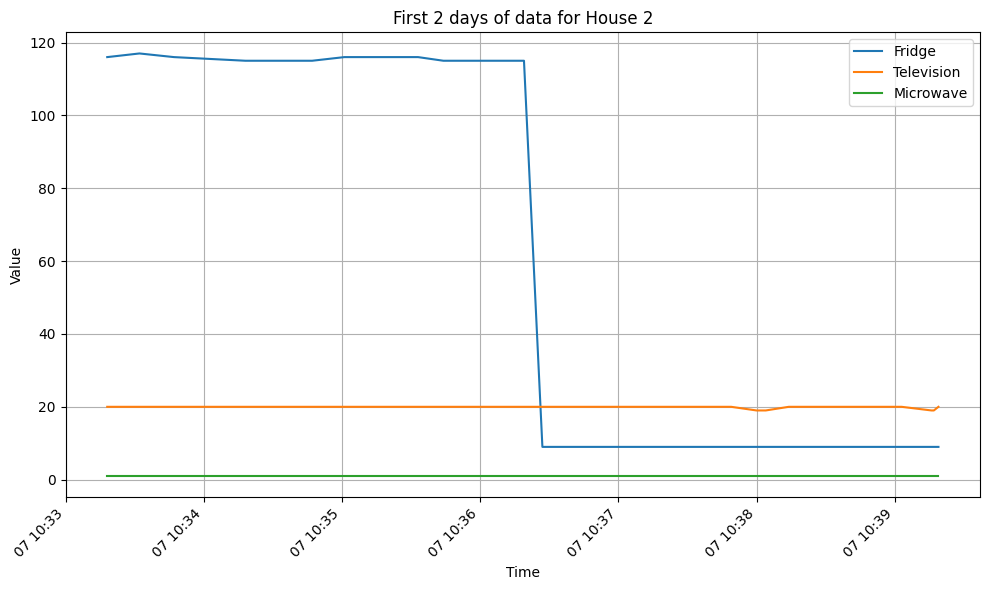

In [8]:
import matplotlib.pyplot as plt

# Define the plot_df function
def plot_df(df, title):
    fig, ax = plt.subplots(figsize=(10, 6))
    df.plot(ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Time')
    ax.set_ylabel('Value')
    plt.xticks(rotation=45)
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Plot the first 2 days of data for each house
for house, df in dfs.items():
    title = f"First 2 days of data for House {house}"
    plot_df(df.iloc[:48], title)


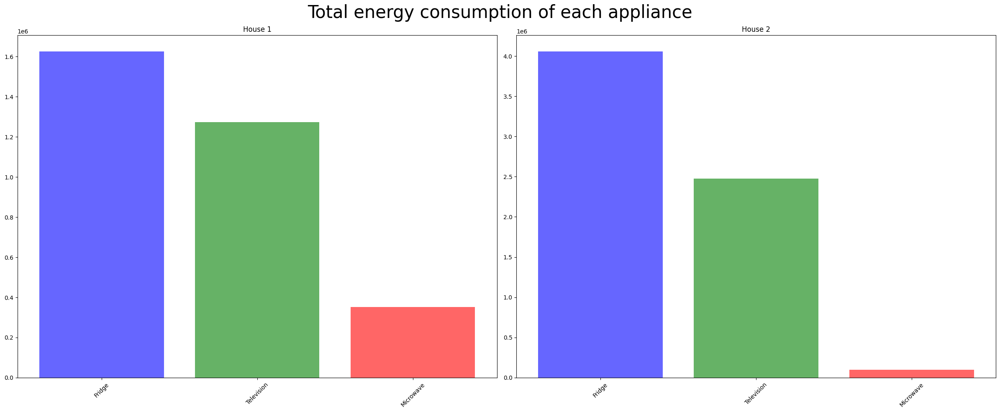

In [54]:
colors = ['b', 'g', 'r']

# Plot total energy consumption of each appliance from all houses
fig, axes = plt.subplots(1, 2, figsize=(24, 10))
plt.suptitle('Total energy consumption of each appliance', fontsize=30)

for house, df in dfs.items():
    cons = df[df.columns.values[0:]].sum().sort_values(ascending=False)
    app = cons.index
    y_pos = np.arange(len(app))
    axes[house - 1].bar(y_pos, cons.values, alpha=0.6, color=colors[:len(app)])
    axes[house - 1].set_xticks(y_pos)
    axes[house - 1].set_xticklabels(app, rotation=45)
    axes[house - 1].set_title(f'House {house}')

plt.tight_layout()
plt.show()

## Data Preparation for LSTM Prediction Model

In [16]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Define the proportions for train and test sets
train_ratio = 0.7
test_ratio = 0.3

# Initialize dictionaries to store train and test DataFrames for each house
train_data = {}
test_data = {}

# Split the data for each house
for house, df in dfs.items():
    total_samples = len(df)
    train_size = int(total_samples * train_ratio)
    test_size = total_samples - train_size
    
    # Split the data
    train_data[house] = df.iloc[:train_size]
    test_data[house] = df.iloc[train_size:]



In [17]:
for house in range(1, 3):
    print(f"House {house}:")
    print(f"Train set length: {len(train_data[house])}")
    print(f"Test set length: {len(test_data[house])}")
    print()

House 1:
Train set length: 39034
Test set length: 16729

House 2:
Train set length: 37686
Test set length: 16152



In [20]:
# Define a function to prepare data for LSTM
def prepare_lstm_data(df):
    # Scale the data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df.values)
    
    # Prepare the data in sequences for LSTM
    X = []
    y = []
    for i in range(len(scaled_data)):
        end_ix = i + 1
        if end_ix > len(scaled_data)-1:
            break
        seq_x, seq_y = scaled_data[i:end_ix], scaled_data[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), scaler

# Initialize dictionaries to store prepared data and scalers for each house
train_X, train_y, train_scalers = {}, {}, {}
test_X, test_y, test_scalers = {}, {}, {}

# Prepare the data for each house
for house in range(1, 3):
    # Prepare training data
    train_X[house], train_y[house], train_scalers[house] = prepare_lstm_data(train_data[house])
    
    # Prepare testing data
    test_X[house], test_y[house], test_scalers[house] = prepare_lstm_data(test_data[house])

## Vanilla LSTM

In [14]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.optimizers import Adam

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  
    ])
    return model

model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                17408     
                                                                 
 dense (Dense)               (None, 3)                 195       
                                                                 
Total params: 17603 (68.76 KB)
Trainable params: 17603 (68.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [6]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.optimizers import Adam

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting 3 features
    ])
    return model

# Compile the model
model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 64)                17408     
                                                                 
 dense (Dense)               (None, 3)                 195       
                                                                 
Total params: 17603 (68.76 KB)
Trainable params: 17603 (68.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [15]:

# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the vanilla LSTM model 
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])



In [7]:

# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the vanilla LSTM model 
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])



In [16]:
#model.compile(loss='mse', optimizer='adam')  # Using Mean Squared Error loss and Adam optimizer

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))



Epoch 1/100
1220/1220 [==============================] - 7s 4ms/step - loss: 0.0011 - accuracy: 0.9956 - val_loss: 0.0142 - val_accuracy: 0.9903
Epoch 2/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1400e-04 - accuracy: 0.9988 - val_loss: 0.0141 - val_accuracy: 0.9903
Epoch 3/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1431e-04 - accuracy: 0.9988 - val_loss: 0.0142 - val_accuracy: 0.9903
Epoch 4/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1530e-04 - accuracy: 0.9988 - val_loss: 0.0139 - val_accuracy: 0.9903
Epoch 5/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1399e-04 - accuracy: 0.9988 - val_loss: 0.0141 - val_accuracy: 0.9903
Epoch 6/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1317e-04 - accuracy: 0.9988 - val_loss: 0.0138 - val_accuracy: 0.9903
Epoch 7/100
1220/1220 [==============================] - 3s 3ms/step - loss: 3.0861e-04 - accuracy: 0.9988 - v

In [9]:
# 2nd

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))



Epoch 1/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.0312e-04 - accuracy: 0.9988 - val_loss: 0.0123 - val_accuracy: 0.9872
Epoch 2/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.0083e-04 - accuracy: 0.9987 - val_loss: 0.0124 - val_accuracy: 0.9872
Epoch 3/100
1220/1220 [==============================] - 4s 3ms/step - loss: 2.9884e-04 - accuracy: 0.9988 - val_loss: 0.0125 - val_accuracy: 0.9885
Epoch 4/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.0174e-04 - accuracy: 0.9988 - val_loss: 0.0125 - val_accuracy: 0.9872
Epoch 5/100
1220/1220 [==============================] - 4s 3ms/step - loss: 2.9643e-04 - accuracy: 0.9988 - val_loss: 0.0124 - val_accuracy: 0.9871
Epoch 6/100
1220/1220 [==============================] - 3s 3ms/step - loss: 3.0324e-04 - accuracy: 0.9988 - val_loss: 0.0124 - val_accuracy: 0.9872
Epoch 7/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.0266e-04 - accuracy: 0.9988

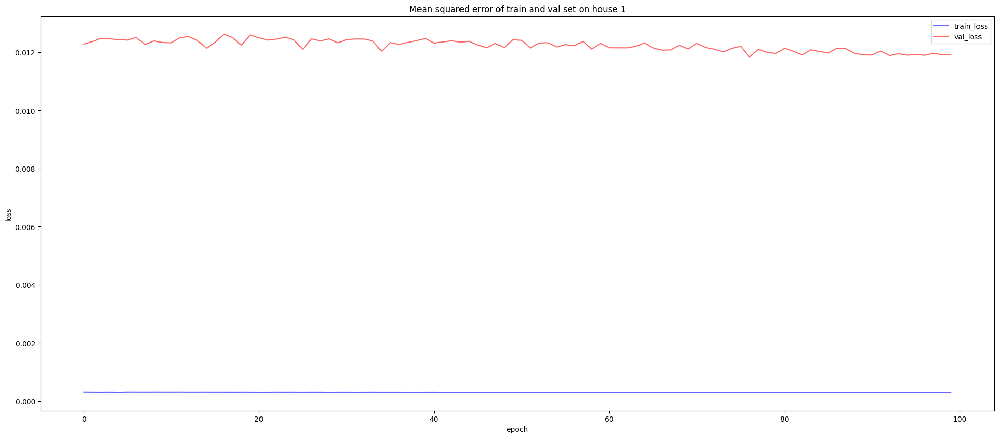

In [10]:
# 2nd
train_loss = history.history['loss']
val_loss = history.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Mean squared error of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

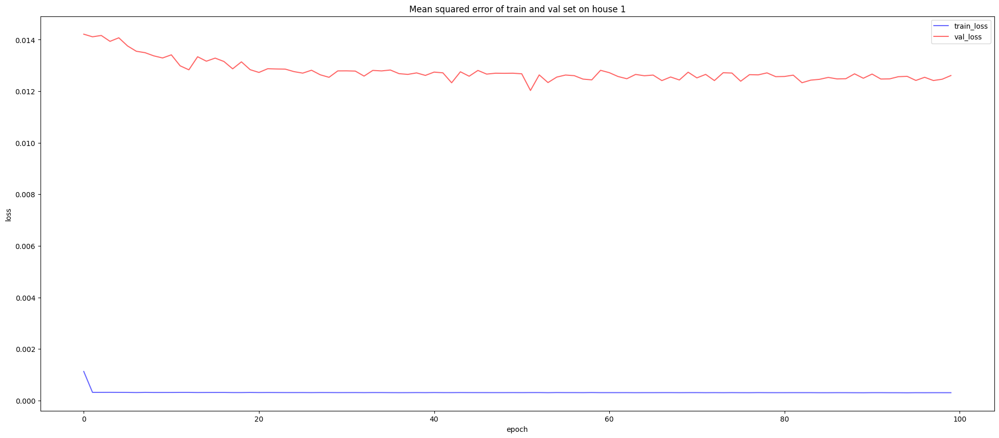

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Mean squared error of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

In [53]:
# Save the model
model.save('lstm_model.h5')


In [12]:
# Evaluate the model on test data
# 2nd 

loss, accuracy = model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 2s 2ms/step - loss: 2.9162e-04 - accuracy: 0.9989
Train Loss: 0.0002916176163125783
Train Accuracy:  0.9989240169525146


In [13]:
# Evaluate the model on test data
#2nd 
loss, accuracy = model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 2ms/step - loss: 0.0119 - accuracy: 0.9903
Test Loss: 0.011910757049918175
Test Accuracy:  0.9903156161308289


In [14]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 1s 1ms/step
Mean Squared Error (MSE): 677.7008179211285
Root Mean Squared Error (RMSE): 26.032687489407014
Mean Absolute Error (MAE): 22.534231777536363


In [18]:
# Evaluataccuracye the model on test data
loss, accuracy = model.evaluate(train_X[1], train_y[1])
print("Test Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 3s 2ms/step - loss: 2.9785e-04 - accuracy: 0.9988
Test Loss: 0.0002978490956593305
Train Accuracy:  0.998821496963501


In [48]:
# Evaluataccuracye the model on test data
loss, accuracy = model.evaluate(train_X[1], train_y[1])
print("Test Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 2s 2ms/step - loss: 2.7908e-04 - accuracy: 0.9989
Test Loss: 0.0002790806465782225
Train Accuracy:  0.9989240169525146


In [19]:
# Evaluate the model on test data
loss, accuracy = model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 2ms/step - loss: 0.0126 - accuracy: 0.9872
Test Loss: 0.012609352357685566
Test Accuracy:  0.9872070550918579


In [64]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 641.1797433427927
Root Mean Squared Error (RMSE): 25.321527271134194
Mean Absolute Error (MAE): 19.39890126994199


In [84]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 1s 1ms/step
Mean Squared Error (MSE): 679.1009436918972
Root Mean Squared Error (RMSE): 26.059565301284234
Mean Absolute Error (MAE): 19.468361032123664


In [22]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

predictions = test_scalers[1].inverse_transform(predictions)


# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(test_y[1], predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 2327.0427214156157
Root Mean Squared Error (RMSE): 48.23943118876523
Mean Absolute Error (MAE): 19.450406309363654


In [65]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

predictions = test_scalers[1].inverse_transform(predictions)


# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(test_y[1], predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 2233.291507463196
Root Mean Squared Error (RMSE): 47.257713735042195
Mean Absolute Error (MAE): 19.39890126994199


In [23]:
# Predict on test data
predictions = model.predict(test_X[1])

# Separate predictions for each appliance
fridge_predictions = predictions[:, 0]  # Assuming fridge is the first appliance
television_predictions = predictions[:, 1]  # Assuming television is the second appliance
microwave_predictions = predictions[:, 2]  # Assuming microwave is the third appliance

# Print predictions for each appliance
print("Fridge Predictions:", fridge_predictions)
print("Television Predictions:", television_predictions)
print("Microwave Predictions:", microwave_predictions)


523/523 [==============================] - 1s 2ms/step
Fridge Predictions: [0.05501676 0.05424776 0.05424776 ... 0.05578552 0.05578552 0.05501676]
Television Predictions: [0.492547   0.49256867 0.49256867 ... 0.4925254  0.4925254  0.492547  ]
Microwave Predictions: [0.00203956 0.00202794 0.00202794 ... 0.00205117 0.00205117 0.00203956]


In [93]:
# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         72.476448
1  2014-03-09 10:13:15           73.0         71.527786
2  2014-03-09 10:13:20           73.0         71.527786
3  2014-03-09 10:13:27           73.0         71.527786
4  2014-03-09 10:13:29           74.0         71.527786
5  2014-03-09 10:13:34           73.0         72.476448
6  2014-03-09 10:13:43           74.0         71.527786
7  2014-03-09 10:13:48           72.0         72.476448
8  2014-03-09 10:13:57           72.0         70.578049
9  2014-03-09 10:14:02           74.0         70.578049
10 2014-03-09 10:14:12           73.0         72.476448
11 2014-03-09 10:14:16           73.0         71.527786
12 2014-03-09 10:14:19           73.0         71.527786
13 2014-03-09 10:14:26           74.0         71.527786
14 2014-03-09 10:14:31           74.0         72.476448
15 2014-03-09 10:14:33           74.0         72.476448
16 2014-03-09 10:14:45           73.0   

In [15]:
# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         72.939529
1  2014-03-09 10:13:15           73.0         72.008125
2  2014-03-09 10:13:20           73.0         72.008125
3  2014-03-09 10:13:27           73.0         72.008125
4  2014-03-09 10:13:29           74.0         72.008125
5  2014-03-09 10:13:34           73.0         72.939529
6  2014-03-09 10:13:43           74.0         72.008125
7  2014-03-09 10:13:48           72.0         72.939529
8  2014-03-09 10:13:57           72.0         71.075554
9  2014-03-09 10:14:02           74.0         71.075554
10 2014-03-09 10:14:12           73.0         72.939529
11 2014-03-09 10:14:16           73.0         72.008125
12 2014-03-09 10:14:19           73.0         72.008125
13 2014-03-09 10:14:26           74.0         72.008125
14 2014-03-09 10:14:31           74.0         72.939529
15 2014-03-09 10:14:33           74.0         72.939529
16 2014-03-09 10:14:45           73.0   

In [34]:
# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         73.184326
1  2014-03-09 10:13:15           73.0         72.218887
2  2014-03-09 10:13:20           73.0         72.218887
3  2014-03-09 10:13:27           73.0         72.218887
4  2014-03-09 10:13:29           74.0         72.218887
5  2014-03-09 10:13:34           73.0         73.184326
6  2014-03-09 10:13:43           74.0         72.218887
7  2014-03-09 10:13:48           72.0         73.184326
8  2014-03-09 10:13:57           72.0         71.252457
9  2014-03-09 10:14:02           74.0         71.252457
10 2014-03-09 10:14:12           73.0         73.184326
11 2014-03-09 10:14:16           73.0         72.218887
12 2014-03-09 10:14:19           73.0         72.218887
13 2014-03-09 10:14:26           74.0         72.218887
14 2014-03-09 10:14:31           74.0         73.184326
15 2014-03-09 10:14:33           74.0         73.184326
16 2014-03-09 10:14:45           73.0   

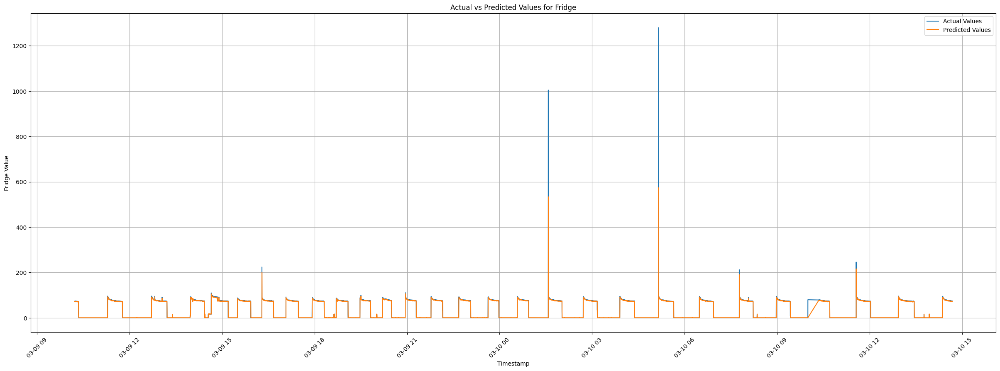

In [16]:
# Plot actual vs predicted values for Fridge
plt.figure(figsize=(30, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values')
plt.title('Actual vs Predicted Values for Fridge')
plt.xlabel('Timestamp')
plt.ylabel('Fridge Value')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

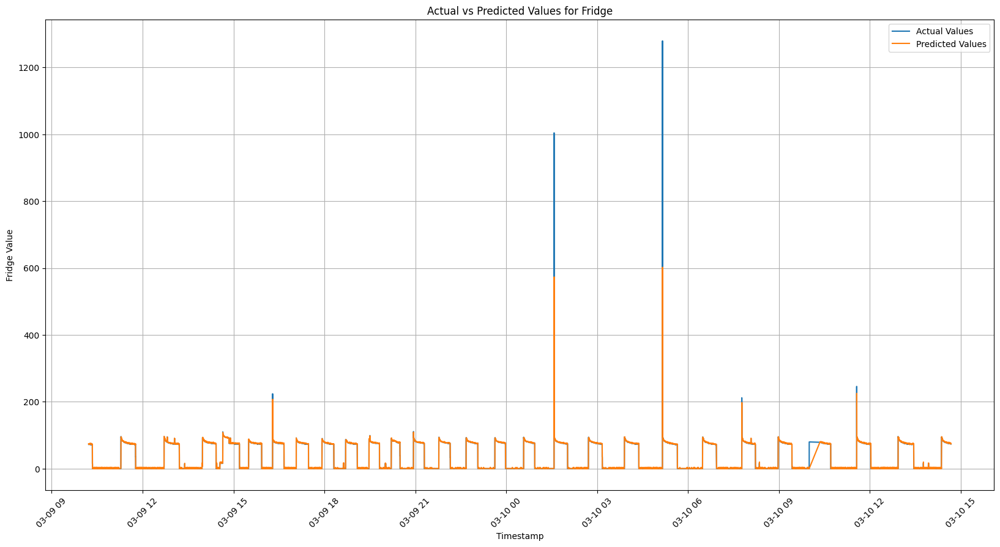

In [98]:
# Plot actual vs predicted values for Fridge
plt.figure(figsize=(20, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values')
plt.title('Actual vs Predicted Values for Fridge')
plt.xlabel('Timestamp')
plt.ylabel('Fridge Value')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

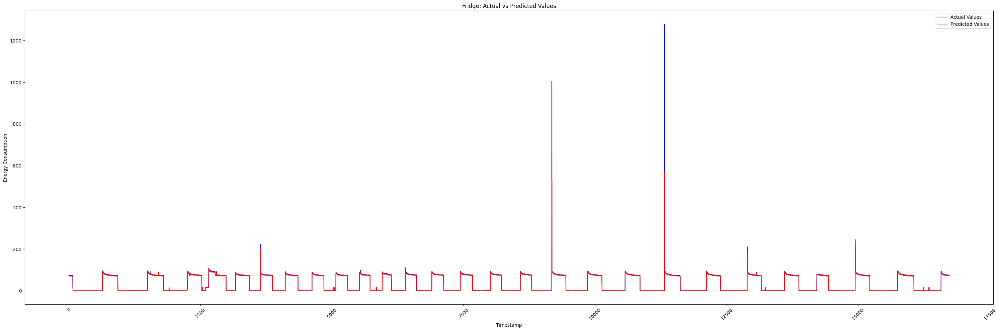

In [17]:
import matplotlib.pyplot as plt

# Set the timestamp as the index
#tv_output.set_index('Timestamp', inplace=True)

# Plot the actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(fridge_output.index, fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output.index, fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [36]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)

Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.020546
1  2014-03-09 10:13:15           21.0         21.020552
2  2014-03-09 10:13:20           21.0         21.020552
3  2014-03-09 10:13:27           21.0         21.020552
4  2014-03-09 10:13:29           21.0         21.020552
5  2014-03-09 10:13:34           21.0         21.020546
6  2014-03-09 10:13:43           21.0         21.020552
7  2014-03-09 10:13:48           21.0         21.020546
8  2014-03-09 10:13:57           21.0         21.020557
9  2014-03-09 10:14:02           21.0         21.020557
10 2014-03-09 10:14:12           21.0         21.020546
11 2014-03-09 10:14:16           21.0         21.020552
12 2014-03-09 10:14:19           21.0         21.020552
13 2014-03-09 10:14:26           21.0         21.020552
14 2014-03-09 10:14:31           21.0         21.020546
15 2014-03-09 10:14:33           21.0         21.020546
16 2014-03-09 10:14:45           21.

In [18]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)

Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.012157
1  2014-03-09 10:13:15           21.0         21.012127
2  2014-03-09 10:13:20           21.0         21.012127
3  2014-03-09 10:13:27           21.0         21.012127
4  2014-03-09 10:13:29           21.0         21.012127
5  2014-03-09 10:13:34           21.0         21.012157
6  2014-03-09 10:13:43           21.0         21.012127
7  2014-03-09 10:13:48           21.0         21.012157
8  2014-03-09 10:13:57           21.0         21.012096
9  2014-03-09 10:14:02           21.0         21.012096
10 2014-03-09 10:14:12           21.0         21.012157
11 2014-03-09 10:14:16           21.0         21.012127
12 2014-03-09 10:14:19           21.0         21.012127
13 2014-03-09 10:14:26           21.0         21.012127
14 2014-03-09 10:14:31           21.0         21.012157
15 2014-03-09 10:14:33           21.0         21.012157
16 2014-03-09 10:14:45           21.

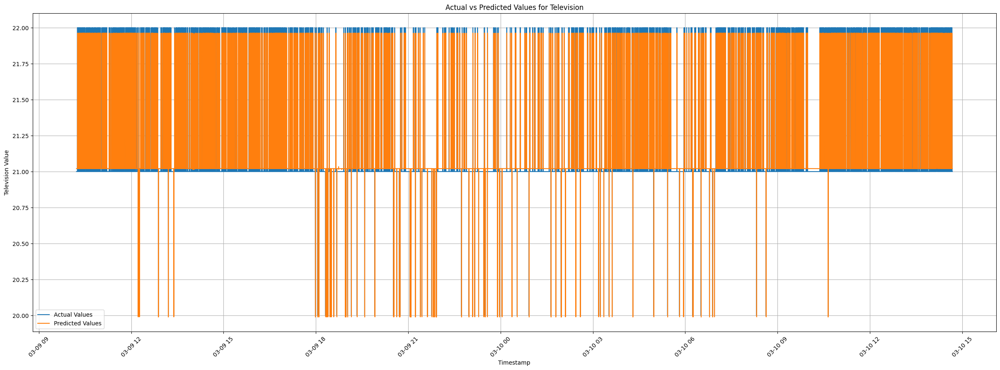

In [30]:
import matplotlib.pyplot as plt



# Plot actual vs predicted values for Television
plt.figure(figsize=(30, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values')
plt.title('Actual vs Predicted Values for Television')
plt.xlabel('Timestamp')
plt.ylabel('Television Value')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


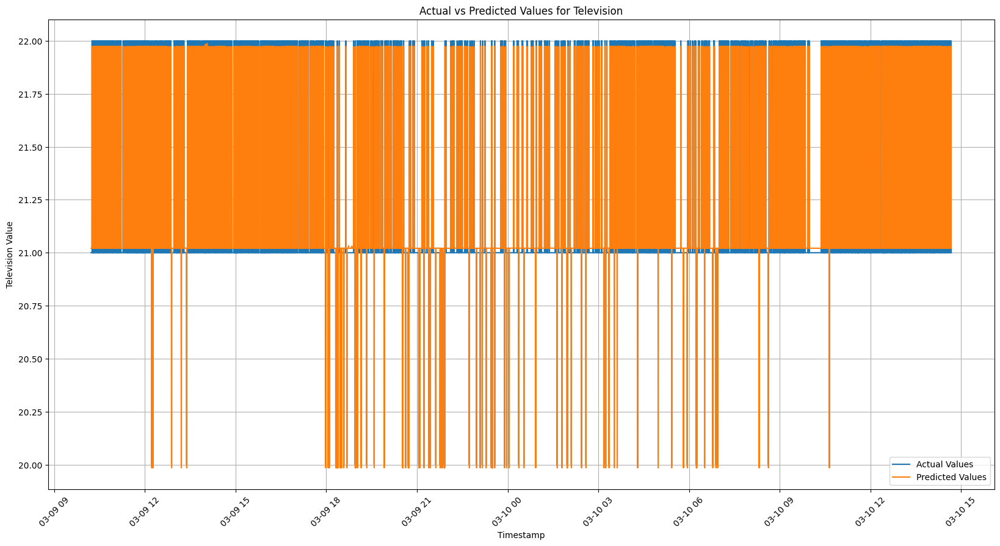

In [97]:
import matplotlib.pyplot as plt



# Plot actual vs predicted values for Television
plt.figure(figsize=(20, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values')
plt.title('Actual vs Predicted Values for Television')
plt.xlabel('Timestamp')
plt.ylabel('Television Value')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


In [29]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)

Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.020546
1  2014-03-09 10:13:15           21.0         21.020552
2  2014-03-09 10:13:20           21.0         21.020552
3  2014-03-09 10:13:27           21.0         21.020552
4  2014-03-09 10:13:29           21.0         21.020552
5  2014-03-09 10:13:34           21.0         21.020546
6  2014-03-09 10:13:43           21.0         21.020552
7  2014-03-09 10:13:48           21.0         21.020546
8  2014-03-09 10:13:57           21.0         21.020557
9  2014-03-09 10:14:02           21.0         21.020557
10 2014-03-09 10:14:12           21.0         21.020546
11 2014-03-09 10:14:16           21.0         21.020552
12 2014-03-09 10:14:19           21.0         21.020552
13 2014-03-09 10:14:26           21.0         21.020552
14 2014-03-09 10:14:31           21.0         21.020546
15 2014-03-09 10:14:33           21.0         21.020546
16 2014-03-09 10:14:45           21.

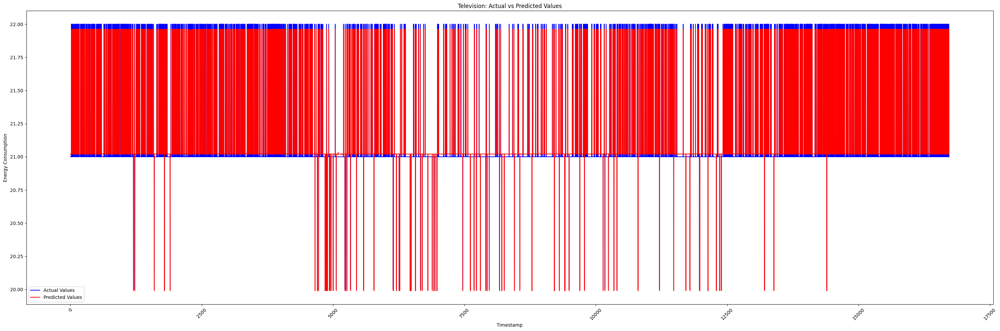

In [26]:
import matplotlib.pyplot as plt

# Set the timestamp as the index
#tv_output.set_index('Timestamp', inplace=True)

# Plot the actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(tv_output.index, tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output.index, tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


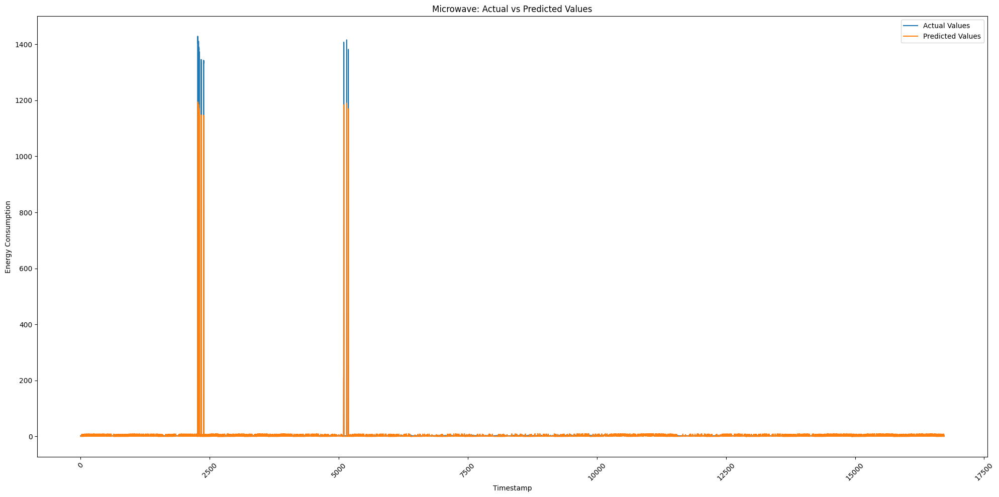

In [91]:
import matplotlib.pyplot as plt

# Set the timestamp as the index
#tv_output.set_index('Timestamp', inplace=True)

# Plot the actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(microwave_output.index, microwave_output['Actual Values'], label='Actual Values')
plt.plot(microwave_output.index, microwave_output['Predicted Values'], label='Predicted Values')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [88]:
# Microwave

microwave_output = pd.DataFrame({
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})


print("Microwave:")
print(microwave_output.head(20))

Microwave:
    Actual Values  Predicted Values
0             2.0          0.177955
1             2.0          0.188869
2             2.0          0.188869
3             2.0          0.188869
4             2.0          0.188869
5             2.0          0.177955
6             2.0          0.188869
7             2.0          0.177955
8             2.0          0.199836
9             2.0          0.199836
10            2.0          0.177955
11            2.0          0.188869
12            2.0          0.188869
13            2.0          0.188869
14            2.0          0.177955
15            2.0          0.177955
16            2.0          0.177955
17            2.0          0.188869
18            2.0          0.188869
19            2.0          0.188869


In [90]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
tv_outputmicrowave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


Microwave:
    Actual Values  Predicted Values
0             2.0          0.177955
1             2.0          0.188869
2             2.0          0.188869
3             2.0          0.188869
4             2.0          0.188869
5             2.0          0.177955
6             2.0          0.188869
7             2.0          0.177955
8             2.0          0.199836
9             2.0          0.199836
10            2.0          0.177955
11            2.0          0.188869
12            2.0          0.188869
13            2.0          0.188869
14            2.0          0.177955
15            2.0          0.177955
16            2.0          0.177955
17            2.0          0.188869
18            2.0          0.188869
19            2.0          0.188869


In [93]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          0.177955
1  2014-03-09 10:13:15            2.0          0.188869
2  2014-03-09 10:13:20            2.0          0.188869
3  2014-03-09 10:13:27            2.0          0.188869
4  2014-03-09 10:13:29            2.0          0.188869
5  2014-03-09 10:13:34            2.0          0.177955
6  2014-03-09 10:13:43            2.0          0.188869
7  2014-03-09 10:13:48            2.0          0.177955
8  2014-03-09 10:13:57            2.0          0.199836
9  2014-03-09 10:14:02            2.0          0.199836
10 2014-03-09 10:14:12            2.0          0.177955
11 2014-03-09 10:14:16            2.0          0.188869
12 2014-03-09 10:14:19            2.0          0.188869
13 2014-03-09 10:14:26            2.0          0.188869
14 2014-03-09 10:14:31            2.0          0.177955
15 2014-03-09 10:14:33            2.0          0.177955
16 2014-03-09 10:14:45            2.0

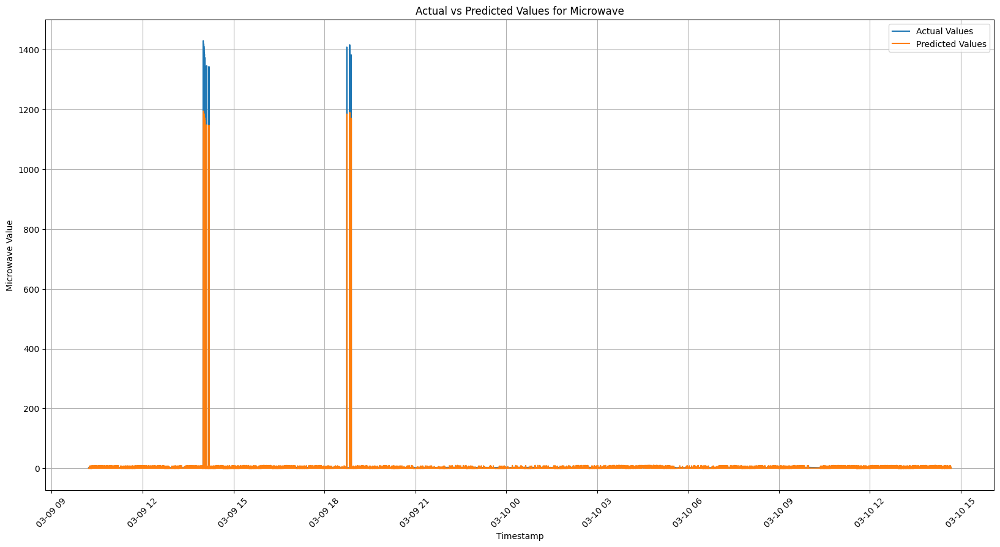

In [95]:
import matplotlib.pyplot as plt



# Plot actual vs predicted values for Microwave
plt.figure(figsize=(20, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values')
plt.title('Actual vs Predicted Values for Microwave')
plt.xlabel('Timestamp')
plt.ylabel('Microwave Value')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


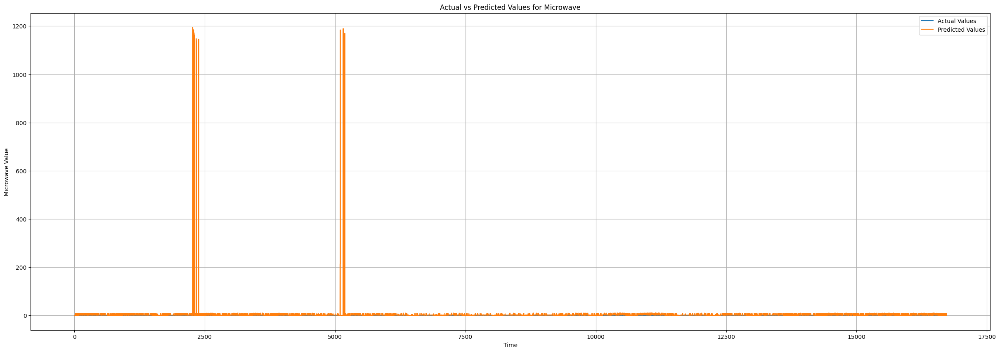

In [85]:
# Plot actual vs predicted values for Microwave
plt.figure(figsize=(30, 10))
plt.plot(microwave_output.index, microwave_output['Actual Values'], label='Actual Values')
plt.plot(microwave_output.index, microwave_output['Predicted Values'], label='Predicted Values')
plt.title('Actual vs Predicted Values for Microwave')
plt.xlabel('Time')
plt.ylabel('Microwave Value')
plt.legend()
plt.grid(True)
plt.show()

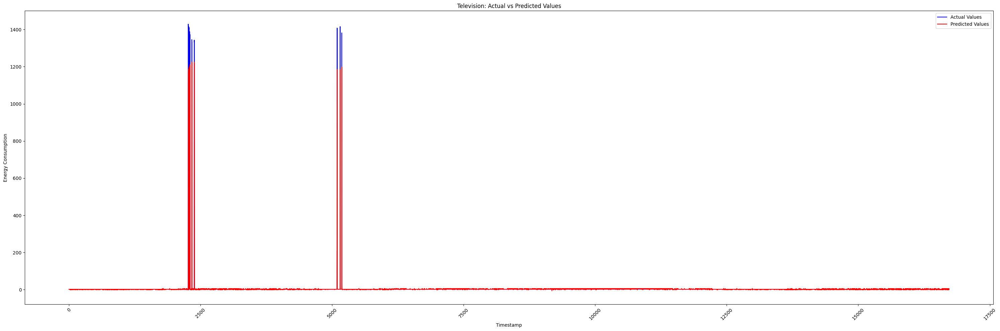

In [92]:
import matplotlib.pyplot as plt

# Set the timestamp as the index
#tv_output.set_index('Timestamp', inplace=True)

# Plot the actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(microwave_output.index, microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output.index, microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [21]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          9.342888
1  2014-03-09 10:13:15            2.0          9.339938
2  2014-03-09 10:13:20            2.0          9.339938
3  2014-03-09 10:13:27            2.0          9.339938
4  2014-03-09 10:13:29            2.0          9.339938
5  2014-03-09 10:13:34            2.0          9.342888
6  2014-03-09 10:13:43            2.0          9.339938
7  2014-03-09 10:13:48            2.0          9.342888
8  2014-03-09 10:13:57            2.0          9.336987
9  2014-03-09 10:14:02            2.0          9.336987
10 2014-03-09 10:14:12            2.0          9.342888
11 2014-03-09 10:14:16            2.0          9.339938
12 2014-03-09 10:14:19            2.0          9.339938
13 2014-03-09 10:14:26            2.0          9.339938
14 2014-03-09 10:14:31            2.0          9.342888
15 2014-03-09 10:14:33            2.0          9.342888
16 2014-03-09 10:14:45            2.0

In [48]:
def prepare_next_month_data(df):
    # Get the last timestamp in the dataset
    last_timestamp = df.index[-1]
    
    # Calculate the start and end timestamps for the next month
    next_month_start = last_timestamp + pd.DateOffset(months=1)
    next_month_end = next_month_start + pd.DateOffset(months=1) - pd.DateOffset(days=1)
    
    # Extract the data for the next month
    next_month_data = df.loc[next_month_start:next_month_end]
    
    # Check if next_month_data is empty
    if next_month_data.empty:
        print("No data available for the next month.")
        return None
    
    # Scale the data using the same scaler used for training data
    scaled_data = train_scalers[1].transform(next_month_data.values)
    
    # Prepare the data in sequences for LSTM
    X = []
    for i in range(len(scaled_data)):
        end_ix = i + 1
        if end_ix > len(scaled_data)-1:
            break
        seq_x = scaled_data[i:end_ix]
        X.append(seq_x)
    return np.array(X)


In [52]:
# Define a function to prepare data for the next month
def prepare_next_month_data(df):
    # Get the last timestamp in the dataset
    last_timestamp = df.index[-1]
    
    # Calculate the start and end timestamps for the next month
    next_month_start = last_timestamp + pd.DateOffset(months=1)
    next_month_end = next_month_start + pd.DateOffset(months=1) - pd.DateOffset(days=1)
    
    # Extract the data for the next month
    next_month_data = df.loc[next_month_start:next_month_end]
    
    # Check if next_month_data is empty
    if next_month_data.empty:
        print("No data available for the next month.")
        return None
    
    # Scale the data using the same scaler used for training data
    scaled_data = scaler.transform(next_month_data.values)
    
    # Prepare the data in sequences for LSTM
    X = []
    for i in range(len(scaled_data)):
        end_ix = i + 1
        if end_ix > len(scaled_data)-1:
            break
        seq_x = scaled_data[i:end_ix]
        X.append(seq_x)
    return np.array(X)

# Prepare data for the next month
next_month_data_house_1 = prepare_next_month_data(dfs[1])

if next_month_data_house_1 is not None:
    # Make predictions for the next month
    next_month_predictions_house_1 = model.predict(next_month_data_house_1)
    
    # Inverse transform the predictions to get the original scale of energy consumption
    next_month_predictions_house_1 = scaler.inverse_transform(next_month_predictions_house_1)
    
    # Print the predicted energy consumption for the next month
    print("Predicted Energy Consumption for Next Month (House 1):")
    print(next_month_predictions_house_1)





No data available for the next month.


In [47]:
# Define a function to train LSTM models for each house
def train_lstm_models(train_X, train_y):
    models = {}
    for house in range(1, 4):
        print(f"Training LSTM model for House {house}...")
        # Build the LSTM model
        model = build_lstm_model(input_shape=(train_X[house].shape[1], train_X[house].shape[2]))
        # Compile the model
        model.compile(loss='mse', optimizer='adam')
        # Train the model
        model.fit(train_X[house], train_y[house], epochs=10, batch_size=32, verbose=0)
        models[house] = model
    return models

# Train LSTM models for each house
trained_models = train_lstm_models(train_X, train_y)

# Define a function to predict energy consumption for the next month
def predict_next_month_energy(trained_models, test_X, test_scalers):
    predictions = {}
    for house in range(1, 4):
        print(f"Predicting energy consumption for House {house}...")
        # Predict energy consumption using the trained LSTM model
        house_predictions = trained_models[house].predict(test_X[house])
        # Inverse transform the predictions to get the original scale of energy consumption
        house_predictions = test_scalers[house].inverse_transform(house_predictions)
        predictions[house] = house_predictions
    return predictions

# Predict energy consumption for the next month
next_month_predictions = predict_next_month_energy(trained_models, test_X, test_scalers)

# Print the predictions for each house and appliance
for house, predictions in next_month_predictions.items():
    print(f"House {house} Predictions:")
    for appliance, prediction in enumerate(predictions.T):  # Transpose predictions to iterate over appliances
        print(f"Appliance {appliance + 1}: {prediction}")


Training LSTM model for House 1...
Training LSTM model for House 2...
Training LSTM model for House 3...
Predicting energy consumption for House 1...
523/523 [==============================] - 1s 1ms/step
Predicting energy consumption for House 2...
505/505 [==============================] - 1s 2ms/step
Predicting energy consumption for House 3...
529/529 [==============================] - 1s 1ms/step
House 1 Predictions:
Appliance 1: [75.325615 74.32587  74.32587  ... 76.325035 76.325035 75.325615]
Appliance 2: [20.985493 20.985523 20.985523 ... 20.985462 20.985462 20.985493]
Appliance 3: [-5.0961413 -5.1022305 -5.1022305 ... -5.0900702 -5.0900702 -5.0961413]
House 2 Predictions:
Appliance 1: [117.77479  117.77479  118.71367  ...   8.210494   8.210494   8.262266]
Appliance 2: [20.166304 20.166304 20.166225 ... 25.206694 25.206694 24.203047]
Appliance 3: [1.6681695 1.6681695 1.6668973 ... 1.8838906 1.8838906 1.9047152]
House 3 Predictions:
Appliance 1: [ 1.532703   1.532703   1.532703 

## Using the vanilla LSTM model we have just trained on house 1 to predict energy consumtion on house 2

In [21]:
# Assuming you already have the trained LSTM model stored in the variable 'model'

# Load and preprocess data for house 2
house_2_data = read_merge_data(2)  # Assuming you have a function to read and merge data
house_2_X, house_2_y, house_2_scaler = prepare_lstm_data(house_2_data)

# Predict energy consumption for house 2 using the trained model
house_2_predictions = model.predict(house_2_X)

# Inverse transform the predictions to get the original scale of energy consumption
house_2_predictions = house_2_scaler.inverse_transform(house_2_predictions)

# Evaluate the predictions using appropriate metrics
# For example, you can calculate Mean Squared Error (MSE), Root Mean Squared Error (RMSE), etc.
mse_house_2 = mean_squared_error(house_2_y, house_2_predictions)
rmse_house_2 = np.sqrt(mse_house_2)
mae_house_2 = mean_absolute_error(house_2_y, house_2_predictions)

print("House 2 Prediction Metrics:")
print("Mean Squared Error (MSE):", mse_house_2)
print("Root Mean Squared Error (RMSE):", rmse_house_2)
print("Mean Absolute Error (MAE):", mae_house_2)


NameError: name 'model' is not defined

In [115]:
# Load and preprocess data for house 2
house_2_data = read_merge_data(2)
house_2_X, house_2_y, house_2_scaler = prepare_lstm_data(house_2_data)

# Predict energy consumption for house 2 using the trained model on house 1
house_2_predictions = model.predict(house_2_X)

# Inverse transform the predictions to get the original scale of energy consumption
house_2_predictions = house_2_scaler.inverse_transform(house_2_predictions)
house_2_y = house_2_scaler.inverse_transform(house_2_y)

# Evaluate the predictions using appropriate metrics
mse_house_2 = mean_squared_error(house_2_y, house_2_predictions)
rmse_house_2 = np.sqrt(mse_house_2)
mae_house_2 = mean_absolute_error(house_2_y, house_2_predictions)

print("House 2 Prediction Metrics:")
print("Mean Squared Error (MSE):", mse_house_2)
print("Root Mean Squared Error (RMSE):", rmse_house_2)
print("Mean Absolute Error (MAE):", mae_house_2)


1683/1683 [==============================] - 3s 2ms/step
House 2 Prediction Metrics:
Mean Squared Error (MSE): 359.38390245856823
Root Mean Squared Error (RMSE): 18.957423412968552
Mean Absolute Error (MAE): 2.721022605719979


In [99]:
# Load and preprocess data for house 2
house_2_data = read_merge_data(2)
house_2_X, house_2_y, house_2_scaler = prepare_lstm_data(house_2_data)

# Predict energy consumption for house 2 using the trained model on house 1
house_2_predictions = model.predict(house_2_X)

# Inverse transform the predictions to get the original scale of energy consumption
house_2_predictions = house_2_scaler.inverse_transform(house_2_predictions)
house_2_y = house_2_scaler.inverse_transform(house_2_y)

# Evaluate the predictions using appropriate metrics
mse_house_2 = mean_squared_error(house_2_y, house_2_predictions)
rmse_house_2 = np.sqrt(mse_house_2)
mae_house_2 = mean_absolute_error(house_2_y, house_2_predictions)

print("House 2 Prediction Metrics:")
print("Mean Squared Error (MSE):", mse_house_2)
print("Root Mean Squared Error (RMSE):", rmse_house_2)
print("Mean Absolute Error (MAE):", mae_house_2)


1683/1683 [==============================] - 3s 2ms/step
House 2 Prediction Metrics:
Mean Squared Error (MSE): 272.9274841875866
Root Mean Squared Error (RMSE): 16.520517067803496
Mean Absolute Error (MAE): 2.55906810800114


In [102]:
# Determine the minimum length among timestamp_index, house_2_y, and house_2_predictions
min_length = min(len(timestamp_index), len(house_2_y), len(house_2_predictions))

# Slice the arrays to match the minimum length
timestamp_index = timestamp_index[:min_length]
house_2_y = house_2_y[:min_length]
house_2_predictions = house_2_predictions[:min_length]

# Create DataFrame for Microwave predictions
fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': house_2_y[:, 0],
    'Predicted Values': house_2_predictions[:, 0]
})

# Print the DataFrame for the Microwave appliance
print("Fridge:")
print(fridge_output.head(15))


Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13          117.0        113.591240
1  2014-03-09 10:13:15          116.0        114.509796
2  2014-03-09 10:13:20          115.0        113.591240
3  2014-03-09 10:13:27          115.0        112.671700
4  2014-03-09 10:13:29          115.0        112.671700
5  2014-03-09 10:13:34          116.0        112.671700
6  2014-03-09 10:13:43          116.0        113.591240
7  2014-03-09 10:13:48          116.0        113.591240
8  2014-03-09 10:13:57          116.0        113.591240
9  2014-03-09 10:14:02          116.0        113.591240
10 2014-03-09 10:14:12          115.0        113.591240
11 2014-03-09 10:14:16          115.0        112.671700
12 2014-03-09 10:14:19          115.0        112.671700
13 2014-03-09 10:14:26          115.0        112.671700
14 2014-03-09 10:14:31          115.0        112.671700


In [117]:
# Determine the minimum length among timestamp_index, house_2_y, and house_2_predictions
min_length = min(len(timestamp_index), len(house_2_y), len(house_2_predictions))

# Slice the arrays to match the minimum length
timestamp_index = timestamp_index[:min_length]
house_2_y = house_2_y[:min_length]
house_2_predictions = house_2_predictions[:min_length]

# Create DataFrame for Microwave predictions
fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': house_2_y[:, 0],
    'Predicted Values': house_2_predictions[:, 0]
})

# Print the DataFrame for the Microwave appliance
print("Fridge:")
print(fridge_output.head(20))


Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-10 02:09:45          117.0        112.972473
1  2014-03-10 02:09:48          116.0        113.864418
2  2014-03-10 02:09:59          115.0        112.972473
3  2014-03-10 02:10:02          115.0        112.079453
4  2014-03-10 02:10:14          115.0        112.079453
5  2014-03-10 02:10:16          116.0        112.079453
6  2014-03-10 02:10:18          116.0        112.972473
7  2014-03-10 02:10:28          116.0        112.972473
8  2014-03-10 02:10:31          116.0        112.972473
9  2014-03-10 02:10:33          116.0        112.972473
10 2014-03-10 02:10:45          115.0        112.972473
11 2014-03-10 02:10:47          115.0        112.079453
12 2014-03-10 02:10:59          115.0        112.079453
13 2014-03-10 02:11:01          115.0        112.079453
14 2014-03-10 02:11:13          115.0        112.079453
15 2014-03-10 02:11:16          115.0        112.079453
16 2014-03-10 02:11:19          115.0   

In [3]:
# Determine the minimum length among timestamp_index, house_2_y, and house_2_predictions
min_length = min(len(timestamp_index), len(house_2_y), len(house_2_predictions))

# Slice the arrays to match the minimum length
timestamp_index = timestamp_index[:min_length]
house_2_y = house_2_y[:min_length]
house_2_predictions = house_2_predictions[:min_length]

# Create DataFrame for Microwave predictions
fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': house_2_y[:, 0],
    'Predicted Values': house_2_predictions[:, 0]
})

# Print the DataFrame for the Microwave appliance
print("Fridge:")
print(fridge_output.head(20))


NameError: name 'timestamp_index' is not defined

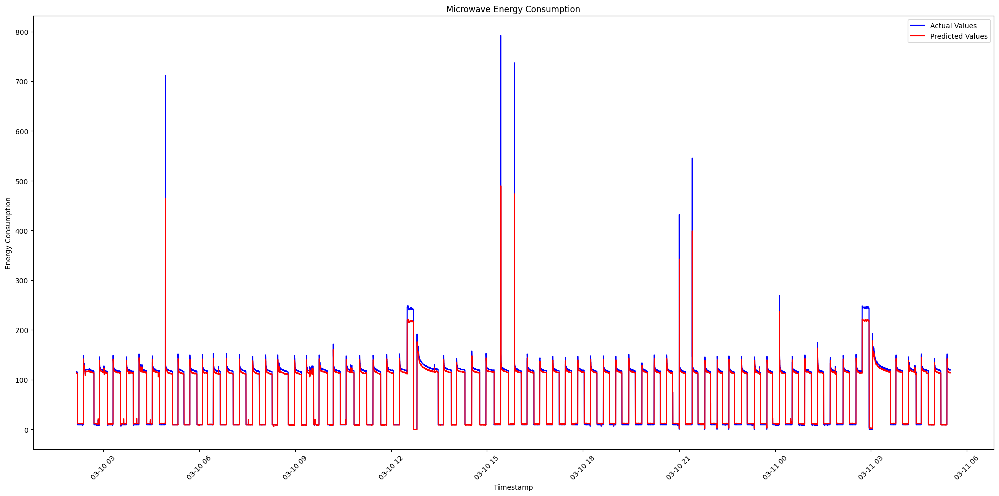

In [126]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave Energy Consumption')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [2]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge Energy Consumption')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


NameError: name 'fridge_output' is not defined

<Figure size 2000x1000 with 0 Axes>

In [119]:
# Determine the minimum length among timestamp_index, house_2_y, and house_2_predictions
min_length = min(len(timestamp_index), len(house_2_y), len(house_2_predictions))

# Slice the arrays to match the minimum length
timestamp_index = timestamp_index[:min_length]
house_2_y = house_2_y[:min_length]
house_2_predictions = house_2_predictions[:min_length]

# Create DataFrame for Microwave predictions
tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': house_2_y[:, 1],
    'Predicted Values': house_2_predictions[:, 1]
})

# Print the DataFrame for the Microwave appliance
print("Television:")
print(tv_output.head(20))


Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-10 02:09:45           20.0         20.592707
1  2014-03-10 02:09:48           20.0         20.592434
2  2014-03-10 02:09:59           20.0         20.592707
3  2014-03-10 02:10:02           20.0         20.592979
4  2014-03-10 02:10:14           20.0         20.592979
5  2014-03-10 02:10:16           20.0         20.592979
6  2014-03-10 02:10:18           20.0         20.592707
7  2014-03-10 02:10:28           20.0         20.592707
8  2014-03-10 02:10:31           20.0         20.592707
9  2014-03-10 02:10:33           20.0         20.592707
10 2014-03-10 02:10:45           20.0         20.592707
11 2014-03-10 02:10:47           20.0         20.592979
12 2014-03-10 02:10:59           20.0         20.592979
13 2014-03-10 02:11:01           20.0         20.592979
14 2014-03-10 02:11:13           20.0         20.592979
15 2014-03-10 02:11:16           20.0         20.592979
16 2014-03-10 02:11:19           20.

In [103]:
# Determine the minimum length among timestamp_index, house_2_y, and house_2_predictions
min_length = min(len(timestamp_index), len(house_2_y), len(house_2_predictions))

# Slice the arrays to match the minimum length
timestamp_index = timestamp_index[:min_length]
house_2_y = house_2_y[:min_length]
house_2_predictions = house_2_predictions[:min_length]

# Create DataFrame for Microwave predictions
tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': house_2_y[:, 1],
    'Predicted Values': house_2_predictions[:, 1]
})

# Print the DataFrame for the Microwave appliance
print("Television:")
print(tv_output.head(15))


Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           20.0         19.299025
1  2014-03-09 10:13:15           20.0         19.299265
2  2014-03-09 10:13:20           20.0         19.299025
3  2014-03-09 10:13:27           20.0         19.298786
4  2014-03-09 10:13:29           20.0         19.298786
5  2014-03-09 10:13:34           20.0         19.298786
6  2014-03-09 10:13:43           20.0         19.299025
7  2014-03-09 10:13:48           20.0         19.299025
8  2014-03-09 10:13:57           20.0         19.299025
9  2014-03-09 10:14:02           20.0         19.299025
10 2014-03-09 10:14:12           20.0         19.299025
11 2014-03-09 10:14:16           20.0         19.298786
12 2014-03-09 10:14:19           20.0         19.298786
13 2014-03-09 10:14:26           20.0         19.298786
14 2014-03-09 10:14:31           20.0         19.298786


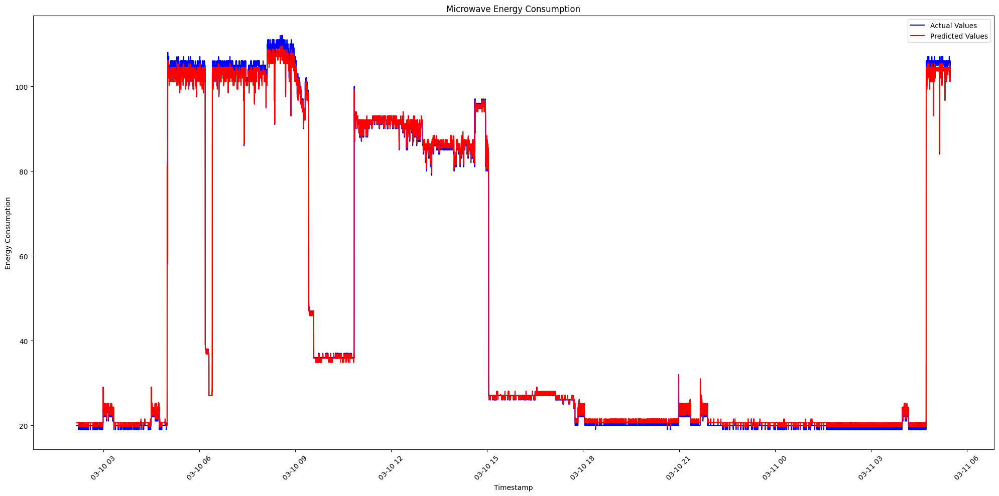

In [125]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave Energy Consumption')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [116]:
# Determine the minimum length among timestamp_index, house_2_y, and house_2_predictions
min_length = min(len(timestamp_index), len(house_2_y), len(house_2_predictions))

# Slice the arrays to match the minimum length
timestamp_index = timestamp_index[:min_length]
house_2_y = house_2_y[:min_length]
house_2_predictions = house_2_predictions[:min_length]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': house_2_y[:, 2],
    'Predicted Values': house_2_predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-10 02:09:45            1.0          2.684291
1  2014-03-10 02:09:48            1.0          2.674863
2  2014-03-10 02:09:59            1.0          2.684291
3  2014-03-10 02:10:02            1.0          2.693611
4  2014-03-10 02:10:14            1.0          2.693611
5  2014-03-10 02:10:16            1.0          2.693611
6  2014-03-10 02:10:18            1.0          2.684291
7  2014-03-10 02:10:28            1.0          2.684291
8  2014-03-10 02:10:31            1.0          2.684291
9  2014-03-10 02:10:33            1.0          2.684291
10 2014-03-10 02:10:45            1.0          2.684291
11 2014-03-10 02:10:47            1.0          2.693611
12 2014-03-10 02:10:59            1.0          2.693611
13 2014-03-10 02:11:01            1.0          2.693611
14 2014-03-10 02:11:13            1.0          2.693611
15 2014-03-10 02:11:16            1.0          2.693611
16 2014-03-10 02:11:19            1.0

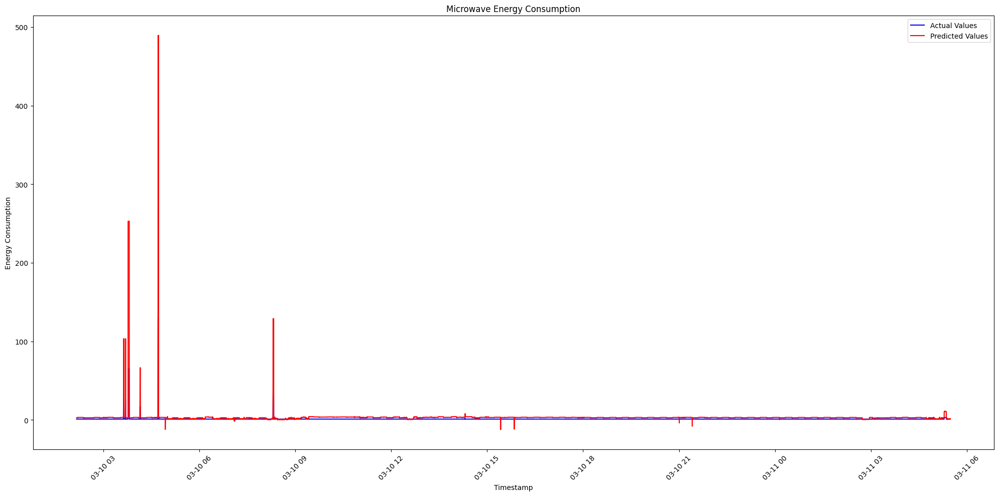

In [124]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave Energy Consumption')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Predicting energy consumption for House 1...
523/523 [==============================] - 1s 3ms/step
Predicting energy consumption for House 2...
505/505 [==============================] - 1s 2ms/step
Predicting energy consumption for House 3...
529/529 [==============================] - 1s 1ms/step


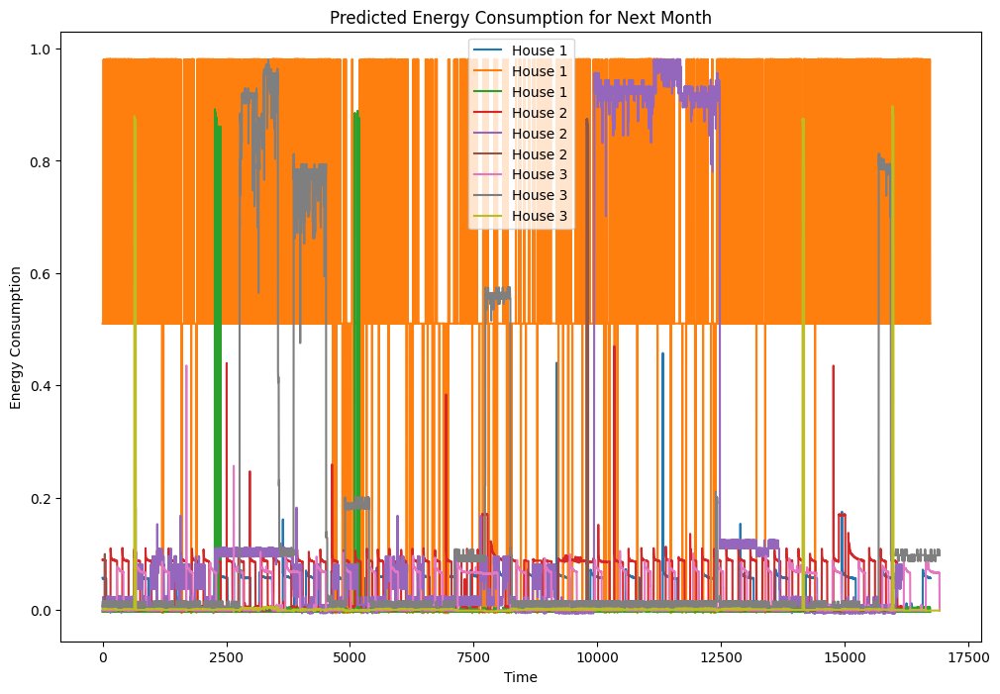

In [45]:
# Predict the energy consumption for the next month
num_future_steps = 30 * 24  # Assuming hourly data and 30 days
predicted_values = {}
for house in range(1, 4):
    print(f"Predicting energy consumption for House {house}...")
    predicted_values[house] = model.predict(test_X[house])

# Plot the predicted energy consumption for each house
plt.figure(figsize=(12, 8))
for house in range(1, 4):
    plt.plot(predicted_values[house], label=f'House {house}')

plt.title('Predicted Energy Consumption for Next Month')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.legend()
plt.show()

## STACKED LSTM

In [6]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Define a function to build a stacked LSTM model
def stacked_lstm(input_shape):

    stacked_model = Sequential()
    stacked_model.add(LSTM(units=64, activation='relu', return_sequences=True, input_shape=input_shape))
    stacked_model.add(LSTM(units=64, activation='relu'))
    stacked_model.add(Dense(units=3))  
    return stacked_model


stacked_model = stacked_lstm(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))


stacked_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 64)             17408     
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 3)                 195       
                                                                 
Total params: 50627 (197.76 KB)
Trainable params: 50627 (197.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [106]:
# stacked LSTM model
def stacked_lstm(input_shape):

    stacked_model = Sequential()
    stacked_model.add(LSTM(units=64, activation='relu', return_sequences=True, input_shape=input_shape))
    stacked_model.add(LSTM(units=64, activation='relu'))
    stacked_model.add(Dense(units=3))  
    return stacked_model


stacked_model = stacked_lstm(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))


stacked_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 1, 64)             17408     
                                                                 
 lstm_2 (LSTM)               (None, 64)                33024     
                                                                 
 dense_2 (Dense)             (None, 3)                 195       
                                                                 
Total params: 50627 (197.76 KB)
Trainable params: 50627 (197.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [108]:
# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the vanilla LSTM model 
stacked_model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])




In [110]:

history_stacked= stacked_model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))



Epoch 1/100
1220/1220 [==============================] - 9s 4ms/step - loss: 0.0015 - accuracy: 0.9972 - val_loss: 0.0159 - val_accuracy: 0.9913
Epoch 2/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.3107e-04 - accuracy: 0.9988 - val_loss: 0.0150 - val_accuracy: 0.9912
Epoch 3/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.2200e-04 - accuracy: 0.9988 - val_loss: 0.0141 - val_accuracy: 0.9913
Epoch 4/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.2165e-04 - accuracy: 0.9988 - val_loss: 0.0135 - val_accuracy: 0.9912
Epoch 5/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.2352e-04 - accuracy: 0.9988 - val_loss: 0.0134 - val_accuracy: 0.9913
Epoch 6/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.2291e-04 - accuracy: 0.9988 - val_loss: 0.0131 - val_accuracy: 0.9913
Epoch 7/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.1565e-04 - accuracy: 0.9988 - v

In [8]:

history_stacked= stacked_model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))



Epoch 1/100
1220/1220 [==============================] - 8s 4ms/step - loss: 0.0015 - accuracy: 0.9982 - val_loss: 0.0154 - val_accuracy: 0.9911
Epoch 2/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.2568e-04 - accuracy: 0.9989 - val_loss: 0.0136 - val_accuracy: 0.9913
Epoch 3/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1947e-04 - accuracy: 0.9988 - val_loss: 0.0132 - val_accuracy: 0.9913
Epoch 4/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.1805e-04 - accuracy: 0.9988 - val_loss: 0.0127 - val_accuracy: 0.9909
Epoch 5/100
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1521e-04 - accuracy: 0.9988 - val_loss: 0.0127 - val_accuracy: 0.9903
Epoch 6/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1912e-04 - accuracy: 0.9987 - val_loss: 0.0129 - val_accuracy: 0.9903
Epoch 7/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1660e-04 - accuracy: 0.9988 - v

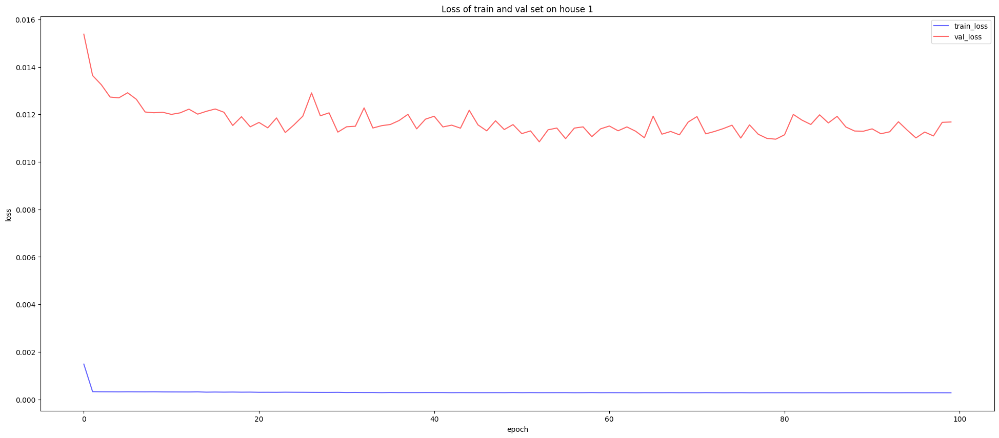

In [9]:
train_loss = history_stacked.history['loss']
val_loss = history_stacked.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Loss of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

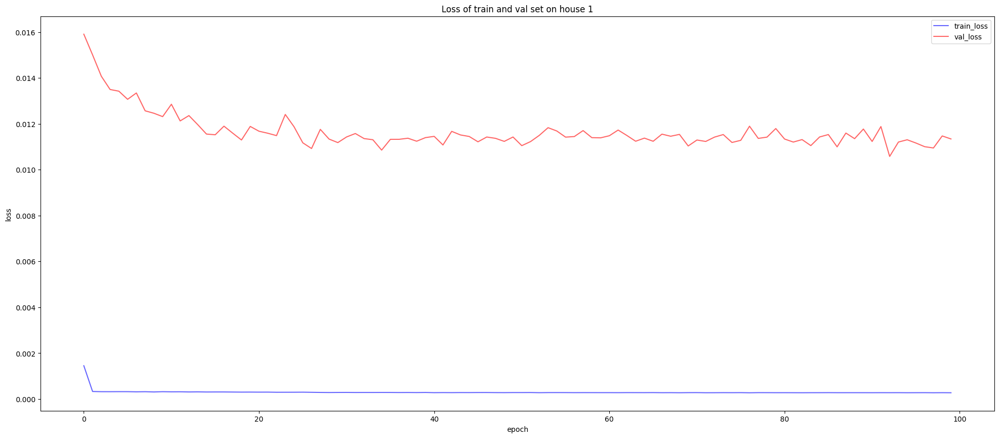

In [111]:
train_loss = history_stacked.history['loss']
val_loss = history_stacked.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Loss of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

In [112]:
# Evaluataccuracye the model on test data
loss, accuracy = stacked_model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 3s 2ms/step - loss: 2.6776e-04 - accuracy: 0.9989
Train Loss: 0.0002677601296454668
Train Accuracy:  0.9989240169525146


In [113]:
# Evaluate the model on test data
loss, accuracy = stacked_model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 2ms/step - loss: 0.0113 - accuracy: 0.9913
Test Loss: 0.011339866556227207
Test Accuracy:  0.9912720918655396


In [10]:
# Evaluataccuracye the model on test data
loss, accuracy = stacked_model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 2s 2ms/step - loss: 2.7905e-04 - accuracy: 0.9987
Test Loss: 0.00027905163005925715
Train Accuracy:  0.9986677765846252


In [109]:
# Evaluataccuracye the model on test data
loss, accuracy = stacked_model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 3s 2ms/step - loss: 0.0189 - accuracy: 0.3068
Train Loss: 0.0188914742320776
Train Accuracy:  0.3067916929721832


In [11]:
# Evaluate the model on test data
loss, accuracy = stacked_model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 2ms/step - loss: 0.0117 - accuracy: 0.9913
Test Loss: 0.011679313145577908
Test Accuracy:  0.9912720918655396


In [18]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = stacked_model.predict(test_X[1])

import numpy as np


# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)


# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 1612.9092571746314
Root Mean Squared Error (RMSE): 40.16104153498302
Mean Absolute Error (MAE): 33.99031508646642


In [114]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = stacked_model.predict(test_X[1])

import numpy as np


# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)


# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 2s 2ms/step
Mean Squared Error (MSE): 637.7904153383629
Root Mean Squared Error (RMSE): 25.254512771747606
Mean Absolute Error (MAE): 20.12800181159717


In [14]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = stacked_model.predict(test_X[1])

import numpy as np

# Reshape predictions array to 2D
#predictions = np.reshape(predictions, (-1, predictions.shape[2]))

# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)

actual_values = test_y[1]



# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(test_y[1], predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 1s 3ms/step
Mean Squared Error (MSE): 2830.608613784277
Root Mean Squared Error (RMSE): 53.20346430247073
Mean Absolute Error (MAE): 33.99031508646642


In [16]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = stacked_model.predict(test_X[1])

predictions = test_scalers[1].inverse_transform(predictions)


# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(test_y[1], predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 2830.608613784277
Root Mean Squared Error (RMSE): 53.20346430247073
Mean Absolute Error (MAE): 33.99031508646642


In [19]:
# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         66.162994
1  2014-03-09 10:13:15           73.0         65.082726
2  2014-03-09 10:13:20           73.0         65.082726
3  2014-03-09 10:13:27           73.0         65.082726
4  2014-03-09 10:13:29           74.0         65.082726
5  2014-03-09 10:13:34           73.0         66.162994
6  2014-03-09 10:13:43           74.0         65.082726
7  2014-03-09 10:13:48           72.0         66.162994
8  2014-03-09 10:13:57           72.0         64.001884
9  2014-03-09 10:14:02           74.0         64.001884
10 2014-03-09 10:14:12           73.0         66.162994
11 2014-03-09 10:14:16           73.0         65.082726
12 2014-03-09 10:14:19           73.0         65.082726
13 2014-03-09 10:14:26           74.0         65.082726
14 2014-03-09 10:14:31           74.0         66.162994
15 2014-03-09 10:14:33           74.0         66.162994
16 2014-03-09 10:14:45           73.0   

In [115]:
# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         69.971039
1  2014-03-09 10:13:15           73.0         68.809975
2  2014-03-09 10:13:20           73.0         68.809975
3  2014-03-09 10:13:27           73.0         68.809975
4  2014-03-09 10:13:29           74.0         68.809975
5  2014-03-09 10:13:34           73.0         69.971039
6  2014-03-09 10:13:43           74.0         68.809975
7  2014-03-09 10:13:48           72.0         69.971039
8  2014-03-09 10:13:57           72.0         67.647263
9  2014-03-09 10:14:02           74.0         67.647263
10 2014-03-09 10:14:12           73.0         69.971039
11 2014-03-09 10:14:16           73.0         68.809975
12 2014-03-09 10:14:19           73.0         68.809975
13 2014-03-09 10:14:26           74.0         68.809975
14 2014-03-09 10:14:31           74.0         69.971039
15 2014-03-09 10:14:33           74.0         69.971039
16 2014-03-09 10:14:45           73.0   

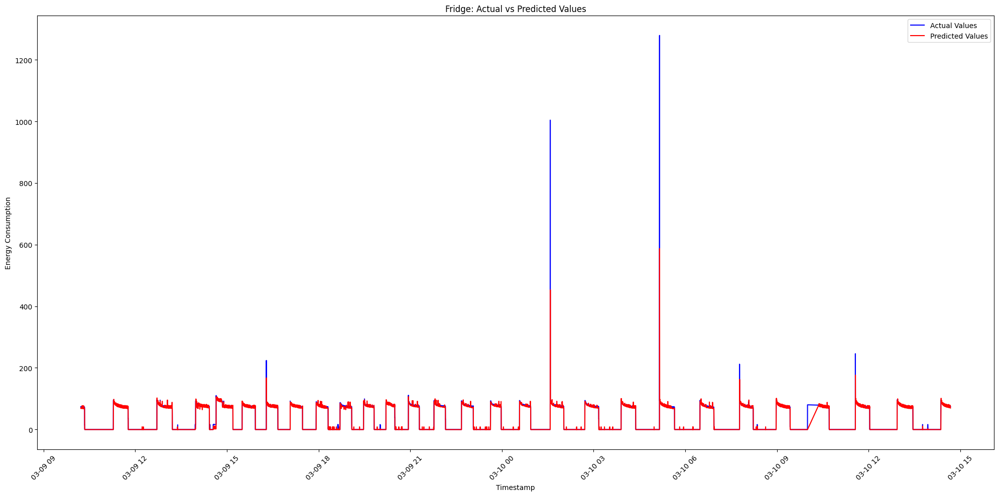

In [116]:
import matplotlib.pyplot as plt


# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [21]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)



Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.121775
1  2014-03-09 10:13:15           21.0         21.121801
2  2014-03-09 10:13:20           21.0         21.121801
3  2014-03-09 10:13:27           21.0         21.121801
4  2014-03-09 10:13:29           21.0         21.121801
5  2014-03-09 10:13:34           21.0         21.121775
6  2014-03-09 10:13:43           21.0         21.121801
7  2014-03-09 10:13:48           21.0         21.121775
8  2014-03-09 10:13:57           21.0         21.121826
9  2014-03-09 10:14:02           21.0         21.121826
10 2014-03-09 10:14:12           21.0         21.121775
11 2014-03-09 10:14:16           21.0         21.121801
12 2014-03-09 10:14:19           21.0         21.121801
13 2014-03-09 10:14:26           21.0         21.121801
14 2014-03-09 10:14:31           21.0         21.121775
15 2014-03-09 10:14:33           21.0         21.121775
16 2014-03-09 10:14:45           21.

In [117]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)



Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.119202
1  2014-03-09 10:13:15           21.0         21.118828
2  2014-03-09 10:13:20           21.0         21.118828
3  2014-03-09 10:13:27           21.0         21.118828
4  2014-03-09 10:13:29           21.0         21.118828
5  2014-03-09 10:13:34           21.0         21.119202
6  2014-03-09 10:13:43           21.0         21.118828
7  2014-03-09 10:13:48           21.0         21.119202
8  2014-03-09 10:13:57           21.0         21.118454
9  2014-03-09 10:14:02           21.0         21.118454
10 2014-03-09 10:14:12           21.0         21.119202
11 2014-03-09 10:14:16           21.0         21.118828
12 2014-03-09 10:14:19           21.0         21.118828
13 2014-03-09 10:14:26           21.0         21.118828
14 2014-03-09 10:14:31           21.0         21.119202
15 2014-03-09 10:14:33           21.0         21.119202
16 2014-03-09 10:14:45           21.

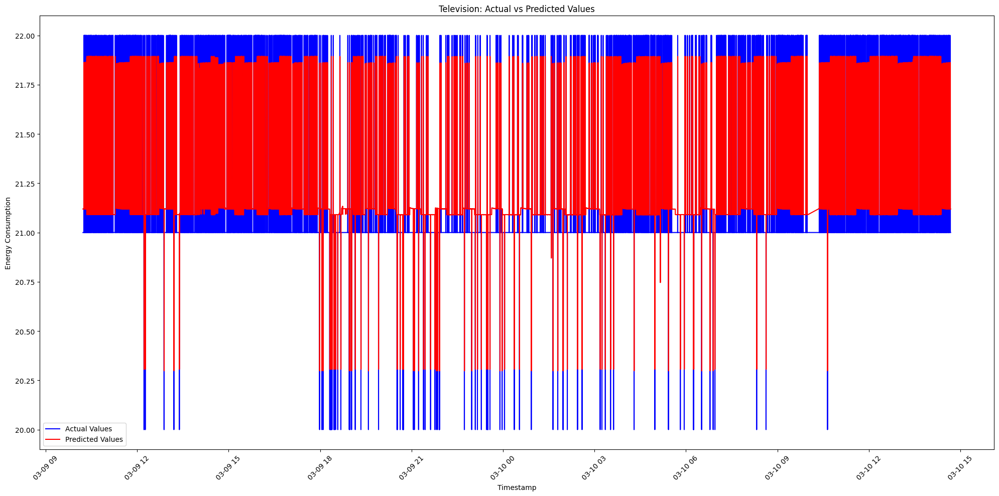

In [118]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


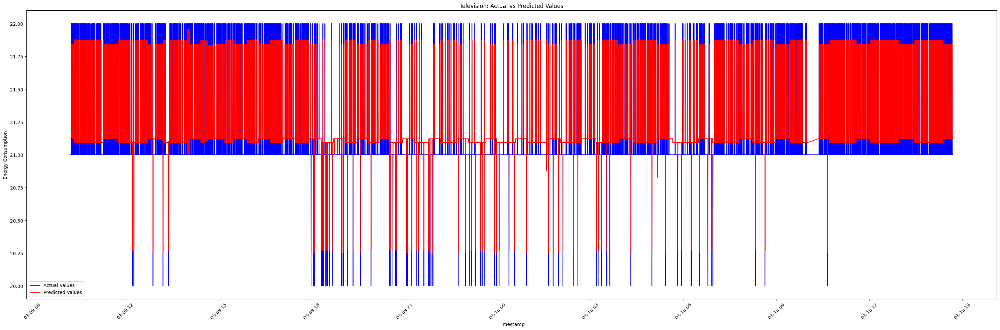

In [26]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [23]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))




Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0         14.337162
1  2014-03-09 10:13:15            2.0         14.307002
2  2014-03-09 10:13:20            2.0         14.307002
3  2014-03-09 10:13:27            2.0         14.307002
4  2014-03-09 10:13:29            2.0         14.307002
5  2014-03-09 10:13:34            2.0         14.337162
6  2014-03-09 10:13:43            2.0         14.307002
7  2014-03-09 10:13:48            2.0         14.337162
8  2014-03-09 10:13:57            2.0         14.276645
9  2014-03-09 10:14:02            2.0         14.276645
10 2014-03-09 10:14:12            2.0         14.337162
11 2014-03-09 10:14:16            2.0         14.307002
12 2014-03-09 10:14:19            2.0         14.307002
13 2014-03-09 10:14:26            2.0         14.307002
14 2014-03-09 10:14:31            2.0         14.337162
15 2014-03-09 10:14:33            2.0         14.337162
16 2014-03-09 10:14:45            2.0

In [119]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))




Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          5.628614
1  2014-03-09 10:13:15            2.0          5.636516
2  2014-03-09 10:13:20            2.0          5.636516
3  2014-03-09 10:13:27            2.0          5.636516
4  2014-03-09 10:13:29            2.0          5.636516
5  2014-03-09 10:13:34            2.0          5.628614
6  2014-03-09 10:13:43            2.0          5.636516
7  2014-03-09 10:13:48            2.0          5.628614
8  2014-03-09 10:13:57            2.0          5.644355
9  2014-03-09 10:14:02            2.0          5.644355
10 2014-03-09 10:14:12            2.0          5.628614
11 2014-03-09 10:14:16            2.0          5.636516
12 2014-03-09 10:14:19            2.0          5.636516
13 2014-03-09 10:14:26            2.0          5.636516
14 2014-03-09 10:14:31            2.0          5.628614
15 2014-03-09 10:14:33            2.0          5.628614
16 2014-03-09 10:14:45            2.0

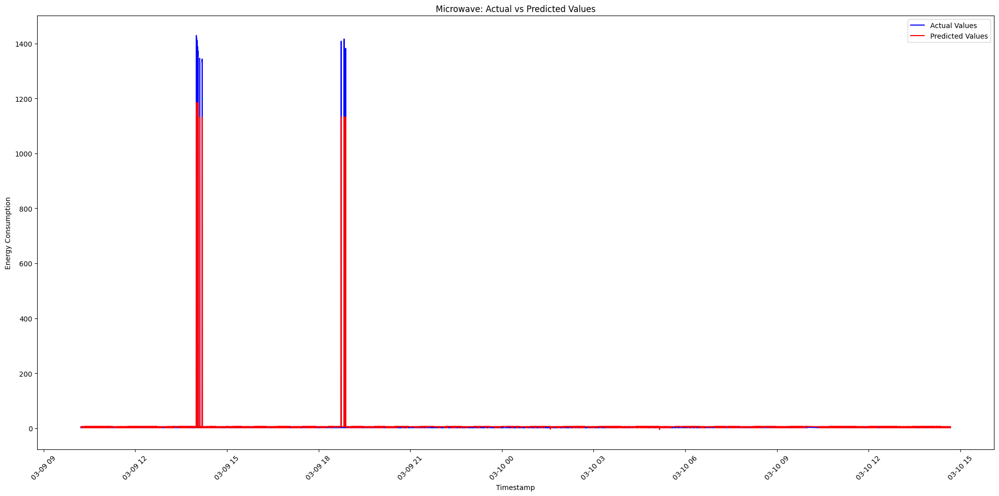

In [120]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



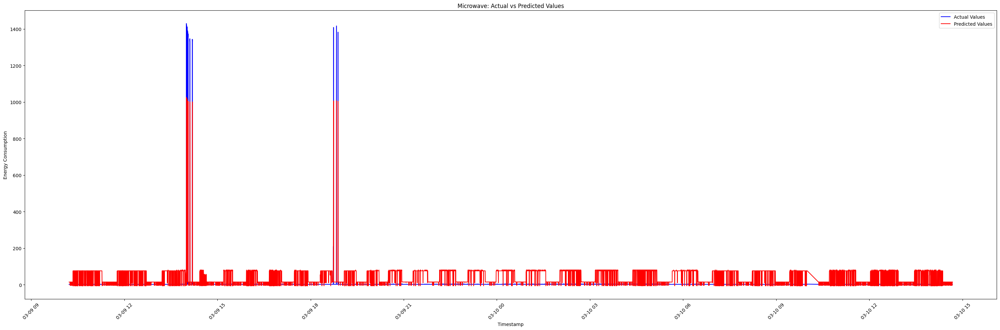

In [27]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



## BIDIRECTIONAL LSTM

In [121]:
from keras.layers import Bidirectional


# Bidirectional LSTM model architecture
def build_bidirectional_lstm_model(input_shape):
    bidirectional_model = Sequential([
        Bidirectional(LSTM(units=64), input_shape=input_shape),
        Dense(units=3)  
    ])
    return bidirectional_model


bidirectional_model = build_bidirectional_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

bidirectional_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirection  (None, 128)               34816     
 al)                                                             
                                                                 
 dense_3 (Dense)             (None, 3)                 387       
                                                                 
Total params: 35203 (137.51 KB)
Trainable params: 35203 (137.51 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [122]:
# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the bidirectional LSTM mode
bidirectional_model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])




In [31]:
# Train the bidirectional LSTM model
history_bi = bidirectional_model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))


Epoch 1/100
1220/1220 [==============================] - 6s 5ms/step - loss: 3.1374e-04 - accuracy: 0.9988 - val_loss: 0.0131 - val_accuracy: 0.9898
Epoch 2/100
1220/1220 [==============================] - 6s 5ms/step - loss: 3.0958e-04 - accuracy: 0.9987 - val_loss: 0.0130 - val_accuracy: 0.9898
Epoch 3/100
1220/1220 [==============================] - 5s 4ms/step - loss: 3.1334e-04 - accuracy: 0.9988 - val_loss: 0.0131 - val_accuracy: 0.9872
Epoch 4/100
1220/1220 [==============================] - 7s 6ms/step - loss: 3.1056e-04 - accuracy: 0.9987 - val_loss: 0.0132 - val_accuracy: 0.9903
Epoch 5/100
1220/1220 [==============================] - 7s 6ms/step - loss: 3.1314e-04 - accuracy: 0.9988 - val_loss: 0.0133 - val_accuracy: 0.9872
Epoch 6/100
1220/1220 [==============================] - 7s 6ms/step - loss: 3.1244e-04 - accuracy: 0.9988 - val_loss: 0.0132 - val_accuracy: 0.9885
Epoch 7/100
1220/1220 [==============================] - 6s 5ms/step - loss: 3.1053e-04 - accuracy: 0.9987

In [123]:
# Train the bidirectional LSTM model
history_bi = bidirectional_model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))


Epoch 1/100
1220/1220 [==============================] - 11s 5ms/step - loss: 9.4395e-04 - accuracy: 0.9967 - val_loss: 0.0142 - val_accuracy: 0.9903
Epoch 2/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1714e-04 - accuracy: 0.9987 - val_loss: 0.0139 - val_accuracy: 0.9902
Epoch 3/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1768e-04 - accuracy: 0.9988 - val_loss: 0.0138 - val_accuracy: 0.9903
Epoch 4/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1728e-04 - accuracy: 0.9988 - val_loss: 0.0136 - val_accuracy: 0.9903
Epoch 5/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1404e-04 - accuracy: 0.9988 - val_loss: 0.0136 - val_accuracy: 0.9903
Epoch 6/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1807e-04 - accuracy: 0.9988 - val_loss: 0.0137 - val_accuracy: 0.9903
Epoch 7/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1616e-04 - accuracy: 0.998

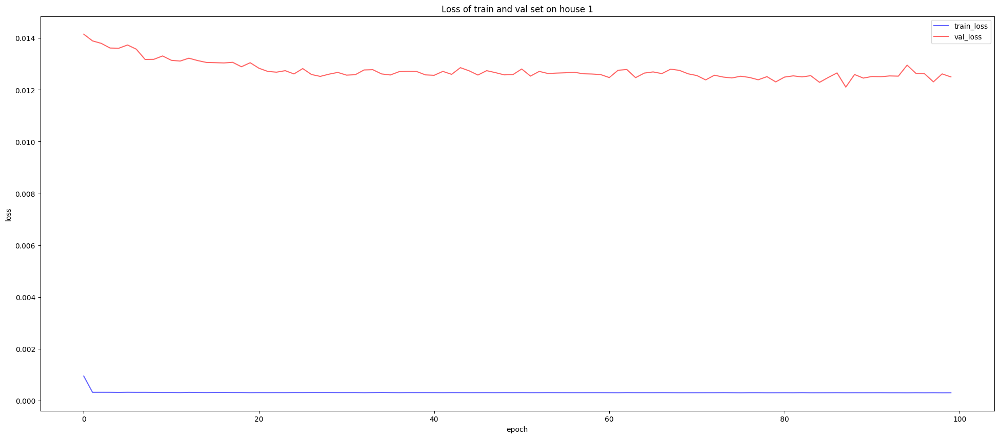

In [124]:
train_loss = history_bi.history['loss']
val_loss = history_bi.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Loss of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

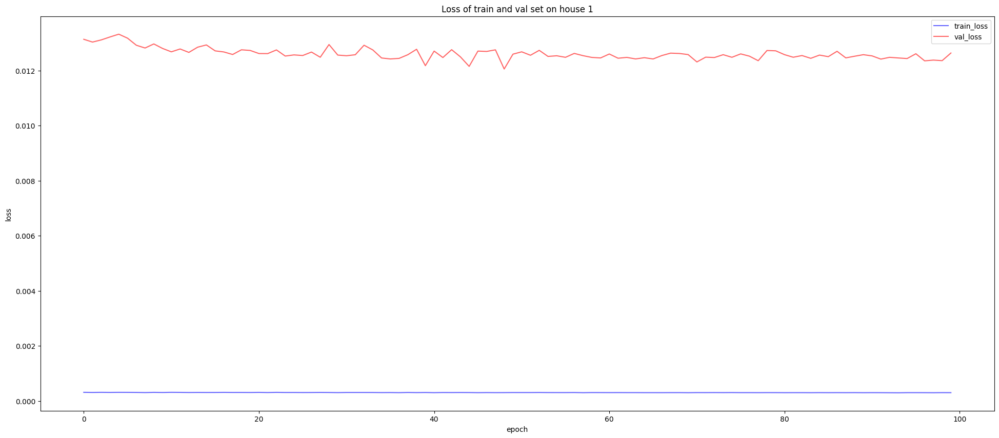

In [37]:
train_loss = history_bi.history['loss']
val_loss = history_bi.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Loss of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

In [125]:
# Evaluataccuracye the model on test data
loss, accuracy = bidirectional_model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 3s 2ms/step - loss: 3.0229e-04 - accuracy: 0.9988
Train Loss: 0.0003022892924491316
Train Accuracy:  0.9987958669662476


In [126]:
# Evaluate the model on test data
loss, accuracy = stacked_model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 3ms/step - loss: 0.0113 - accuracy: 0.9913
Test Loss: 0.011339866556227207
Test Accuracy:  0.9912720918655396


In [38]:
# Evaluataccuracye the model on test data
loss, accuracy = bidirectional_model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 2s 2ms/step - loss: 2.9417e-04 - accuracy: 0.9988
Train Loss: 0.00029417380574159324
Train Accuracy:  0.9987958669662476


In [39]:
# Evaluate the model on test data
loss, accuracy = stacked_model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 2ms/step - loss: 0.0117 - accuracy: 0.9913
Test Loss: 0.011679313145577908
Test Accuracy:  0.9912720918655396


In [41]:
# Predict energy consumption using the trained LSTM model
predictions = bidirectional_model.predict(test_X[1])


# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)


# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])



# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 2s 3ms/step
Mean Squared Error (MSE): 682.6797004595395
Root Mean Squared Error (RMSE): 26.128140011480717
Mean Absolute Error (MAE): 20.261306151843733


In [40]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = bidirectional_model.predict(test_X[1])

predictions = test_scalers[1].inverse_transform(predictions)


# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(test_y[1], predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 2830.608613784277
Root Mean Squared Error (RMSE): 53.20346430247073
Mean Absolute Error (MAE): 33.99031508646642


In [127]:
# Predict energy consumption using the trained LSTM model
predictions = bidirectional_model.predict(test_X[1])


# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)


# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])



# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 2s 2ms/step
Mean Squared Error (MSE): 698.7939968458771
Root Mean Squared Error (RMSE): 26.43471196827908
Mean Absolute Error (MAE): 22.48530845731052


In [42]:
import matplotlib.pyplot as plt

# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)


Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         69.864799
1  2014-03-09 10:13:15           73.0         68.956444
2  2014-03-09 10:13:20           73.0         68.956444
3  2014-03-09 10:13:27           73.0         68.956444
4  2014-03-09 10:13:29           74.0         68.956444
5  2014-03-09 10:13:34           73.0         69.864799
6  2014-03-09 10:13:43           74.0         68.956444
7  2014-03-09 10:13:48           72.0         69.864799
8  2014-03-09 10:13:57           72.0         68.047043
9  2014-03-09 10:14:02           74.0         68.047043
10 2014-03-09 10:14:12           73.0         69.864799
11 2014-03-09 10:14:16           73.0         68.956444
12 2014-03-09 10:14:19           73.0         68.956444
13 2014-03-09 10:14:26           74.0         68.956444
14 2014-03-09 10:14:31           74.0         69.864799
15 2014-03-09 10:14:33           74.0         69.864799
16 2014-03-09 10:14:45           73.0   

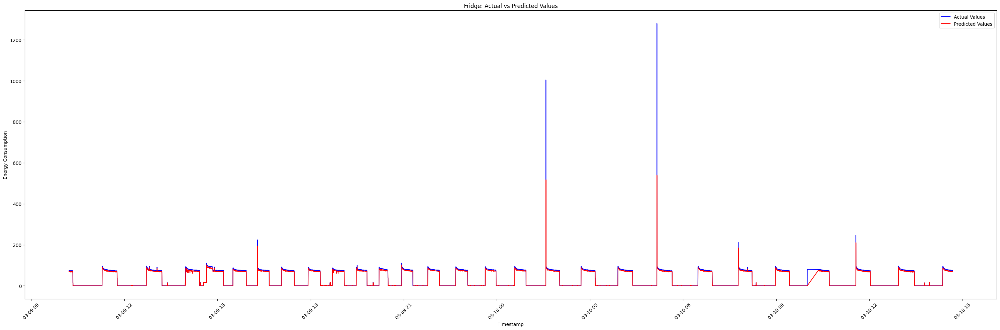

In [45]:
# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [128]:
import matplotlib.pyplot as plt

# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)


Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         75.437988
1  2014-03-09 10:13:15           73.0         74.548180
2  2014-03-09 10:13:20           73.0         74.548180
3  2014-03-09 10:13:27           73.0         74.548180
4  2014-03-09 10:13:29           74.0         74.548180
5  2014-03-09 10:13:34           73.0         75.437988
6  2014-03-09 10:13:43           74.0         74.548180
7  2014-03-09 10:13:48           72.0         75.437988
8  2014-03-09 10:13:57           72.0         73.657402
9  2014-03-09 10:14:02           74.0         73.657402
10 2014-03-09 10:14:12           73.0         75.437988
11 2014-03-09 10:14:16           73.0         74.548180
12 2014-03-09 10:14:19           73.0         74.548180
13 2014-03-09 10:14:26           74.0         74.548180
14 2014-03-09 10:14:31           74.0         75.437988
15 2014-03-09 10:14:33           74.0         75.437988
16 2014-03-09 10:14:45           73.0   

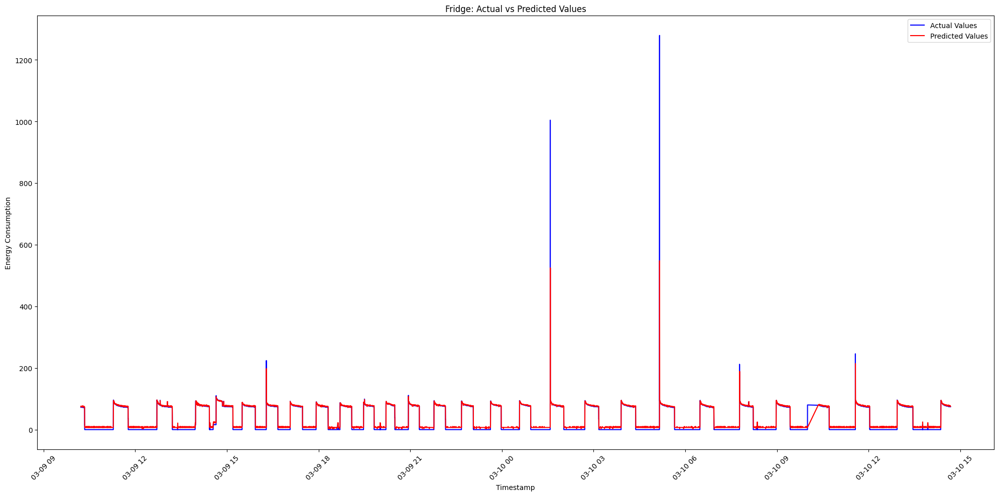

In [130]:
# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [46]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)







Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.019825
1  2014-03-09 10:13:15           21.0         21.019812
2  2014-03-09 10:13:20           21.0         21.019812
3  2014-03-09 10:13:27           21.0         21.019812
4  2014-03-09 10:13:29           21.0         21.019812
5  2014-03-09 10:13:34           21.0         21.019825
6  2014-03-09 10:13:43           21.0         21.019812
7  2014-03-09 10:13:48           21.0         21.019825
8  2014-03-09 10:13:57           21.0         21.019798
9  2014-03-09 10:14:02           21.0         21.019798
10 2014-03-09 10:14:12           21.0         21.019825
11 2014-03-09 10:14:16           21.0         21.019812
12 2014-03-09 10:14:19           21.0         21.019812
13 2014-03-09 10:14:26           21.0         21.019812
14 2014-03-09 10:14:31           21.0         21.019825
15 2014-03-09 10:14:33           21.0         21.019825
16 2014-03-09 10:14:45           21.

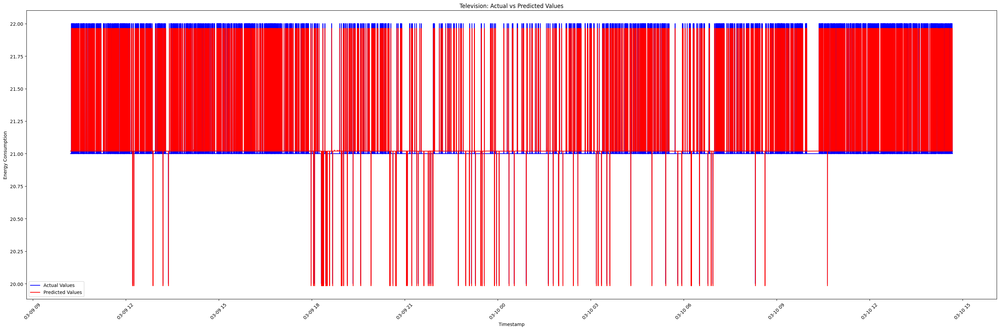

In [47]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [131]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)







Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.010021
1  2014-03-09 10:13:15           21.0         21.010014
2  2014-03-09 10:13:20           21.0         21.010014
3  2014-03-09 10:13:27           21.0         21.010014
4  2014-03-09 10:13:29           21.0         21.010014
5  2014-03-09 10:13:34           21.0         21.010021
6  2014-03-09 10:13:43           21.0         21.010014
7  2014-03-09 10:13:48           21.0         21.010021
8  2014-03-09 10:13:57           21.0         21.010006
9  2014-03-09 10:14:02           21.0         21.010006
10 2014-03-09 10:14:12           21.0         21.010021
11 2014-03-09 10:14:16           21.0         21.010014
12 2014-03-09 10:14:19           21.0         21.010014
13 2014-03-09 10:14:26           21.0         21.010014
14 2014-03-09 10:14:31           21.0         21.010021
15 2014-03-09 10:14:33           21.0         21.010021
16 2014-03-09 10:14:45           21.

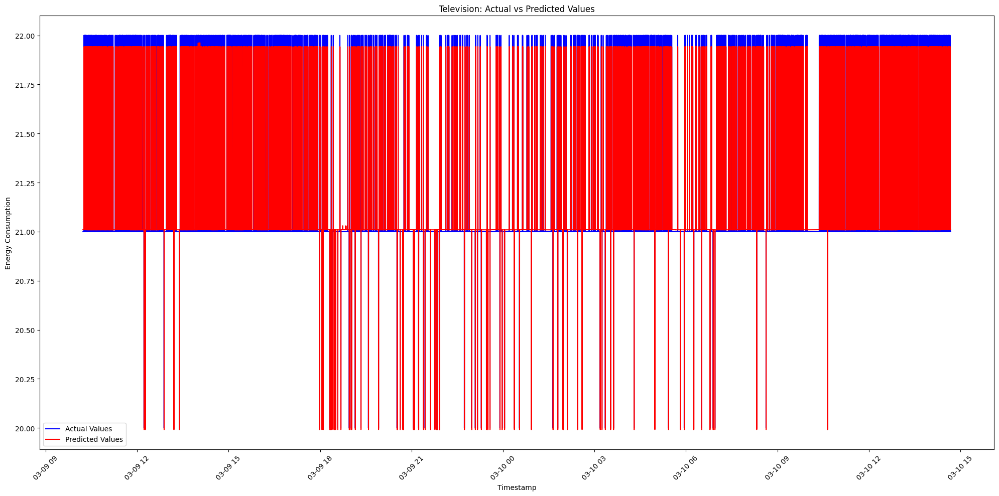

In [132]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [48]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))





Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          5.488373
1  2014-03-09 10:13:15            2.0          5.475907
2  2014-03-09 10:13:20            2.0          5.475907
3  2014-03-09 10:13:27            2.0          5.475907
4  2014-03-09 10:13:29            2.0          5.475907
5  2014-03-09 10:13:34            2.0          5.488373
6  2014-03-09 10:13:43            2.0          5.475907
7  2014-03-09 10:13:48            2.0          5.488373
8  2014-03-09 10:13:57            2.0          5.463479
9  2014-03-09 10:14:02            2.0          5.463479
10 2014-03-09 10:14:12            2.0          5.488373
11 2014-03-09 10:14:16            2.0          5.475907
12 2014-03-09 10:14:19            2.0          5.475907
13 2014-03-09 10:14:26            2.0          5.475907
14 2014-03-09 10:14:31            2.0          5.488373
15 2014-03-09 10:14:33            2.0          5.488373
16 2014-03-09 10:14:45            2.0

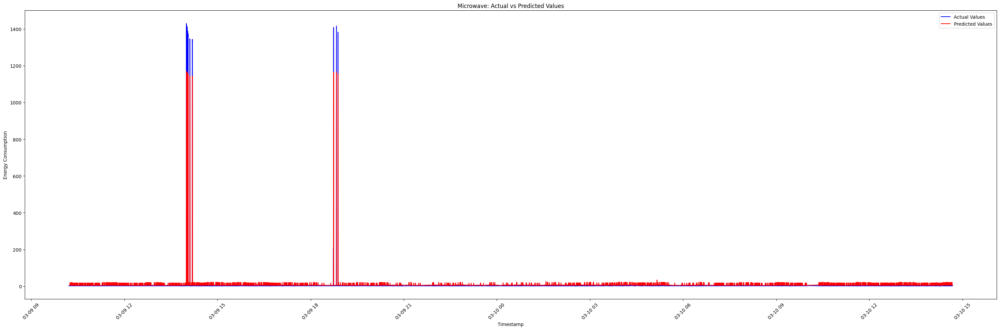

In [49]:

import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [133]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))





Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          4.827633
1  2014-03-09 10:13:15            2.0          4.833965
2  2014-03-09 10:13:20            2.0          4.833965
3  2014-03-09 10:13:27            2.0          4.833965
4  2014-03-09 10:13:29            2.0          4.833965
5  2014-03-09 10:13:34            2.0          4.827633
6  2014-03-09 10:13:43            2.0          4.833965
7  2014-03-09 10:13:48            2.0          4.827633
8  2014-03-09 10:13:57            2.0          4.840259
9  2014-03-09 10:14:02            2.0          4.840259
10 2014-03-09 10:14:12            2.0          4.827633
11 2014-03-09 10:14:16            2.0          4.833965
12 2014-03-09 10:14:19            2.0          4.833965
13 2014-03-09 10:14:26            2.0          4.833965
14 2014-03-09 10:14:31            2.0          4.827633
15 2014-03-09 10:14:33            2.0          4.827633
16 2014-03-09 10:14:45            2.0

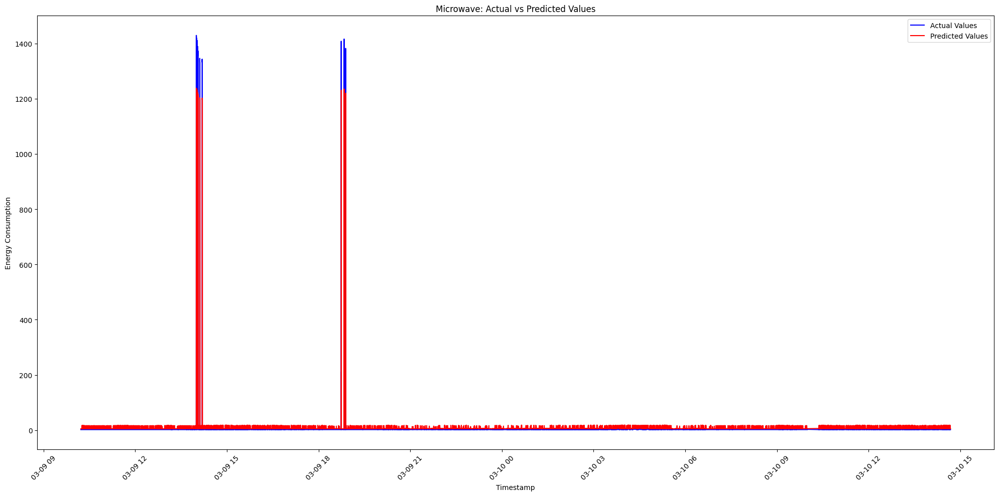

In [134]:

import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(20, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Gated Recurrent Unit

In [22]:
from keras.layers import GRU

# Define GRU model architecture
def build_gru_model(input_shape):
    model = Sequential([
        GRU(units=64, input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting 3 features
    ])
    return model

# Compile the model
model = build_gru_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 64)                13248     
                                                                 
 dense_1 (Dense)             (None, 3)                 195       
                                                                 
Total params: 13443 (52.51 KB)
Trainable params: 13443 (52.51 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [23]:
learning_rate = 0.001
optimizer = Adam(learning_rate=learning_rate)

model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])


In [24]:
# Train the model
history = model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))



Epoch 1/100
1220/1220 [==============================] - 8s 4ms/step - loss: 7.2067e-04 - accuracy: 0.9985 - val_loss: 0.0133 - val_accuracy: 0.9903
Epoch 2/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.2079e-04 - accuracy: 0.9988 - val_loss: 0.0134 - val_accuracy: 0.9903
Epoch 3/100
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1722e-04 - accuracy: 0.9988 - val_loss: 0.0135 - val_accuracy: 0.9872
Epoch 4/100
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1362e-04 - accuracy: 0.9988 - val_loss: 0.0132 - val_accuracy: 0.9903
Epoch 5/100
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1479e-04 - accuracy: 0.9987 - val_loss: 0.0135 - val_accuracy: 0.9885
Epoch 6/100
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1842e-04 - accuracy: 0.9988 - val_loss: 0.0132 - val_accuracy: 0.9885
Epoch 7/100
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1823e-04 - accuracy: 0.9988

In [25]:
# Evaluate the model on test data
loss, accuracy = model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy:", accuracy)



1220/1220 [==============================] - 2s 1ms/step - loss: 2.9591e-04 - accuracy: 0.9988
Train Loss: 0.00029590699705295265
Train Accuracy: 0.9987958669662476


In [26]:
# Evaluate the model on test data
loss, accuracy = model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)



523/523 [==============================] - 1s 2ms/step - loss: 0.0127 - accuracy: 0.9872
Test Loss: 0.01273349393159151
Test Accuracy: 0.9872070550918579


In [27]:
# Optionally, save the trained model
model.save('gru_model.h5')


In [28]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, predictions)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_values, predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 2s 2ms/step
Mean Squared Error (MSE): 679.1009436918972
Root Mean Squared Error (RMSE): 26.059565301284234
Mean Absolute Error (MAE): 1.8021561340050674


In [39]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_y[1]

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, predictions)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_values, predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 2191.02598473642
Root Mean Squared Error (RMSE): 46.808396519603406
Mean Absolute Error (MAE): 19.468361032123664


In [29]:
import matplotlib.pyplot as plt

# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)


Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         74.473267
1  2014-03-09 10:13:15           73.0         73.512009
2  2014-03-09 10:13:20           73.0         73.512009
3  2014-03-09 10:13:27           73.0         73.512009
4  2014-03-09 10:13:29           74.0         73.512009
5  2014-03-09 10:13:34           73.0         74.473267
6  2014-03-09 10:13:43           74.0         73.512009
7  2014-03-09 10:13:48           72.0         74.473267
8  2014-03-09 10:13:57           72.0         72.549774
9  2014-03-09 10:14:02           74.0         72.549774
10 2014-03-09 10:14:12           73.0         74.473267
11 2014-03-09 10:14:16           73.0         73.512009
12 2014-03-09 10:14:19           73.0         73.512009
13 2014-03-09 10:14:26           74.0         73.512009
14 2014-03-09 10:14:31           74.0         74.473267
15 2014-03-09 10:14:33           74.0         74.473267
16 2014-03-09 10:14:45           73.0   

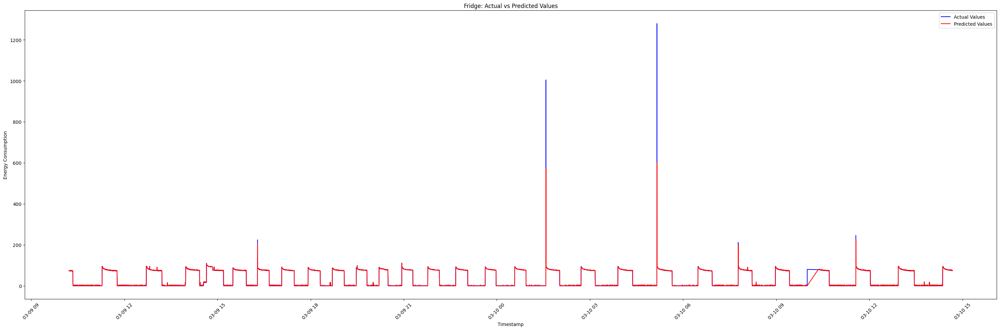

In [30]:
# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [31]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))


Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.021000
1  2014-03-09 10:13:15           21.0         21.021008
2  2014-03-09 10:13:20           21.0         21.021008
3  2014-03-09 10:13:27           21.0         21.021008
4  2014-03-09 10:13:29           21.0         21.021008
5  2014-03-09 10:13:34           21.0         21.021000
6  2014-03-09 10:13:43           21.0         21.021008
7  2014-03-09 10:13:48           21.0         21.021000
8  2014-03-09 10:13:57           21.0         21.021013
9  2014-03-09 10:14:02           21.0         21.021013
10 2014-03-09 10:14:12           21.0         21.021000
11 2014-03-09 10:14:16           21.0         21.021008
12 2014-03-09 10:14:19           21.0         21.021008
13 2014-03-09 10:14:26           21.0         21.021008
14 2014-03-09 10:14:31           21.0         21.021000
15 2014-03-09 10:14:33           21.0         21.021000
16 2014-03-09 10:14:45           21.

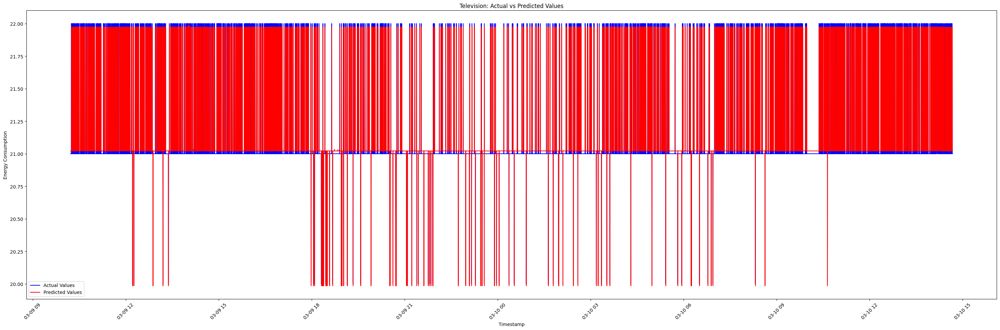

In [32]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [35]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          0.177955
1  2014-03-09 10:13:15            2.0          0.188869
2  2014-03-09 10:13:20            2.0          0.188869
3  2014-03-09 10:13:27            2.0          0.188869
4  2014-03-09 10:13:29            2.0          0.188869
5  2014-03-09 10:13:34            2.0          0.177955
6  2014-03-09 10:13:43            2.0          0.188869
7  2014-03-09 10:13:48            2.0          0.177955
8  2014-03-09 10:13:57            2.0          0.199836
9  2014-03-09 10:14:02            2.0          0.199836
10 2014-03-09 10:14:12            2.0          0.177955
11 2014-03-09 10:14:16            2.0          0.188869
12 2014-03-09 10:14:19            2.0          0.188869
13 2014-03-09 10:14:26            2.0          0.188869
14 2014-03-09 10:14:31            2.0          0.177955
15 2014-03-09 10:14:33            2.0          0.177955
16 2014-03-09 10:14:45            2.0

In [41]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output)


Microwave:
                Timestamp  Actual Values  Predicted Values
0     2014-03-09 10:13:13       0.000000          0.177955
1     2014-03-09 10:13:15       0.000000          0.188869
2     2014-03-09 10:13:20       0.000000          0.188869
3     2014-03-09 10:13:27       0.000000          0.188869
4     2014-03-09 10:13:29       0.000000          0.188869
...                   ...            ...               ...
16723 2014-03-10 14:40:18       0.000701          1.235789
16724 2014-03-10 14:40:29       0.000000          1.235789
16725 2014-03-10 14:40:32       0.000000          0.167042
16726 2014-03-10 14:40:33       0.000000          0.167042
16727 2014-03-10 14:40:46       0.000000          0.177955

[16728 rows x 3 columns]


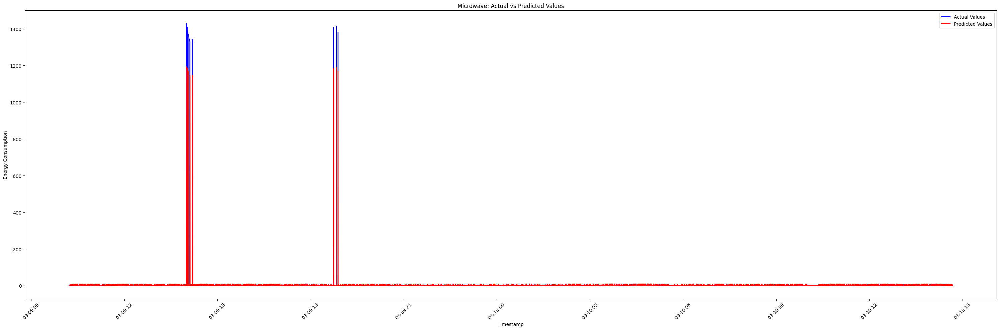

In [36]:
import matplotlib.pyplot as plt

# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [38]:
import pandas as pd

# Inverse transform predictions using the scaler
predictions = test_scalers[1].inverse_transform(predictions)

# Create a DataFrame with Timestamp, Actual Values, and Predicted Values
df_output = pd.DataFrame({
     # Assuming test_data[1] contains the timestamp index
    'Actual Values': actual_values[:, 2],  # Assuming we're predicting energy consumption for the first appliance
    'Predicted Values': predictions[:, 2]  # Assuming we're predicting energy consumption for the first appliance
})

# Display the DataFrame
print("Fridge:")
print(df_output)


Fridge:
       Actual Values  Predicted Values
0                2.0      3.652316e+05
1                2.0      3.874555e+05
2                2.0      3.874555e+05
3                2.0      3.874555e+05
4                2.0      3.874555e+05
...              ...               ...
16723            3.0      2.519330e+06
16724            2.0      2.519330e+06
16725            2.0      3.430076e+05
16726            2.0      3.430076e+05
16727            2.0      3.652316e+05

[16728 rows x 2 columns]


## Vanilla LSTM

In [53]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.optimizers import Adam

# Define LSTM model architecture
def vanilla_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64,  input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting 3 features
    ])
    return model

# Compile the model
model = vanilla_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

model.summary()



Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 64)                17408     
                                                                 
 dense_3 (Dense)             (None, 3)                 195       
                                                                 
Total params: 17603 (68.76 KB)
Trainable params: 17603 (68.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [54]:

# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the vanilla LSTM model 
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])



In [55]:
#model.compile(loss='mse', optimizer='adam')  # Using Mean Squared Error loss and Adam optimizer

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=100, batch_size=32, validation_data=(test_X[1], test_y[1]))



Epoch 1/100
1220/1220 [==============================] - 7s 4ms/step - loss: 0.0013 - accuracy: 0.9966 - val_loss: 0.0144 - val_accuracy: 0.9903
Epoch 2/100
1220/1220 [==============================] - 4s 3ms/step - loss: 3.0901e-04 - accuracy: 0.9988 - val_loss: 0.0143 - val_accuracy: 0.9903
Epoch 3/100
1220/1220 [==============================] - 6s 5ms/step - loss: 3.1565e-04 - accuracy: 0.9988 - val_loss: 0.0142 - val_accuracy: 0.9903
Epoch 4/100
1220/1220 [==============================] - 7s 5ms/step - loss: 3.1512e-04 - accuracy: 0.9989 - val_loss: 0.0141 - val_accuracy: 0.9903
Epoch 5/100
1220/1220 [==============================] - 8s 7ms/step - loss: 3.1199e-04 - accuracy: 0.9988 - val_loss: 0.0138 - val_accuracy: 0.9903
Epoch 6/100
1220/1220 [==============================] - 6s 5ms/step - loss: 3.1404e-04 - accuracy: 0.9988 - val_loss: 0.0136 - val_accuracy: 0.9903
Epoch 7/100
1220/1220 [==============================] - 7s 5ms/step - loss: 3.1224e-04 - accuracy: 0.9988 - v

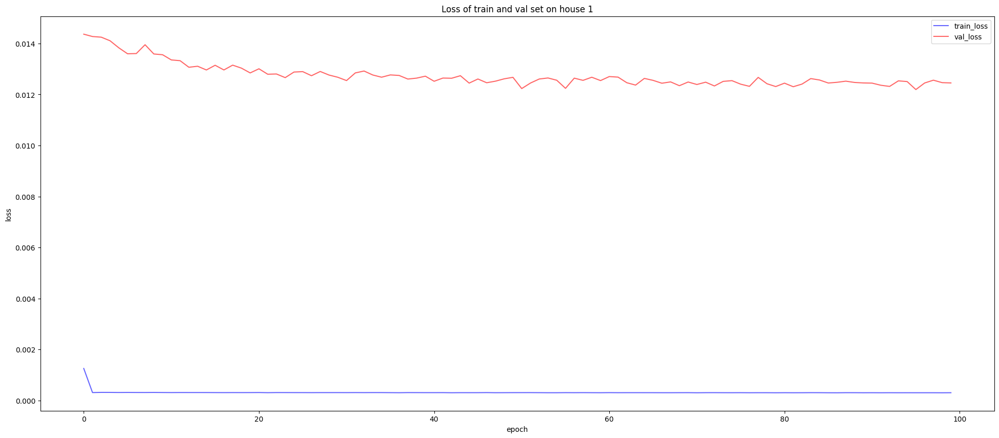

In [56]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Loss of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

In [57]:
# Evaluataccuracye the model on test data
loss, accuracy = model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy: ", accuracy)

1220/1220 [==============================] - 2s 2ms/step - loss: 2.9489e-04 - accuracy: 0.9988
Train Loss: 0.00029489491134881973
Train Accuracy:  0.9987958669662476


In [58]:
# Evaluate the model on test data
loss, accuracy = model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy: ", accuracy)

523/523 [==============================] - 1s 2ms/step - loss: 0.0125 - accuracy: 0.9872
Test Loss: 0.012454066425561905
Test Accuracy:  0.9872070550918579


In [59]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

523/523 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 688.5252126560673
Root Mean Squared Error (RMSE): 26.23976395961037
Mean Absolute Error (MAE): 21.270019157740204


In [60]:
# Fridge


timestamp_index = test_data[1].index[:len(predictions)]

fridge_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           73.0         72.985435
1  2014-03-09 10:13:15           73.0         72.036713
2  2014-03-09 10:13:20           73.0         72.036713
3  2014-03-09 10:13:27           73.0         72.036713
4  2014-03-09 10:13:29           74.0         72.036713
5  2014-03-09 10:13:34           73.0         72.985435
6  2014-03-09 10:13:43           74.0         72.036713
7  2014-03-09 10:13:48           72.0         72.985435
8  2014-03-09 10:13:57           72.0         71.087067
9  2014-03-09 10:14:02           74.0         71.087067
10 2014-03-09 10:14:12           73.0         72.985435
11 2014-03-09 10:14:16           73.0         72.036713
12 2014-03-09 10:14:19           73.0         72.036713
13 2014-03-09 10:14:26           74.0         72.036713
14 2014-03-09 10:14:31           74.0         72.985435
15 2014-03-09 10:14:33           74.0         72.985435
16 2014-03-09 10:14:45           73.0   

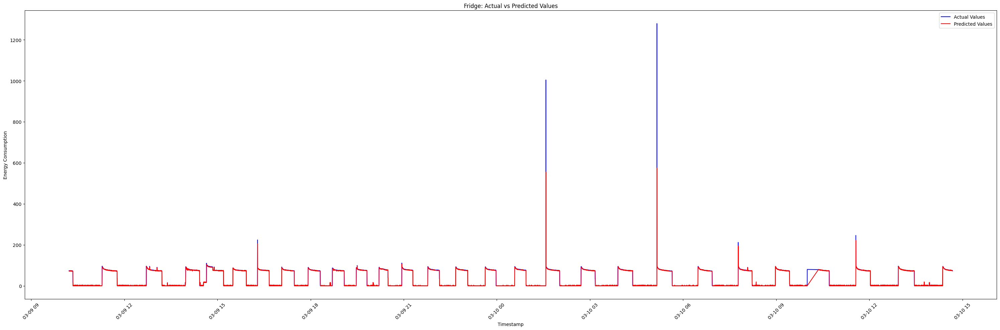

In [61]:
# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(fridge_output['Timestamp'], fridge_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(fridge_output['Timestamp'], fridge_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Fridge: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [62]:
# Television

timestamp_index = test_data[1].index[:len(predictions)]


tv_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))
#print(fridge_output.head)

Television:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13           21.0         21.008886
1  2014-03-09 10:13:15           21.0         21.008888
2  2014-03-09 10:13:20           21.0         21.008888
3  2014-03-09 10:13:27           21.0         21.008888
4  2014-03-09 10:13:29           21.0         21.008888
5  2014-03-09 10:13:34           21.0         21.008886
6  2014-03-09 10:13:43           21.0         21.008888
7  2014-03-09 10:13:48           21.0         21.008886
8  2014-03-09 10:13:57           21.0         21.008890
9  2014-03-09 10:14:02           21.0         21.008890
10 2014-03-09 10:14:12           21.0         21.008886
11 2014-03-09 10:14:16           21.0         21.008888
12 2014-03-09 10:14:19           21.0         21.008888
13 2014-03-09 10:14:26           21.0         21.008888
14 2014-03-09 10:14:31           21.0         21.008886
15 2014-03-09 10:14:33           21.0         21.008886
16 2014-03-09 10:14:45           21.

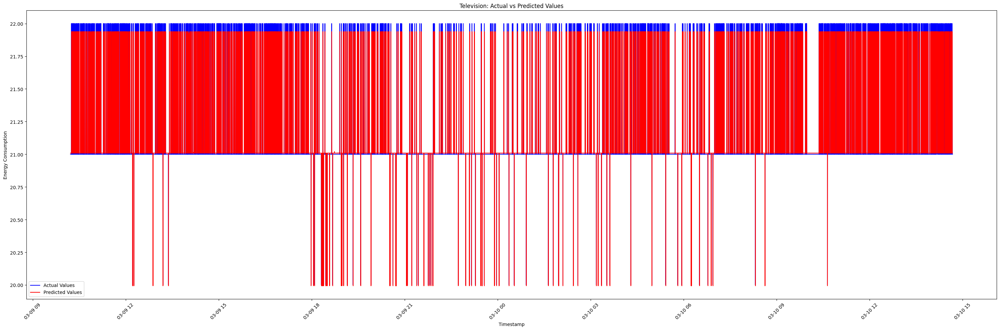

In [63]:
# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(tv_output['Timestamp'], tv_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(tv_output['Timestamp'], tv_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Television: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [67]:
# Microwave

# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


Microwave:
             Timestamp  Actual Values  Predicted Values
0  2014-03-09 10:13:13            2.0          5.880037
1  2014-03-09 10:13:15            2.0          5.888551
2  2014-03-09 10:13:20            2.0          5.888551
3  2014-03-09 10:13:27            2.0          5.888551
4  2014-03-09 10:13:29            2.0          5.888551
5  2014-03-09 10:13:34            2.0          5.880037
6  2014-03-09 10:13:43            2.0          5.888551
7  2014-03-09 10:13:48            2.0          5.880037
8  2014-03-09 10:13:57            2.0          5.897075
9  2014-03-09 10:14:02            2.0          5.897075
10 2014-03-09 10:14:12            2.0          5.880037
11 2014-03-09 10:14:16            2.0          5.888551
12 2014-03-09 10:14:19            2.0          5.888551
13 2014-03-09 10:14:26            2.0          5.888551
14 2014-03-09 10:14:31            2.0          5.880037
15 2014-03-09 10:14:33            2.0          5.880037
16 2014-03-09 10:14:45            2.0

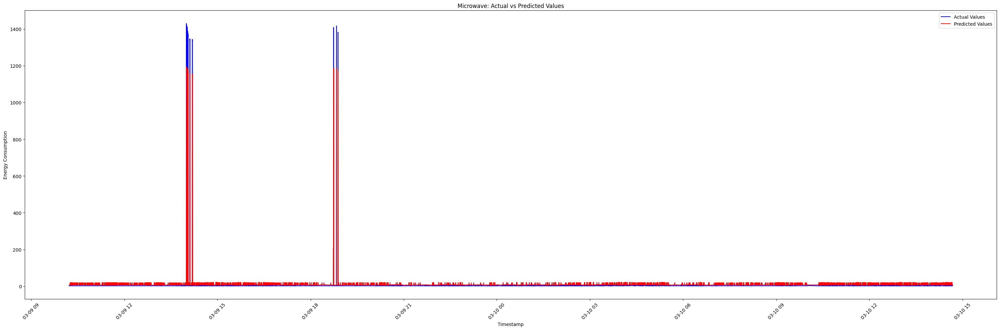

In [66]:
# Plot actual and predicted values
plt.figure(figsize=(30, 10))
plt.plot(microwave_output['Timestamp'], microwave_output['Actual Values'], label='Actual Values', color='blue')
plt.plot(microwave_output['Timestamp'], microwave_output['Predicted Values'], label='Predicted Values', color='red')
plt.title('Microwave: Actual vs Predicted Values')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Model Deployment

In [54]:
from keras.models import load_model

def load_and_predict(input_data):
    # Load the saved model
    model = load_model('lstm_model.h5')
    
    # Preprocess input data
    scaled_input_data = train_scalers[1].transform(input_data)
    input_data_reshaped = scaled_input_data.reshape(1, scaled_input_data.shape[0], scaled_input_data.shape[1])
    
    # Make predictions
    predictions = model.predict(input_data_reshaped)
    
    # Inverse transform predictions
    predictions = train_scalers[1].inverse_transform(predictions)
    
    return predictions


In [57]:
from flask import Flask, request, jsonify

app = Flask(__name__)

@app.route('/predict', methods=['POST'])
def predict():
    # Get data from request
    data = request.get_json()
    
    # Make predictions
    predictions = load_and_predict(data)
    
    # Return predictions
    return jsonify(predictions.tolist())

if __name__ == '__main__':
    app.run(debug=True, host='0.0.0.0', port=5002)  # Change port to 5001


 * Serving Flask app '__main__'
 * Debug mode: on


 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:5002
 * Running on http://192.168.0.14:5002
Press CTRL+C to quit
 * Restarting with stat
0.00s - Debugger warning: It seems that frozen modules are being used, which may
0.00s - make the debugger miss breakpoints. Please pass -Xfrozen_modules=off
0.00s - to python to disable frozen modules.
0.00s - Note: Debugging will proceed. Set PYDEVD_DISABLE_FILE_VALIDATION=1 to disable this validation.
Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/Users/eujean/Library/Python/3.11/lib/python/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/Users/eujean/Library/Python/3.11/lib/python/site-packages/traitlets/config/application.py", line 1074, in launch_instance
    app.initialize(argv)
  File "/Users/eujean/Library/Python/3.11/lib/python/site-packages/traitlets/config/application.py

SystemExit: 1

In [58]:
pip install streamlit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 16.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 857.8/857.8 kB 12.6 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.2/29.2 MB 1.5 MB/s eta 0:00:0000:0100:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 16.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 335.8/335.8 kB 7.8 MB/s eta 0:00:00:00:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Function to scale data
def scale_data(data, scaler):
    scaled_data = scaler.transform(data)
    return scaled_data

# Example data
data = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

# Define scaler
scaler = MinMaxScaler()

# Fit scaler to data
scaler.fit(data)

# Define num_features based on the shape of the data
num_features = data.shape[1]

# Scale data using the scale_data function
scaled_data = scale_data(data, scaler)

print("Original data:")
print(data)
print("\nScaled data:")
print(scaled_data)


Original data:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

Scaled data:
[[0.  0.  0. ]
 [0.5 0.5 0.5]
 [1.  1.  1. ]]


In [61]:
import streamlit as st
import numpy as np
from keras.models import load_model
from sklearn.preprocessing import MinMaxScaler

# Load the LSTM model
model = load_model('lstm_model.h5')

# Define function to make predictions
def predict(input_data):
    # Preprocess input data
    scaled_input_data = train_scalers[1].transform(input_data)
    input_data_reshaped = scaled_input_data.reshape(1, scaled_input_data.shape[0], scaled_input_data.shape[1])
    
    # Make predictions
    predictions = model.predict(input_data_reshaped)
    
    # Inverse transform predictions
    predictions = train_scalers[1].inverse_transform(predictions)
    
    return predictions

# Streamlit app
def main():
    st.title('House Energy Consumption Prediction')
    st.write('Enter your input data:')
    
    # Input fields for features
    feature1 = st.number_input('Fridge')
    feature2 = st.number_input('Television')
    feature3 = st.number_input('Microwave')
    
    # Make prediction button
    if st.button('Predict'):
        input_data = np.array([[feature1, feature2, feature3]])
        predictions = predict(input_data)
        st.write('Predictions:', predictions)

if __name__ == '__main__':
    main()



In [64]:
import streamlit as st

# Load the LSTM model
model = load_model('lstm_model.h5')

# Function to calculate total energy consumption and cost
def calculate_total(appliances):
    total_energy = sum(appliance['kwh'] for appliance in appliances)
    total_cost = sum(appliance['kwh'] * appliance['cost_per_kwh'] for appliance in appliances)
    return total_energy, total_cost

# Streamlit app
def main():
    st.title('Appliance Energy Consumption Predictor')
    
    st.write('Enter the details for each appliance:')
    
    # Initialize list to store appliance details
    appliances = []
    
    # Input fields for each appliance
    num_appliances = st.slider('Number of Appliances', min_value=1, max_value=10, value=2)
    
    for i in range(num_appliances):
        st.write(f'Appliance {i+1}:')
        kwh = st.number_input(f'Energy Consumption (kWh) for Appliance {i+1}', min_value=0.0, step=0.01)
        cost_per_kwh = st.number_input(f'Cost per kWh (pesos) for Appliance {i+1}', min_value=0.0, step=0.01)
        appliances.append({'kwh': kwh, 'cost_per_kwh': cost_per_kwh})
    
    # Button to calculate total
    if st.button('Calculate Total'):
        total_energy, total_cost = calculate_total(appliances)
        st.write(f'Total Energy Consumption: {total_energy:.2f} kWh')
        st.write(f'Total Cost: {total_cost:.2f} pesos')
    
if __name__ == '__main__':
    main()


In [44]:
import numpy as np

# Assuming you have the model trained and loaded as 'model'

# Define the number of future time steps to predict (e.g., one month)
num_future_steps = 30 * 24  # Assuming hourly data and 30 days

# Prepare the data for prediction

# Use the last available data point as the starting point
last_data_point = test_X[1][-1]

# Create an empty array to store the predicted values
predicted_values = []

# Iterate to predict each future time step
for _ in range(num_future_steps):
    # Reshape the data for prediction (assuming univariate time series)
    X_pred = np.array([last_data_point])
    X_pred = np.reshape(X_pred, (X_pred.shape[0], 1, X_pred.shape[1]))
    
    # Predict the next time step
    next_pred = model.predict(X_pred)
    
    # Append the predicted value to the list
    predicted_values.append(next_pred[0])
    
    # Update the last data point for the next iteration
    last_data_point = np.append(last_data_point[1:], next_pred[0])

# Inverse transform the predicted values to obtain the original scale
predicted_values = test_scalers[1].inverse_transform(predicted_values)

# Generate timestamps for the predicted values (assuming hourly data)
start_timestamp = test_data[1].index[-1] + pd.Timedelta(hours=1)
end_timestamp = start_timestamp + pd.Timedelta(hours=num_future_steps - 1)
predicted_timestamps = pd.date_range(start=start_timestamp, end=end_timestamp, freq='H')

# Create a DataFrame to store the predicted values with timestamps
predicted_df = pd.DataFrame({
    'Timestamp': predicted_timestamps,
    'Predicted Values': predicted_values.flatten()
})

# Plot the predicted energy consumption for the next month
plt.figure(figsize=(10, 6))
plt.plot(predicted_df['Timestamp'], predicted_df['Predicted Values'], label='Predicted Energy Consumption', color='red')
plt.title('Predicted Energy Consumption for the Next Month')
plt.xlabel('Timestamp')
plt.ylabel('Energy Consumption')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


ValueError: cannot reshape array of size 3 into shape (1,1,1)

23/23 [==============================] - 0s 2ms/step


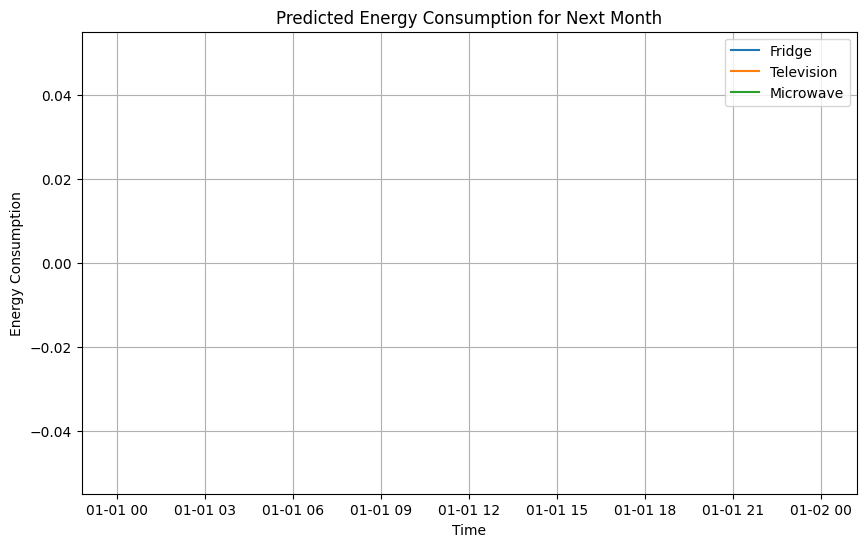

In [43]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
from sklearn.preprocessing import MinMaxScaler

# Generate timestamps for the next month
current_date = datetime.now()
end_date_next_month = current_date + timedelta(days=30)
date_range_next_month = pd.date_range(current_date, end_date_next_month, freq='H')

# Create a DataFrame with these timestamps and NaN values for features
next_month_data = pd.DataFrame(index=date_range_next_month, columns=['Fridge', 'Television', 'Microwave'])
next_month_data.index.name = 'timestamp'

# Forward fill any missing values in the dataset
next_month_data.ffill(inplace=True)

# Normalize features using MinMaxScaler (using the same scaler used during training)
scaler = MinMaxScaler()  # Define MinMaxScaler object
X_next_month_scaled = scaler.fit_transform(next_month_data)

# Reshape input data to be 3D for LSTM (samples, timesteps, features)
X_next_month = X_next_month_scaled.reshape(X_next_month_scaled.shape[0], 1, X_next_month_scaled.shape[1])



# Use the LSTM model to predict energy consumption for the next month
predicted_consumption = model.predict(X_next_month)

# Inverse transform the predicted values to get the actual energy consumption values

# Inverse transform the predicted values to get the actual energy consumption values
predicted_consumption_actual = scaler.inverse_transform(predicted_consumption)

# Create a DataFrame for the predicted energy consumption
predicted_consumption_df = pd.DataFrame(predicted_consumption_actual, index=date_range_next_month, columns=['Fridge', 'Television', 'Microwave'])


# Plot the predicted energy consumption for the next month
plt.figure(figsize=(10, 6))
for column in predicted_consumption_df.columns:
    plt.plot(predicted_consumption_df.index, predicted_consumption_df[column], label=column)
plt.title('Predicted Energy Consumption for Next Month')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.legend()
plt.grid(True)
plt.show()


In [112]:
appliance_names = ['Fridge', 'Television', 'Microwave']

for i, appliance_name in enumerate(appliance_names):
    try:
        # Extract the timestamp index from the test data
        timestamp_index = test_data[2].index[:len(predictions)]

        # Create DataFrame for current appliance predictions
        appliance_output = pd.DataFrame({
            'Timestamp': timestamp_index,
            'Actual Values': house_2_y[:, i],  # Use index i to select actual values
            'Predicted Values': house_2_predictions[:, i]  # Use index i to select predicted values
        })

        # Print the DataFrame for the current appliance
        print(f"{appliance_name}:")
        print(appliance_output.head(20))
        print()
        
    except ValueError:
        print(f"Error: Lengths of arrays do not match for {appliance_name}. Skipping...")


Error: Lengths of arrays do not match for Fridge. Skipping...
Error: Lengths of arrays do not match for Television. Skipping...
Error: Lengths of arrays do not match for Microwave. Skipping...


In [102]:
appliances_output = {}

# Iterate over each appliance and store actual and predicted values
for i, appliance in enumerate(house_2_data.columns):
    actual_values = house_2_y[:, i]
    predicted_values = house_2_predictions[:, i]
    appliances_output[appliance] = pd.DataFrame({
        'Actual Values': actual_values,
        'Predicted Values': predicted_values
    })

# Print actual and predicted values for each appliance
for appliance, output_df in appliances_output.items():
    print(f"{appliance}:")
    print(output_df.head(20))  # Print the first 10 rows
    print()

Fridge:
    Actual Values  Predicted Values
0           117.0        112.972473
1           116.0        113.864418
2           115.0        112.972473
3           115.0        112.079453
4           115.0        112.079453
5           116.0        112.079453
6           116.0        112.972473
7           116.0        112.972473
8           116.0        112.972473
9           116.0        112.972473
10          115.0        112.972473
11          115.0        112.079453
12          115.0        112.079453
13          115.0        112.079453
14          115.0        112.079453
15          115.0        112.079453
16          115.0        112.079453
17            9.0        112.079453
18            9.0         11.344929
19            9.0         11.344929

Television:
    Actual Values  Predicted Values
0            20.0         20.592707
1            20.0         20.592434
2            20.0         20.592707
3            20.0         20.592979
4            20.0         20.592979
5      

In [111]:
print("Length of timestamp_index:", len(timestamp_index))
print("Length of actual values:", len(house_2_y[:, i]))
print("Length of predicted values:", len(house_2_predictions[:, i]))


Length of timestamp_index: 16728
Length of actual values: 53837
Length of predicted values: 53837


In [97]:
# Extract the timestamp index from the test data
timestamp_index = test_data[1].index[:len(predictions)]

# Create DataFrame for Microwave predictions
microwave_output = pd.DataFrame({
    'Timestamp': timestamp_index,
    'Actual Values': actual_values[:, 2],
    'Predicted Values': house_2_predictions[:, 2]
})

# Print the DataFrame for the Microwave appliance
print("Microwave:")
print(microwave_output.head(20))


ValueError: All arrays must be of the same length

### Train and test on house 1 - Vanilla LSTM

In [25]:
# Define the proportions for train, validation, and test sets
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Initialize dictionaries to store train, validation, and test DataFrames for each house
train_data = {}
val_data = {}
test_data = {}

# Split the data for each house
for house, df in dfs.items():
    total_samples = len(df)
    train_size = int(total_samples * train_ratio)
    val_size = int(total_samples * val_ratio)
    test_size = total_samples - train_size - val_size
    
    # Split the data
    train_data[house] = df.iloc[:train_size]
    val_data[house] = df.iloc[train_size:train_size+val_size]
    test_data[house] = df.iloc[train_size+val_size:]

# Example usage: Printing lengths of train, validation, and test sets for each house
for house in range(1, 4):
    print(f"House {house}:")
    print(f"Train set length: {len(train_data[house])}")
    print(f"Validation set length: {len(val_data[house])}")
    print(f"Test set length: {len(test_data[house])}")
    print()


House 1:
Train set length: 39034
Validation set length: 8364
Test set length: 8365

House 2:
Train set length: 37686
Validation set length: 8075
Test set length: 8077

House 3:
Train set length: 39471
Validation set length: 8458
Test set length: 8459



In [26]:
from sklearn.preprocessing import MinMaxScaler

def prepare_lstm_data(df):
    # Exclude the first column (assuming it contains datetime values)
    df_numeric = df.iloc[:, 1:]
    
    # Scale the numeric data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(df_numeric.values)
    
    # Prepare the data in sequences for LSTM
    X = []
    y = []
    for i in range(len(scaled_data)):
        end_ix = i + 1
        if end_ix > len(scaled_data)-1:
            break
        seq_x, seq_y = scaled_data[i:end_ix], scaled_data[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y), scaler


In [27]:
# Initialize dictionaries to store prepared data and scalers for each house
train_X, train_y, train_scalers = {}, {}, {}
val_X, val_y, val_scalers = {}, {}, {}
test_X, test_y, test_scalers = {}, {}, {}

# Prepare the data for each house
for house in range(1, 4):
    # Prepare training data
    train_X[house], train_y[house], train_scalers[house] = prepare_lstm_data(train_data[house])
    
    # Prepare validation data
    val_X[house], val_y[house], val_scalers[house] = prepare_lstm_data(val_data[house])
    
    # Prepare testing data
    test_X[house], test_y[house], test_scalers[house] = prepare_lstm_data(test_data[house])


In [39]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting a single feature
    ])
    return model

# Compile the model
model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

model.summary()


Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 64)                17152     
                                                                 
 dense_7 (Dense)             (None, 3)                 195       
                                                                 
Total params: 17347 (67.76 KB)
Trainable params: 17347 (67.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [40]:

# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the vanilla LSTM model 
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])



In [41]:
# Train the model
history = model.fit(train_X[1], train_y[1], epochs=10, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/10


ValueError: in user code:

    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 3 and 2 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_7/dense_7/BiasAdd, IteratorGetNext:1)' with input shapes: [?,3], [?,2].


In [34]:
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.optimizers import Adam

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  # Adjusted to output 3 features
    ])
    return model

# Compile the model
model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

# Define the learning rate
learning_rate = 0.001  
optimizer = Adam(learning_rate=learning_rate)

# Compile the LSTM model 
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=10, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/10


ValueError: in user code:

    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 3 and 2 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_5/dense_5/BiasAdd, IteratorGetNext:1)' with input shapes: [?,3], [?,2].


In [35]:
# Check the shapes of train_y[1] and val_y[1]
print("Shape of train_y[1]:", train_y[1].shape)
print("Shape of val_y[1]:", val_y[1].shape)

# Check the output shape of the model
print("Output shape of the model:", model.output_shape)


Shape of train_y[1]: (39033, 2)
Shape of val_y[1]: (8363, 2)
Output shape of the model: (None, 3)


In [32]:
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(64, input_shape=input_shape),
        Dropout(0.3),
        Dense(3)
    ])
    model.compile(optimizer='adam', loss='mse')  # Compile the model with mean squared error loss
    model.summary()
    return model

# Define the input shape for the LSTM model
input_shape = (train_X[1].shape[1], train_X[1].shape[2])  # Use the shape of train_X for one of the houses

# Initialize dictionaries to store trained models for each house
lstm_models = {}

# Train the LSTM model for each house
for house in range(1, 4):
    print(f"Training LSTM model for House {house}")
    # Build the LSTM model
    model = build_lstm_model(input_shape)
    
    # Train the model using the prepared data
    history = model.fit(train_X[house], train_y[house], epochs=10, batch_size=32, validation_data=(val_X[house], val_y[house]))
    
    # Store the trained model
    lstm_models[house] = model


Training LSTM model for House 1
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 64)                17152     
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 3)                 195       
                                                                 
Total params: 17347 (67.76 KB)
Trainable params: 17347 (67.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/10


ValueError: in user code:

    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 3 and 2 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_3/dense_3/BiasAdd, IteratorGetNext:1)' with input shapes: [?,3], [?,2].


In [33]:

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting a single feature
    ])
    return model

# Compile the model
model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=10, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/10


ValueError: in user code:

    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 3 and 2 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_4/dense_4/BiasAdd, IteratorGetNext:1)' with input shapes: [?,3], [?,2].


In [79]:

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting a single feature
    ])
    return model

# Compile the model
model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=10, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/10
1220/1220 [==============================] - 7s 3ms/step - loss: 0.0013 - accuracy: 0.9976 - val_loss: 0.0141 - val_accuracy: 0.9862
Epoch 2/10
1220/1220 [==============================] - 4s 3ms/step - loss: 3.0935e-04 - accuracy: 0.9988 - val_loss: 0.0139 - val_accuracy: 0.9857
Epoch 3/10
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1717e-04 - accuracy: 0.9988 - val_loss: 0.0140 - val_accuracy: 0.9862
Epoch 4/10
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1045e-04 - accuracy: 0.9988 - val_loss: 0.0137 - val_accuracy: 0.9862
Epoch 5/10
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1817e-04 - accuracy: 0.9988 - val_loss: 0.0138 - val_accuracy: 0.9862
Epoch 6/10
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1457e-04 - accuracy: 0.9988 - val_loss: 0.0136 - val_accuracy: 0.9862
Epoch 7/10
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1276e-04 - accuracy: 0.9988 - val_loss

In [87]:
# Evaluate the model's loss on the training data
loss, accuracy= model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy:", accuracy)


1220/1220 [==============================] - 2s 2ms/step - loss: 3.0153e-04 - accuracy: 0.9988
Train Loss: 0.0003015311376657337
Train Accuracy: 0.998821496963501


In [88]:
# Evaluate the model's loss on the training data
loss, accuracy= model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)


262/262 [==============================] - 1s 3ms/step - loss: 0.0634 - accuracy: 0.8234
Test Loss: 0.06341186165809631
Test Accuracy: 0.8234098553657532


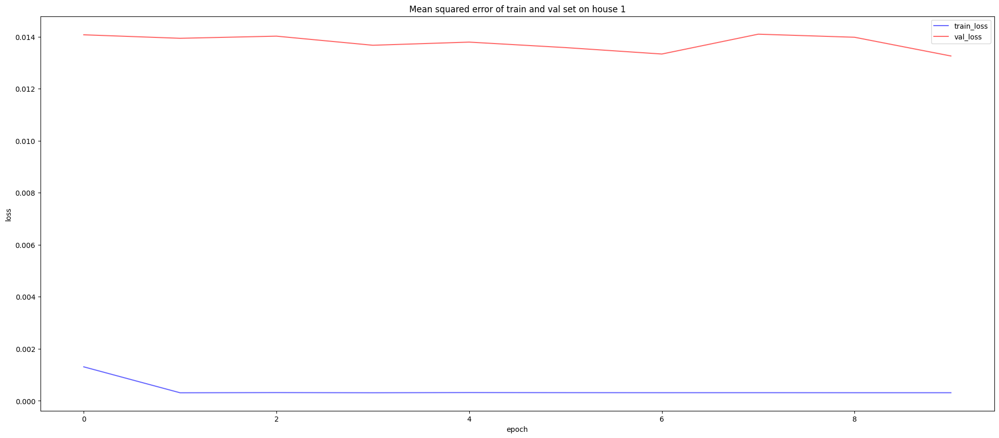

In [82]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Mean squared error of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

In [81]:
# Reshape predictions to match the original shape of the input data
predictions = predictions.reshape(-1, len(test_scalers[1].data_min_))

# Apply inverse transformation to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)


In [90]:
# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])

# Create a DataFrame to compare actual and predicted values for each appliance
comparison_df = pd.DataFrame({
    'Actual Values': actual_values.flatten(),  # Flatten to make it 1-dimensional
    'Predicted Values': predictions.flatten()  # Flatten to make it 1-dimensional
})

# Print the DataFrame
print("Fridge:")
print(comparison_df.head(9))  # Print the first 9 rows for demonstration


262/262 [==============================] - 0s 2ms/step
Fridge:
   Actual Values  Predicted Values
0            0.0         -3.660952
1           21.0         20.991955
2            2.0          2.837762
3            0.0          0.215285
4           21.0         20.998489
5            2.0          1.998258
6            0.0          0.215285
7           21.0         20.998489
8            2.0          1.998258


In [97]:
# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])

# Create a DataFrame to compare actual and predicted values for the Fridge appliance
fridge_output = pd.DataFrame({
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

# Print the DataFrame
print("Fridge:")
print(fridge_output.head)


262/262 [==============================] - 0s 2ms/step
Fridge:
<bound method NDFrame.head of       Actual Values  Predicted Values
0               0.0         -3.660952
1               0.0          0.215285
2               0.0          0.215285
3               0.0          0.215285
4               0.0          0.215285
...             ...               ...
8359           74.0         69.633369
8360           75.0         69.633369
8361           75.0         75.460258
8362           74.0         75.460258
8363           74.0         74.467934

[8364 rows x 2 columns]>


In [113]:
# Determine the length of the shortest array
min_length = min(len(time_index), len(actual_values), len(predictions))

# Trim the arrays to the same length
time_index = time_index[:min_length]
actual_values = actual_values[:min_length]
predictions = predictions[:min_length]

# Print out the lengths of the arrays for debugging
print("Length of time_index:", len(time_index))
print("Length of actual_values:", len(actual_values))
print("Length of predictions:", len(predictions))

# Create a DataFrame with time index for comparison
comparison_df = pd.DataFrame({
    'Time': time_index,
    'Actual Values': actual_values.flatten(),
    'Predicted Values': predictions.flatten()
})

# Plot the actual and predicted values
plt.figure(figsize=(10, 6))
plt.plot(comparison_df['Time'], comparison_df['Actual Values'], label='Actual Values', marker='o')
plt.plot(comparison_df['Time'], comparison_df['Predicted Values'], label='Predicted Values', marker='x')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Actual vs Predicted Energy Consumption for Fridge Appliance')
plt.legend()
plt.grid(True)
plt.show()


Length of time_index: 8364
Length of actual_values: 8364
Length of predictions: 8364


ValueError: All arrays must be of the same length

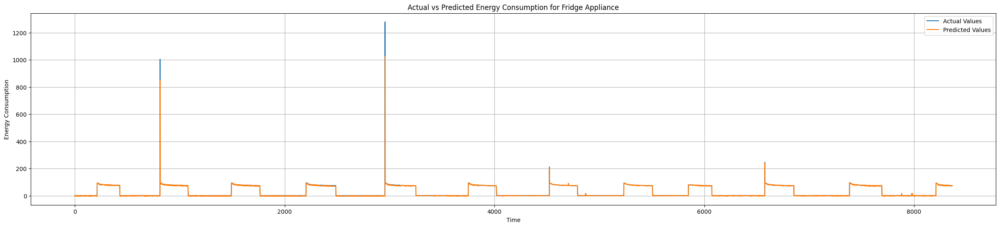

In [120]:
import matplotlib.pyplot as plt

# Extract actual and predicted values for the Fridge appliance
actual_values_fridge = fridge_output['Actual Values']
predicted_values_fridge = fridge_output['Predicted Values']

# Plot the actual and predicted values
plt.figure(figsize=(30, 6))
plt.plot(actual_values_fridge, label='Actual Values')
plt.plot(predicted_values_fridge, label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Actual vs Predicted Energy Consumption for Fridge Appliance')
plt.legend()
plt.grid(True)
plt.show()


In [101]:
#Television


tv_output = pd.DataFrame({
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

# Print the DataFrame
print("Television:")
print(tv_output.head(20))


Television:
    Actual Values  Predicted Values
0            21.0         20.991955
1            21.0         20.998489
2            21.0         20.998489
3            21.0         20.998489
4            21.0         20.998489
5            21.0         20.998489
6            21.0         20.998489
7            21.0         20.998489
8            21.0         20.998489
9            21.0         20.998489
10           21.0         20.998489
11           21.0         20.998489
12           21.0         20.991955
13           21.0         20.991955
14           21.0         20.998489
15           21.0         20.991955
16           21.0         20.998489
17           21.0         20.991955
18           21.0         20.991955
19           21.0         20.991955


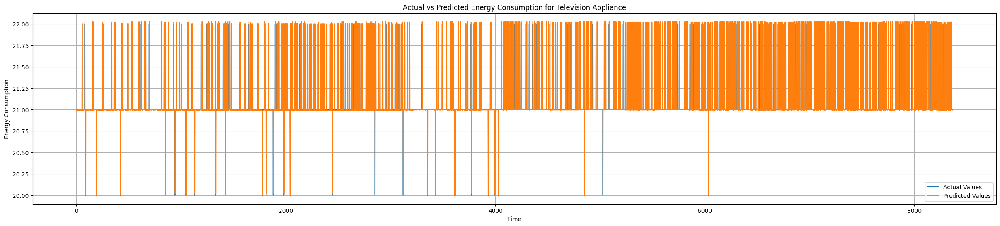

In [119]:
import matplotlib.pyplot as plt

# Extract actual and predicted values for the Fridge appliance
actual_values_tv = tv_output['Actual Values']
predicted_values_tv = tv_output['Predicted Values']

# Plot the actual and predicted values
plt.figure(figsize=(30, 6))
plt.plot(actual_values_tv, label='Actual Values')
plt.plot(predicted_values_tv, label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Actual vs Predicted Energy Consumption for Television Appliance')
plt.legend()
plt.grid(True)
plt.show()


In [102]:
# Microwave


microwave_output = pd.DataFrame({
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame
print("TelevMicrowaveision:")
print(microwave_output.head(20))


TelevMicrowaveision:
    Actual Values  Predicted Values
0             2.0          2.837762
1             2.0          1.998258
2             2.0          1.998258
3             2.0          1.998258
4             2.0          1.998258
5             2.0          1.998258
6             2.0          1.998258
7             2.0          1.998258
8             2.0          1.998258
9             2.0          1.998258
10            2.0          1.998258
11            3.0          1.998258
12            3.0          2.837762
13            2.0          2.837762
14            3.0          1.998258
15            2.0          2.837762
16            3.0          1.998258
17            3.0          2.837762
18            3.0          2.837762
19            2.0          2.837762


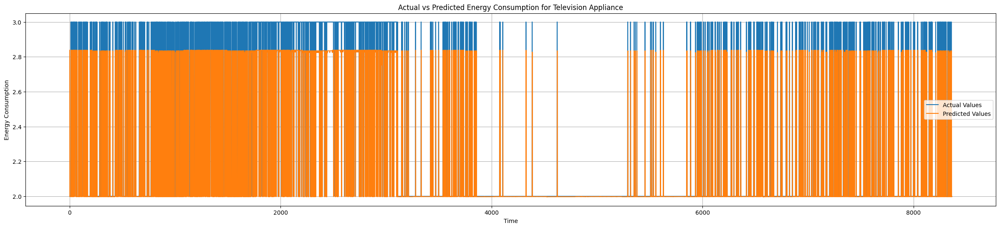

In [122]:
import matplotlib.pyplot as plt

# Extract actual and predicted values for the Fridge appliance
actual_values_microwave = microwave_output['Actual Values']
predicted_values_microwave = microwave_output['Predicted Values']

# Plot the actual and predicted values
plt.figure(figsize=(30, 6))
plt.plot(actual_values_microwave, label='Actual Values')
plt.plot(predicted_values_microwave, label='Predicted Values')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Actual vs Predicted Energy Consumption for Television Appliance')
plt.legend()
plt.grid(True)
plt.show()


In [104]:
import matplotlib.pyplot as plt

# Assuming 'Time' column is present in the dataset and contains datetime values
# If not, you need to have a datetime index associated with your data
# For example, you can set the 'Time' column as the index: refit.set_index('Time', inplace=True)

# Plot actual and predicted values for each appliance separately
plt.figure(figsize=(20, 6))

# Plot Fridge
plt.plot(dfs.index[-len(y_true):], y_true[:, 0], label='Fridge Actual', color='blue')
plt.plot(dfs.index[-len(predictions):], predictions[:, 0], label='Fridge Predicted', color='red')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Fridge: Actual vs. Predicted Energy Consumption')
plt.legend()
plt.show()

# Plot Television
plt.figure(figsize=(20, 6))
plt.plot(dfs.index[-len(y_true):], y_true[:, 1], label='Television Actual', color='green')
plt.plot(dfs.index[-len(predictions):], predictions[:, 1], label='Television Predicted', color='orange')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Television: Actual vs. Predicted Energy Consumption')
plt.legend()
plt.show()

# Plot Microwave
plt.figure(figsize=(20, 6))
plt.plot(dfs.index[-len(y_true):], y_true[:, 2], label='Microwave Actual', color='purple')
plt.plot(dfs.index[-len(predictions):], predictions[:, 2], label='Microwave Predicted', color='orange')
plt.xlabel('Time')
plt.ylabel('Energy Consumption')
plt.title('Microwave: Actual vs. Predicted Energy Consumption')
plt.legend()
plt.show()


AttributeError: 'dict' object has no attribute 'index'

<Figure size 2000x600 with 0 Axes>

In [106]:
# Plot real and predict refrigerator consumption on six days of test data
def plot_each_app(df, dates, predict, y_test, title, look_back = 0):
    num_date = len(dates)
    fig, axes = plt.subplots(num_date,1,figsize=(24, num_date*5) )
    plt.suptitle(title, fontsize = '25')
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    for i in range(num_date):
        if i == 0: l = 0
        ind = df.ix[dates[i]].index[look_back:]
        axes.flat[i].plot(ind, y_test[l:l+len(ind)], color = 'blue', alpha = 0.6, label = 'True value')
        axes.flat[i].plot(ind, predict[l:l+len(ind)], color = 'red', alpha = 0.6, label = 'Predicted value')
        axes.flat[i].legend()
        l = len(ind)


plot_each_app(df1, dates[1][17:], y_test_predict_1, y_test1, 'Real and predict Refrigerator on 6 test day of house 1')

NameError: name 'df1' is not defined

In [84]:
# Print the actual and predicted energy consumption for each house
print("Actual vs. Predicted Energy Consumption:")
for i, appliance in enumerate(['Fridge', 'Television', 'Microwave']):
    print(f"Appliance: {appliance}")
    print("Actual:")
    print(test_scalers[1].inverse_transform(test_y[1])[:, i])  # Actual values
    print("Predicted:")
    print(predictions[:, i])  # Predicted values
    print()


Actual vs. Predicted Energy Consumption:
Appliance: Fridge
Actual:
[ 0.  0.  0. ... 75. 74. 74.]
Predicted:
[810305.2  270991.75 270991.75 ... 574966.6  836552.9  301595.2 ]

Appliance: Television
Actual:
[21. 21. 21. ... 21. 21. 21.]
Predicted:
[60.662636 60.662636 60.662636 ... 61.405922 62.04556  60.73747 ]

Appliance: Microwave
Actual:
[2. 2. 2. ... 2. 2. 2.]
Predicted:
[4.165659  4.165659  4.165659  ... 4.3512487 4.51139   4.18412  ]



In [91]:
# Save the trained LSTM model
model.save("vanilla_lstm.h5")


# Vanilla LSTM 

In [136]:
from keras.layers import Dense, Activation, Dropout
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.optimizers import Adam
from keras.regularizers import l2

In [137]:
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Define LSTM model architecture
def build_lstm_model(input_shape):
    model = Sequential([
        LSTM(units=64, input_shape=input_shape),
        Dense(units=3)  # Assuming we're predicting a single feature
    ])
    return model

# Compile the model
model = build_lstm_model(input_shape=(train_X[1].shape[1], train_X[1].shape[2]))

model.summary()



Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 64)                17152     
                                                                 
 dense_8 (Dense)             (None, 3)                 195       
                                                                 
Total params: 17347 (67.76 KB)
Trainable params: 17347 (67.76 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [138]:

# Define the learning rate
learning_rate = 0.001  

optimizer = Adam(learning_rate=learning_rate)

# Compile the vanilla LSTM model 
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

In [139]:

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=10, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/10


ValueError: in user code:

    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 3 and 2 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_8/dense_8/BiasAdd, IteratorGetNext:1)' with input shapes: [?,3], [?,2].


In [34]:

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=50, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/50
1220/1220 [==============================] - 8s 4ms/step - loss: 0.0013 - accuracy: 0.9978 - val_loss: 0.0141 - val_accuracy: 0.9858
Epoch 2/50
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1682e-04 - accuracy: 0.9988 - val_loss: 0.0140 - val_accuracy: 0.9862
Epoch 3/50
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1587e-04 - accuracy: 0.9988 - val_loss: 0.0138 - val_accuracy: 0.9862
Epoch 4/50
1220/1220 [==============================] - 4s 4ms/step - loss: 3.1541e-04 - accuracy: 0.9988 - val_loss: 0.0137 - val_accuracy: 0.9862
Epoch 5/50
1220/1220 [==============================] - 4s 3ms/step - loss: 3.1444e-04 - accuracy: 0.9988 - val_loss: 0.0137 - val_accuracy: 0.9862
Epoch 6/50
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1386e-04 - accuracy: 0.9988 - val_loss: 0.0133 - val_accuracy: 0.9862
Epoch 7/50
1220/1220 [==============================] - 3s 3ms/step - loss: 3.1364e-04 - accuracy: 0.9988 - val_loss

In [35]:
# Evaluate the model's loss on the training data
loss, accuracy= model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy:", accuracy)


1220/1220 [==============================] - 2s 2ms/step - loss: 2.9754e-04 - accuracy: 0.9988
Train Loss: 0.0002975389070343226
Train Accuracy: 0.9987958669662476


In [36]:
# Evaluate the model's loss on the training data
loss, accuracy= model.evaluate(test_X[1], test_y[1])
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)


262/262 [==============================] - 0s 2ms/step - loss: 0.0623 - accuracy: 0.8222
Test Loss: 0.06231388822197914
Test Accuracy: 0.8222142457962036


In [37]:
# Print the metrics obtained during training
print("Training Metrics:")
print("Train Loss:", history.history['loss'])
print("Train Accuracy:", history.history['accuracy'])
print("Validation Loss:", history.history['val_loss'])
print("Validation Accuracy:", history.history['val_accuracy'])


Training Metrics:
Train Loss: [0.0012534619309008121, 0.0003168174880556762, 0.00031586986733600497, 0.00031540862983092666, 0.000314443779643625, 0.00031385754118673503, 0.0003136421728413552, 0.0003140897024422884, 0.0003112332778982818, 0.0003084462368860841, 0.0003126684168819338, 0.00031250345637090504, 0.00031359490822069347, 0.0003109681128989905, 0.000308837101329118, 0.00031025506905280054, 0.0003107283264398575, 0.0003096268337685615, 0.0003103006165474653, 0.0003074302803725004, 0.00030912779038771987, 0.0003091451071668416, 0.00030916513060219586, 0.0003032052773050964, 0.0003078276931773871, 0.00030792024335823953, 0.0003099604800809175, 0.0003082085750065744, 0.00030803130357526243, 0.00030730845173820853, 0.00030786660499870777, 0.0003099773311987519, 0.00030584208434447646, 0.0003023738390766084, 0.00030654482543468475, 0.0003054905100725591, 0.00030555776902474463, 0.0003073597908951342, 0.00030680419877171516, 0.00030701066134497523, 0.0003049342194572091, 0.000307570

In [49]:
from sklearn.metrics import mean_squared_error

# Make predictions on the training data
predictions = model.predict(test_X[1])

# Calculate Mean Squared Error
mse = mean_squared_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)


262/262 [==============================] - 1s 2ms/step
Mean Squared Error (MSE): 0.062313876352600724


In [51]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions = test_scalers[1].inverse_transform(predictions)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values = test_scalers[1].inverse_transform(test_y[1])




# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(actual_values, predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)

262/262 [==============================] - 0s 1ms/step
Mean Squared Error (MSE): 164.59905651546825
Root Mean Squared Error (RMSE): 12.829616382241063
Mean Absolute Error (MAE): 17.325085479789333


In [52]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Predict energy consumption using the trained LSTM model
predictions = model.predict(test_X[1])

# Step 8: Calculate Evaluation Metrics (if needed)
mse = mean_squared_error(test_y[1], predictions)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test_y[1], predictions)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)


262/262 [==============================] - 1s 3ms/step
Mean Squared Error (MSE): 0.062313876352600724
Root Mean Squared Error (RMSE): 0.24962747515568218
Mean Absolute Error (MAE): 0.09134694381591274


In [54]:
# Save model architecture and weights for later use
model.save('Vanilla_LSTM.h5')

In [58]:
# Predict energy consumption using the trained LSTM model for house 1
predictions_house_1 = model.predict(test_X[1])

# Inverse transform the predictions to get the original scale of energy consumption
predictions_house_1 = test_scalers[1].inverse_transform(predictions_house_1)

# Inverse transform the actual values to get the original scale of energy consumption
actual_values_house_1 = test_scalers[1].inverse_transform(test_y[1])

# Print actual values and predictions for house 1
print("Actual Values:")
print(actual_values_house_1)
print("\nPredictions:")
print(predictions_house_1)


262/262 [==============================] - 1s 3ms/step
Actual Values:
[[ 0. 21.  2.]
 [ 0. 21.  2.]
 [ 0. 21.  2.]
 ...
 [75. 21.  2.]
 [74. 21.  2.]
 [74. 21.  2.]]

Predictions:
[[ 4.898072  20.983728   2.8409355]
 [-1.6449387 21.011133   1.9987986]
 [-1.6449387 21.011133   1.9987986]
 ...
 [71.2332    21.010067   1.9988658]
 [71.2332    21.010067   1.9988658]
 [70.292816  21.010084   1.9988637]]


In [150]:
import pandas as pd

# Convert timestamp index to DataFrame
timestamp_index = test_data[1].index[:len(actual_values_house_1)]
timestamp_df = pd.DataFrame(timestamp_index, columns=['timestamp'])

# Create DataFrame with actual and predicted values
comparison_df = pd.DataFrame({
    'Actual Values': actual_values_house_1.flatten(),
    'Predicted Values': predictions_house_1.flatten()
})

# Concatenate timestamp DataFrame with comparison DataFrame
comparison_df = pd.concat([timestamp_df, comparison_df], axis=1)

# Print the DataFrame
print(comparison_df)


                timestamp  Actual Values  Predicted Values
0     2014-03-10 00:13:19            0.0          4.898072
1     2014-03-10 00:13:27           21.0         20.983728
2     2014-03-10 00:13:30            2.0          2.840935
3     2014-03-10 00:13:33            0.0         -1.644939
4     2014-03-10 00:13:44           21.0         21.011133
...                   ...            ...               ...
25087                 NaT           21.0         21.010067
25088                 NaT            2.0          1.998866
25089                 NaT           74.0         70.292816
25090                 NaT           21.0         21.010084
25091                 NaT            2.0          1.998864

[25092 rows x 3 columns]


In [156]:
# Fridge

#timestamp_index = test_data[1].index[:len(actual_values_house_1)]
#timestamp_df = pd.DataFrame(columns=['timestamp'])

fridge_output = pd.DataFrame({
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

#fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output)
#print(fridge_output.head)

Fridge:
      Actual Values  Predicted Values
0               0.0          4.898072
1               0.0         -1.644939
2               0.0         -1.644939
3               0.0         -1.644939
4               0.0         -1.644939
...             ...               ...
8359           74.0         67.426613
8360           75.0         67.426613
8361           75.0         71.233200
8362           74.0         71.233200
8363           74.0         70.292816

[8364 rows x 2 columns]


In [149]:
# Fridge

#timestamp_index = test_data[1].index[:len(actual_values_house_1)]
timestamp_df = pd.DataFrame(columns=['timestamp'])

fridge_output = pd.DataFrame({
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
})

fridge_output = pd.concat([comparison_df], axis=1)
# Print the DataFrame
print("Fridge:")
print(fridge_output.head(20))
#print(fridge_output.head)

Fridge:
             timestamp  Actual Values  Predicted Values
0  2014-03-10 00:13:19            0.0          4.898072
1  2014-03-10 00:13:27           21.0         20.983728
2  2014-03-10 00:13:30            2.0          2.840935
3  2014-03-10 00:13:33            0.0         -1.644939
4  2014-03-10 00:13:44           21.0         21.011133
5  2014-03-10 00:13:47            2.0          1.998799
6  2014-03-10 00:13:59            0.0         -1.644939
7  2014-03-10 00:14:02           21.0         21.011133
8  2014-03-10 00:14:13            2.0          1.998799
9  2014-03-10 00:14:16            0.0         -1.644939
10 2014-03-10 00:14:19           21.0         21.011133
11 2014-03-10 00:14:27            2.0          1.998799
12 2014-03-10 00:14:30            0.0         -1.644939
13 2014-03-10 00:14:33           21.0         21.011133
14 2014-03-10 00:14:44            2.0          1.998799
15 2014-03-10 00:14:47            0.0         -1.644939
16 2014-03-10 00:14:58           21.0   

In [151]:
# Filter out rows with NaT values for the Fridge appliance
fridge_df = dfs[1]
fridge_df = fridge_df.dropna(subset=['timestamp'])

# Print the cleaned DataFrame for the Fridge appliance
print("Fridge:")
print(fridge_df)


KeyError: ['timestamp']

In [145]:
#Television

timestamp_index = test_data[1].index[:len(actual_values_house_1)]
timestamp_df = pd.DataFrame(timestamp_index, columns=['timestamp'])
tv_output = pd.DataFrame({
    'Actual Values': actual_values[:, 1],
    'Predicted Values': predictions[:, 1]
})

tv_output = pd.concat([timestamp_df, comparison_df], axis=1)
# Print the DataFrame
print("Television:")
print(tv_output.head(20))


Television:
             timestamp           timestamp  Actual Values  Predicted Values
0  2014-03-10 00:13:19 2014-03-10 00:13:19            0.0          4.898072
1  2014-03-10 00:13:27 2014-03-10 00:13:27           21.0         20.983728
2  2014-03-10 00:13:30 2014-03-10 00:13:30            2.0          2.840935
3  2014-03-10 00:13:33 2014-03-10 00:13:33            0.0         -1.644939
4  2014-03-10 00:13:44 2014-03-10 00:13:44           21.0         21.011133
5  2014-03-10 00:13:47 2014-03-10 00:13:47            2.0          1.998799
6  2014-03-10 00:13:59 2014-03-10 00:13:59            0.0         -1.644939
7  2014-03-10 00:14:02 2014-03-10 00:14:02           21.0         21.011133
8  2014-03-10 00:14:13 2014-03-10 00:14:13            2.0          1.998799
9  2014-03-10 00:14:16 2014-03-10 00:14:16            0.0         -1.644939
10 2014-03-10 00:14:19 2014-03-10 00:14:19           21.0         21.011133
11 2014-03-10 00:14:27 2014-03-10 00:14:27            2.0          1.998799


In [141]:
# Microwave


microwave_output = pd.DataFrame({
    'Actual Values': actual_values[:, 2],
    'Predicted Values': predictions[:, 2]
})

# Print the DataFrame
print("Microwave:")
print(microwave_output.head(20))


Microwave:
    Actual Values  Predicted Values
0             2.0          2.840935
1             2.0          1.998799
2             2.0          1.998799
3             2.0          1.998799
4             2.0          1.998799
5             2.0          1.998799
6             2.0          1.998799
7             2.0          1.998799
8             2.0          1.998799
9             2.0          1.998799
10            2.0          1.998799
11            3.0          1.998799
12            3.0          2.840935
13            2.0          2.840935
14            3.0          1.998799
15            2.0          2.840935
16            3.0          1.998799
17            3.0          2.840935
18            3.0          2.840935
19            2.0          2.840935


In [144]:
# Filter out rows with NaT values for the Fridge appliance
microwave_df = dfs[3]
microwave_df = microwave_df.dropna(subset=['timestamp'])

# Print the cleaned DataFrame for the Fridge appliance
print("Microwave:")
print(microwave_df)


KeyError: ['timestamp']

In [65]:
import pandas as pd

# Convert timestamp index to DataFrame
timestamp_index = test_data[1].index[:len(actual_values_house_1)]
timestamp_df = pd.DataFrame(timestamp_index, columns=['timestamp'])

# Initialize a dictionary to store DataFrames for each appliance
appliance_dfs = {}

# Iterate over the columns of actual and predicted values
for col_idx, col_name in enumerate(test_data[1].columns):
    # Create DataFrame for each appliance
    appliance_df = pd.DataFrame({
        'Actual Values': actual_values_house_1[:, col_idx],
        'Predicted Values': predictions_house_1[:, col_idx]
    })
    
    # Concatenate timestamp DataFrame with appliance DataFrame
    appliance_df = pd.concat([timestamp_df, appliance_df], axis=1)
    
    # Store the DataFrame for the current appliance
    appliance_dfs[col_name] = appliance_df

# Print the DataFrames for each appliance
for appliance, df in appliance_dfs.items():
    print(f"Appliance: {appliance}")
    print(df)
    print("\n")


IndexError: index 3 is out of bounds for axis 1 with size 3

In [152]:
# Filter out rows with NaT values for the Fridge appliance
fridge_df = dfs[1]['Fridge'].dropna()

# Take only the same number of rows as the number of predictions
fridge_df = fridge_df.iloc[:len(predictions)]

# Create DataFrame for Fridge predictions
fridge_output = pd.DataFrame({
    'Actual Values': actual_values[:, 0],
    'Predicted Values': predictions[:, 0]
}, index=fridge_df.index)

# Print the cleaned DataFrame for the Fridge appliance
print("Fridge:")
print(fridge_output.head(20))


Fridge:
                     Actual Values  Predicted Values
timestamp                                           
2014-03-06 16:23:19            0.0          4.898072
2014-03-06 16:23:33            0.0         -1.644939
2014-03-06 16:23:41            0.0         -1.644939
2014-03-06 16:23:47            0.0         -1.644939
2014-03-06 16:23:55            0.0         -1.644939
2014-03-06 16:24:02            0.0         -1.644939
2014-03-06 16:24:09            0.0         -1.644939
2014-03-06 16:24:16            0.0         -1.644939
2014-03-06 16:24:19            0.0         -1.644939
2014-03-06 16:24:24            0.0         -1.644939
2014-03-06 16:24:30            0.0         -1.644939
2014-03-06 16:24:33            0.0         -1.644939
2014-03-06 16:24:38            0.0          4.898072
2014-03-06 16:24:40            0.0          4.898072
2014-03-06 16:24:44            0.0         -1.644939
2014-03-06 16:24:47            0.0          4.898072
2014-03-06 16:24:52            0.0    

## 2ND TRY

In [128]:

# Train the model
history = model.fit(train_X[1], train_y[1], epochs=10, batch_size=32, validation_data=(val_X[1], val_y[1]))


Epoch 1/10


ValueError: in user code:

    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/losses.py", line 1706, in mean_squared_error
        return backend.mean(tf.math.squared_difference(y_pred, y_true), axis=-1)

    ValueError: Dimensions must be equal, but are 3 and 2 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_6/dense_6/BiasAdd, IteratorGetNext:1)' with input shapes: [?,3], [?,2].


In [ ]:
# Evaluate the model's loss on the training data
loss, accuracy= model.evaluate(train_X[1], train_y[1])
print("Train Loss:", loss)
print("Train Accuracy:", accuracy)


#### Using decision tree model we have just trained on house 1 to predict refrigerator consumtion on house 2

In [16]:
X_2 = df[2][['mains_2','mains_1']].values
y_2 = df[2]['refrigerator_9'].values
print(X_2.shape, y_2.shape)

(316840, 2) (316840,)


In [17]:
y_predict_2 = tree_clf_1.predict(X_2)
mse_tree_2 = mse_loss(y_predict_2, y_2)
mae_tree_2 = mae_loss(y_predict_2, y_2)
print('Mean square error on test set: ', mse_tree_2)
print('Mean absolute error on the test set: ', mae_tree_2)

Mean square error on test set:  32245.2771483
Mean absolute error on the test set:  64.7544797162


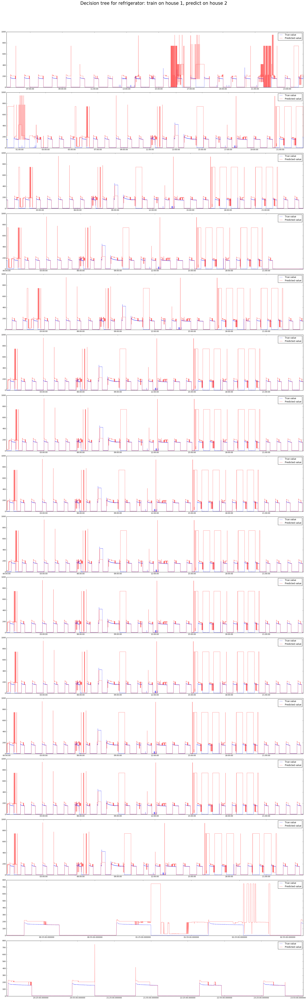

In [18]:
plot_each_app(df[2], dates[2], y_predict_2, y_2, 'Decision tree for refrigerator: train on house 1, predict on house 2')

#### Now, we will try decision tree method for other appliances in house 1

In [19]:
# List of other appliances in house 1:
appliances = list(df[1].columns.values[2:])
appliances.pop(2)
print(appliances)

['oven_3', 'oven_4', 'dishwaser_6', 'kitchen_outlets_7', 'kitchen_outlets_8', 'lighting_9', 'washer_dryer_10', 'microwave_11', 'bathroom_gfi_12', 'electric_heat_13', 'stove_14', 'kitchen_outlets_15', 'kitchen_outlets_16', 'lighting_17', 'lighting_18', 'washer_dryer_19', 'washer_dryer_20']


In [20]:
# using decision tree model on other appliances
def tree_reg_mult_apps():
    start = time.time()
    min_samples_split=np.arange(2, 400, 10)
    pred = {}
    for app in appliances:
        list_clfs = []
        losses = []
        y_train = df1_train[app].values
        y_val = df1_val[app].values
        for split in min_samples_split:
            clf = DecisionTreeRegressor(min_samples_split = split)
            clf.fit(X_train1, y_train)
            y_predict_val = clf.predict(X_val1)
            list_clfs.append(clf)
            losses.append( mse_loss(y_predict_val, y_val) )
        ind = np.argmin(losses)
        pred[app] = list_clfs[ind].predict(X_test1)
    print('Trainning time: ', time.time() - start)
    return pred

mul_pred = tree_reg_mult_apps()

Trainning time:  236.4665584564209


In [21]:
def error_mul_app(mul_pred):
    mse_losses = {}
    mae_losses = {}
    for app in appliances:
        mse_losses[app] = mse_loss(mul_pred[app], df1_test[app].values)
        mae_losses[app] = mae_loss(mul_pred[app], df1_test[app].values)
    return mse_losses, mae_losses

mul_mse_tree, mul_mae_tree = error_mul_app(mul_pred) 

In [22]:
for app in appliances:
    m = np.mean(df1_test[app].values)
    print('mean of {0}: {1:.2f} - mse: {2:.2f} - mae: {3:.2f}'.format(app, m ,mul_mse_tree[app], mul_mae_tree[app]))

mean of oven_3: 15.63 - mse: 18555.36 - mae: 11.29
mean of oven_4: 17.11 - mse: 7454.70 - mae: 4.92
mean of dishwaser_6: 25.35 - mse: 831.49 - mae: 3.38
mean of kitchen_outlets_7: 21.25 - mse: 4.54 - mae: 1.59
mean of kitchen_outlets_8: 27.71 - mse: 99.50 - mae: 3.43
mean of lighting_9: 28.29 - mse: 1585.75 - mae: 24.15
mean of washer_dryer_10: 3.07 - mse: 934.44 - mae: 2.44
mean of microwave_11: 18.92 - mse: 12442.92 - mae: 13.00
mean of bathroom_gfi_12: 6.73 - mse: 3471.07 - mae: 3.44
mean of electric_heat_13: 0.11 - mse: 0.53 - mae: 0.05
mean of stove_14: 0.10 - mse: 0.23 - mae: 0.04
mean of kitchen_outlets_15: 5.34 - mse: 832.75 - mae: 1.63
mean of kitchen_outlets_16: 1.93 - mse: 718.63 - mae: 0.65
mean of lighting_17: 18.97 - mse: 136.66 - mae: 3.18
mean of lighting_18: 15.68 - mse: 383.82 - mae: 13.12
mean of washer_dryer_19: 0.00 - mse: 0.00 - mae: 0.00
mean of washer_dryer_20: 27.54 - mse: 2087.60 - mae: 1.79


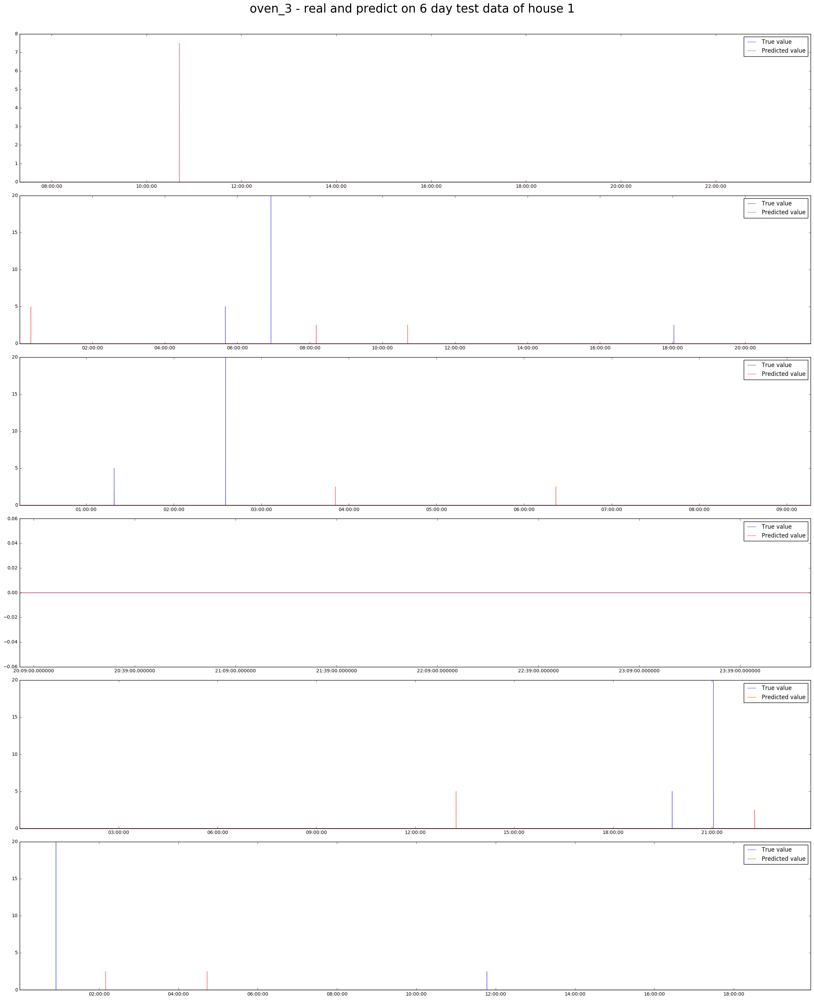

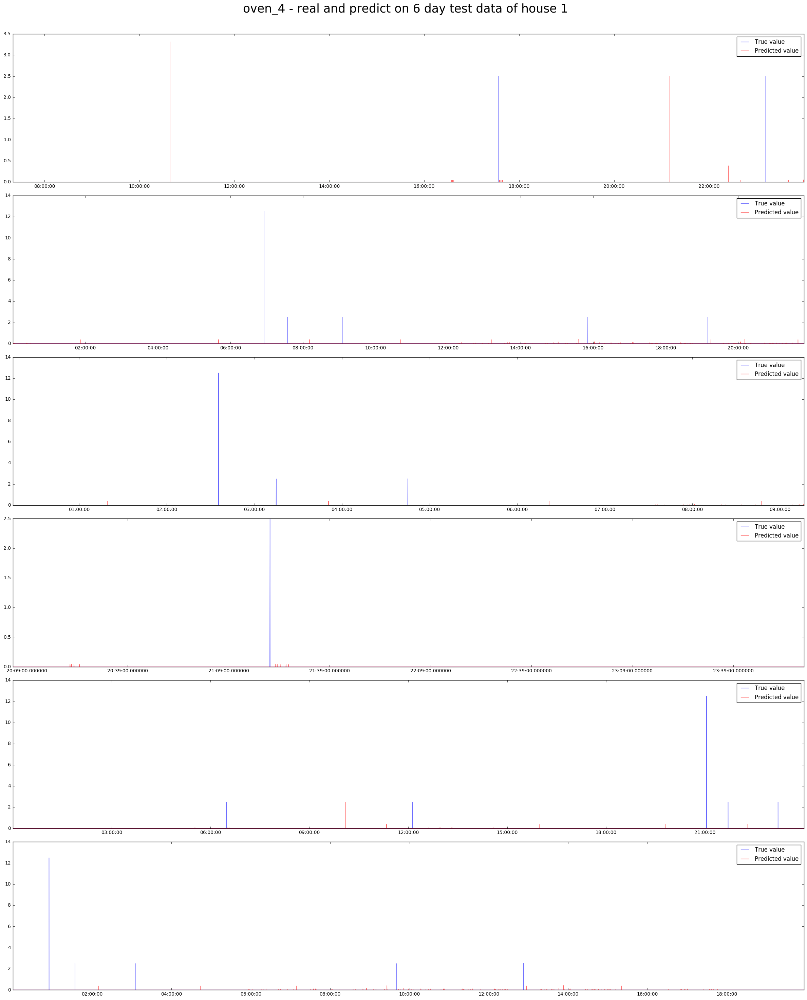

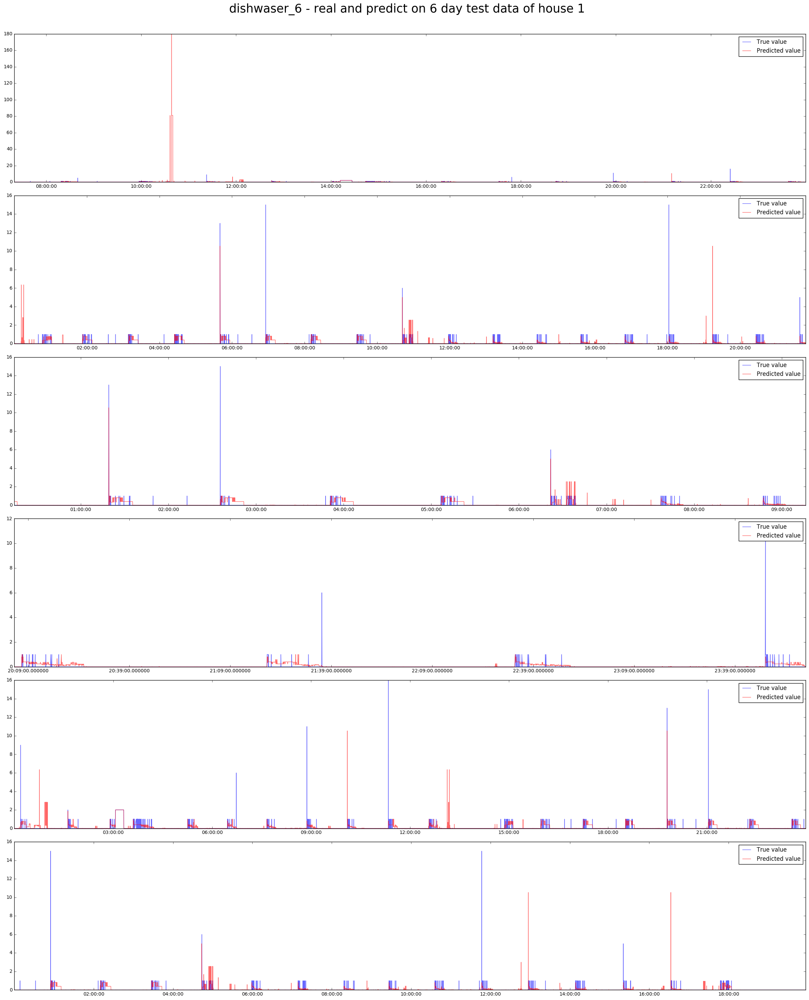

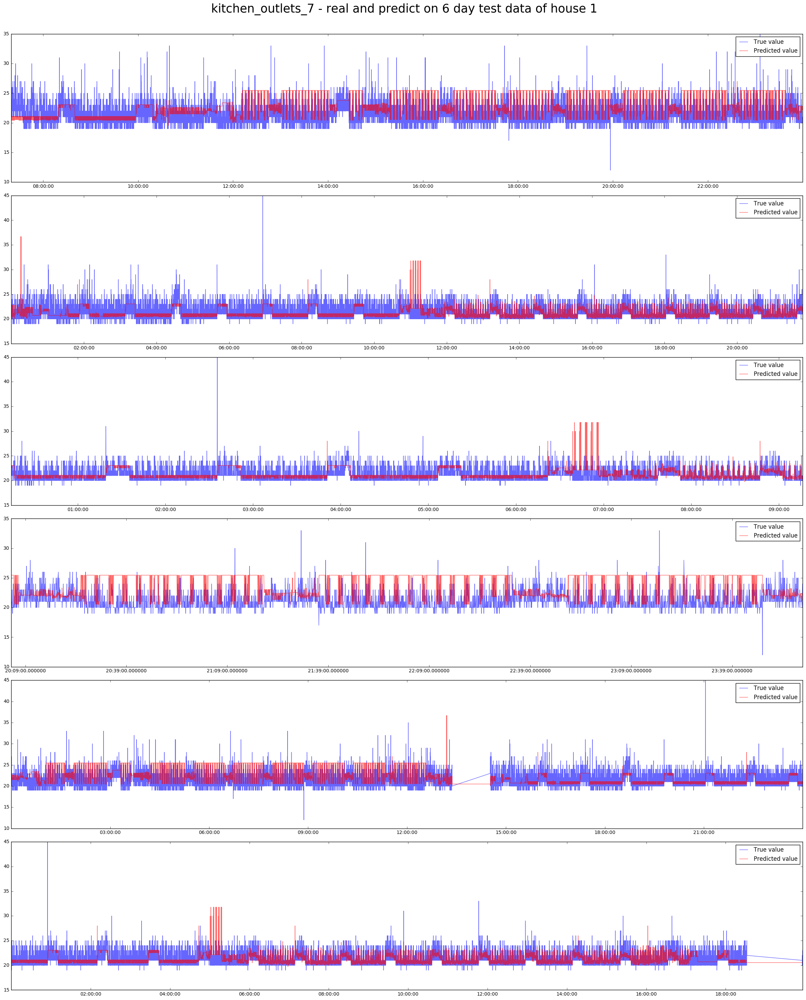

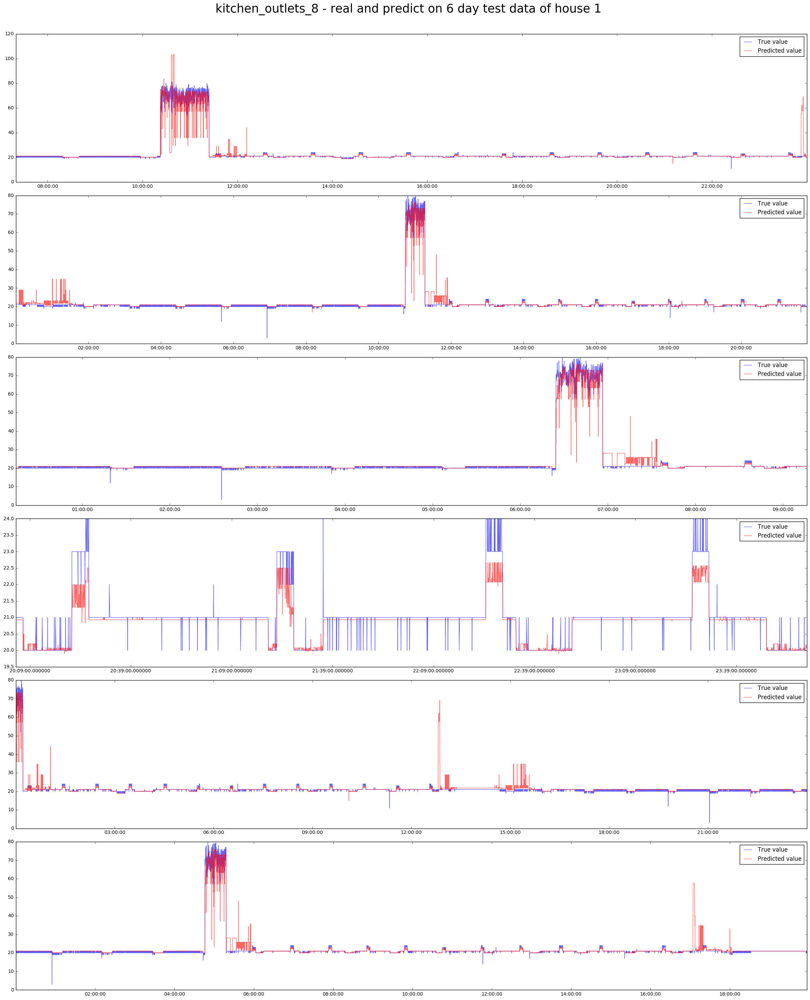

...

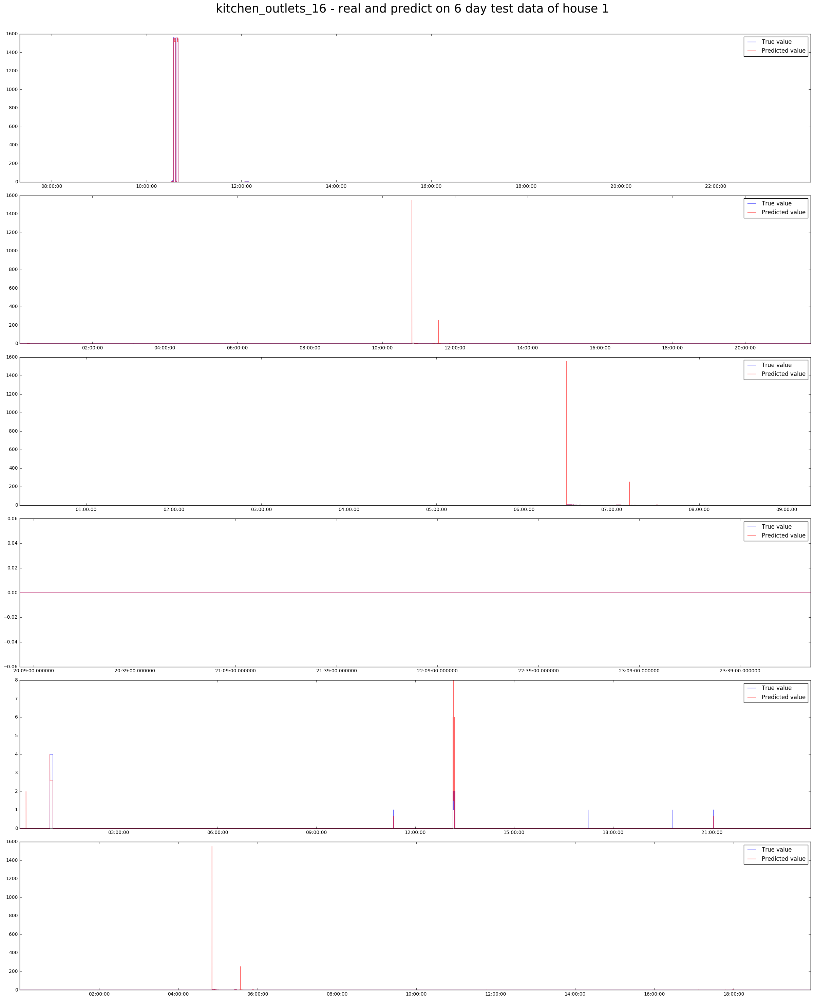

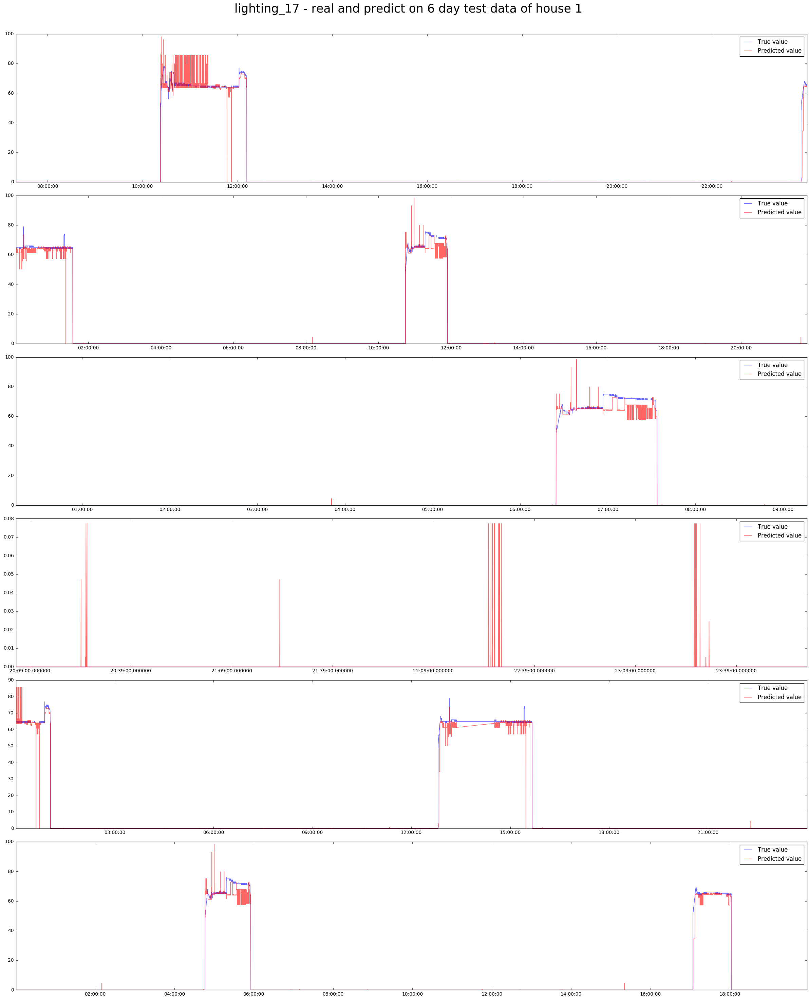

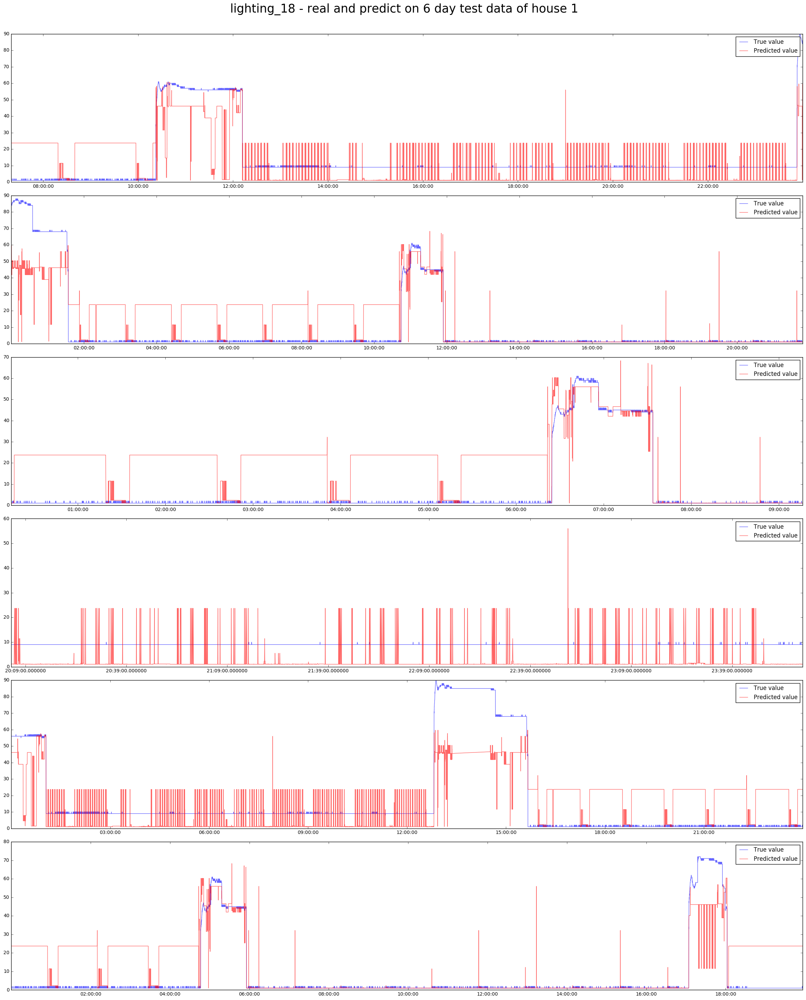

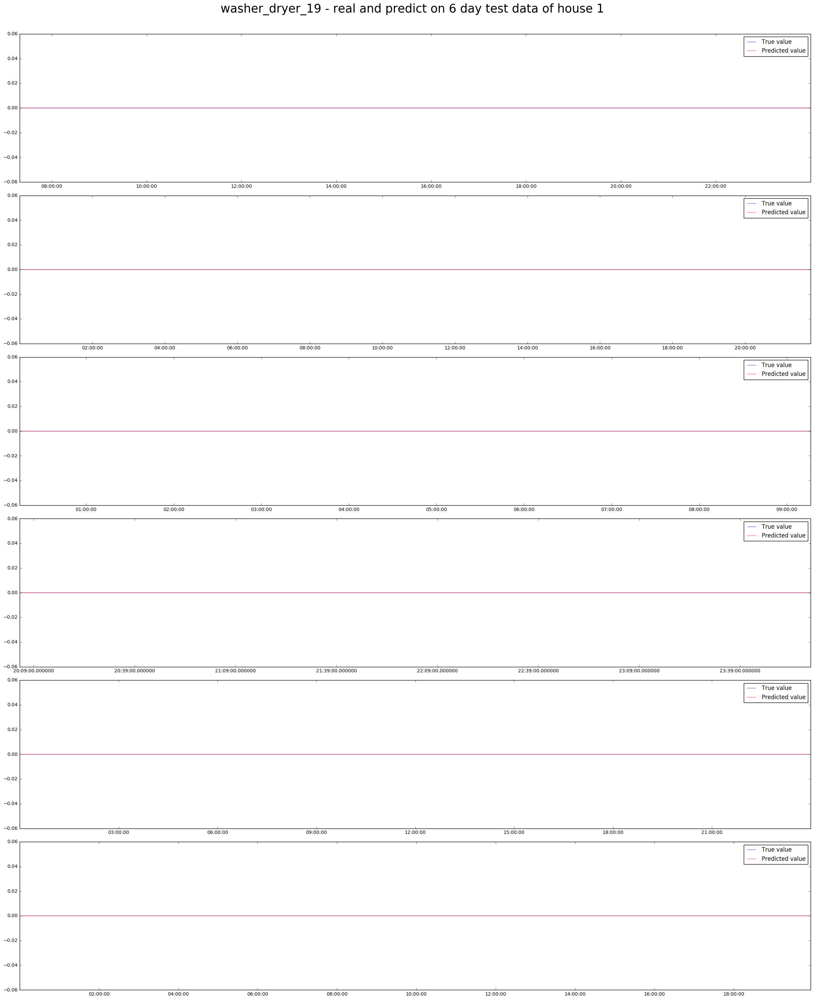

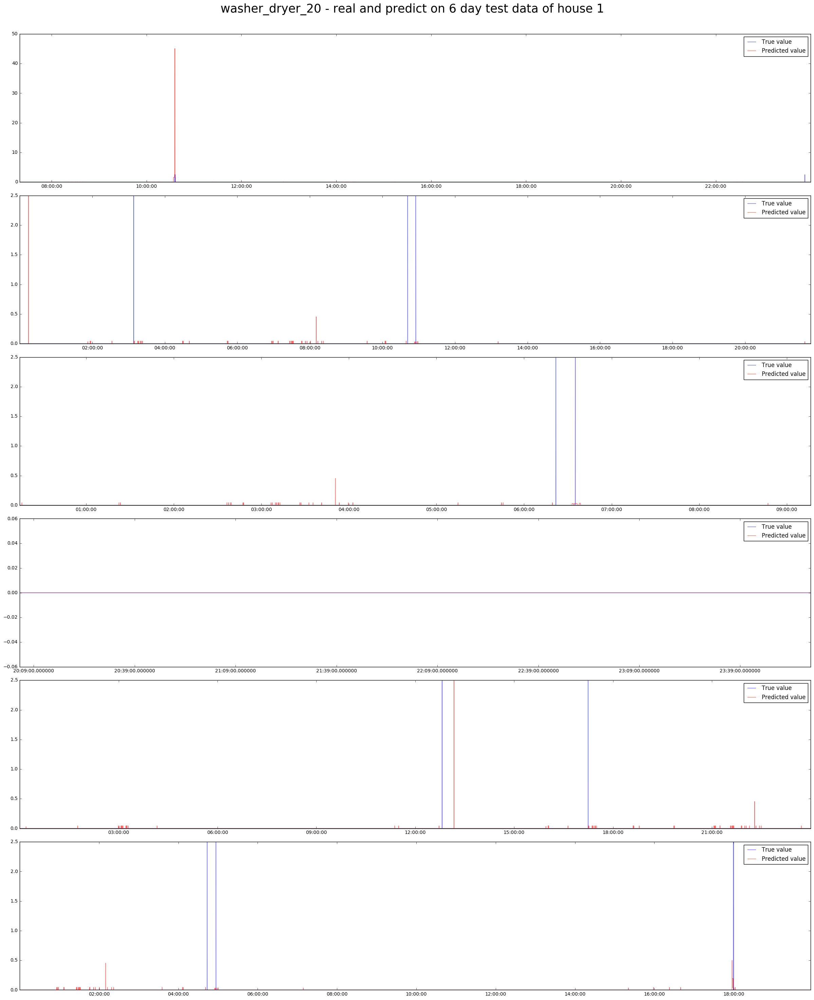

In [23]:
for app in appliances:
    plot_each_app(df1_test, dates[1][17:], mul_pred[app], df1_test[app].values, 
                  '{} - real and predict on 6 day test data of house 1'.format(app))

### Now, let's try fully connected neural network
#### For faster implementation, we use keras API with TensorFlow backend 

In [24]:
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.recurrent import LSTM
from keras.models import Sequential
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.optimizers import Adam
from keras.regularizers import l2

Using TensorFlow backend.


In [25]:
def build_fc_model(layers):
    fc_model = Sequential()
    for i in range(len(layers)-1):
        fc_model.add( Dense(input_dim=layers[i], output_dim= layers[i+1]) )#, W_regularizer=l2(0.1)) )
        fc_model.add( Dropout(0.5) )
        if i < (len(layers) - 2):
            fc_model.add( Activation('relu') )
    fc_model.summary()
    return fc_model
fc_model_1 = build_fc_model([2, 256, 512, 1024, 1])

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
dense_1 (Dense)                  (None, 256)           768         dense_input_1[0][0]              
____________________________________________________________________________________________________
dropout_1 (Dropout)              (None, 256)           0           dense_1[0][0]                    
____________________________________________________________________________________________________
activation_1 (Activation)        (None, 256)           0           dropout_1[0][0]                  
____________________________________________________________________________________________________
dense_2 (Dense)                  (None, 512)           131584      activation_1[0][0]               
___________________________________________________________________________________________

In [35]:
adam = Adam(lr = 1e-5)
fc_model_1.compile(loss='mean_squared_error', optimizer=adam)
start = time.time()
checkpointer = ModelCheckpoint(filepath="./fc_refrig_h1_2.hdf5", verbose=0, save_best_only=True)
hist_fc_1 = fc_model_1.fit( X_train1, y_train1,
                    batch_size=512, verbose=1, nb_epoch=200,
                    validation_split=0.33, callbacks=[checkpointer])
print('Finish trainning. Time: ', time.time() - start)

Train on 143926 samples, validate on 70890 samples
Epoch 1/200
143926/143926 [==============================] - 1s - loss: 5804.2069 - val_loss: 3781.9821
Epoch 2/200
143926/143926 [==============================] - 1s - loss: 5851.1790 - val_loss: 3789.7713
Epoch 3/200
143926/143926 [==============================] - 1s - loss: 5872.3753 - val_loss: 3800.7461
Epoch 4/200
143926/143926 [==============================] - 1s - loss: 5832.6660 - val_loss: 3795.0779
Epoch 5/200
143926/143926 [==============================] - 1s - loss: 5862.9396 - val_loss: 3795.3384
Epoch 6/200
143926/143926 [==============================] - 1s - loss: 5865.1076 - val_loss: 3778.0040
Epoch 7/200
143926/143926 [==============================] - 1s - loss: 5885.0092 - val_loss: 3814.5572
Epoch 8/200
143926/143926 [==============================] - 1s - loss: 5854.6276 - val_loss: 3764.4692
Epoch 9/200
143926/143926 [==============================] - 1s - loss: 5853.3552 - val_loss: 3782.6687
Epoch 10/200


In [36]:
fc_model_1 = load_model('fc_refrig_h1_2.hdf5')
pred_fc_1 = fc_model_1.predict(X_test1).reshape(-1)
mse_loss_fc_1 = mse_loss(pred_fc_1, y_test1)
mae_loss_fc_1 = mae_loss(pred_fc_1, y_test1)
print('Mean square error on test set: ', mse_loss_fc_1)
print('Mean absolute error on the test set: ', mae_loss_fc_1)


Mean square error on test set:  4381.47287362
Mean absolute error on the test set:  33.9033417197


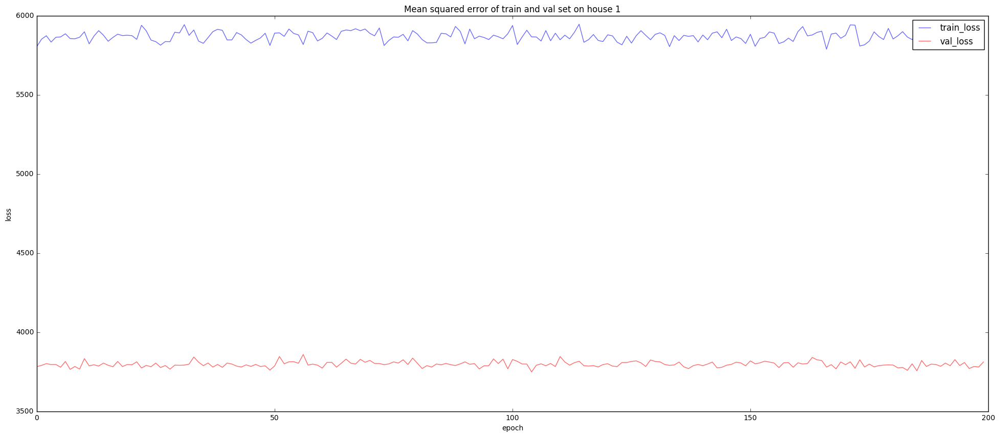

In [37]:
train_loss = hist_fc_1.history['loss']
val_loss = hist_fc_1.history['val_loss']
def plot_losses(train_loss, val_loss):
    plt.rcParams["figure.figsize"] = [24,10]
    plt.title('Mean squared error of train and val set on house 1')
    plt.plot( range(len(train_loss)), train_loss, color = 'b', alpha = 0.6, label='train_loss' )
    plt.plot( range(len( val_loss )), val_loss, color = 'r', alpha = 0.6, label='val_loss' )
    plt.xlabel( 'epoch' )
    plt.ylabel( 'loss' )
    plt.legend()

plot_losses(train_loss, val_loss)

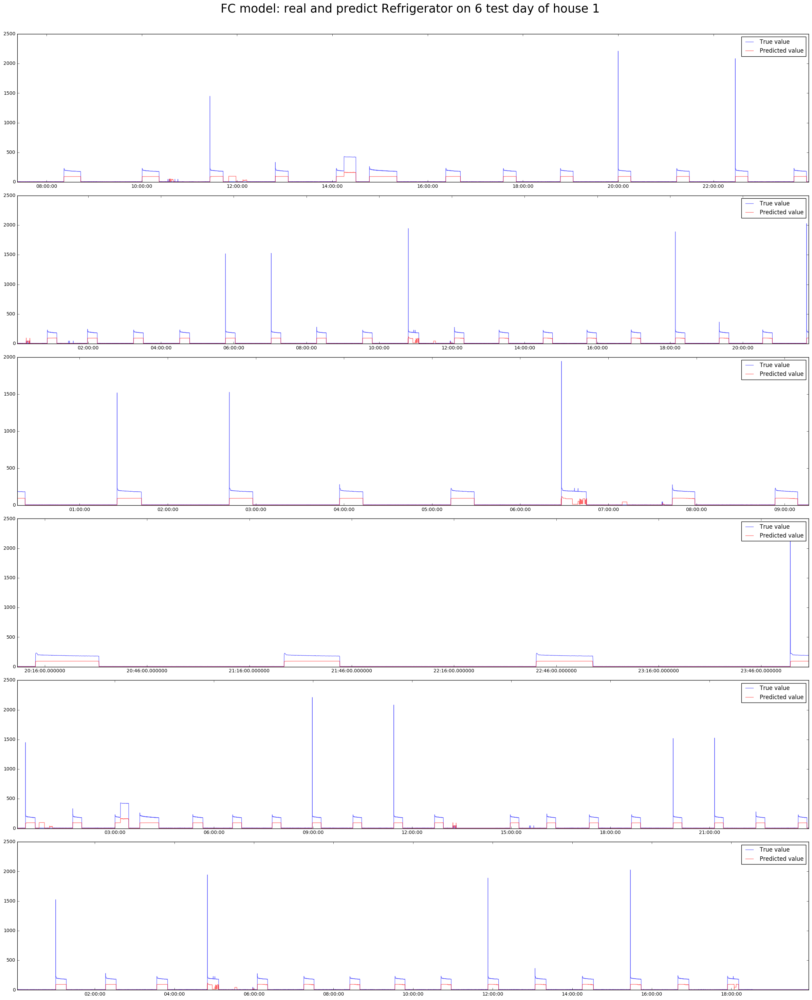

In [38]:
plot_each_app(df1_test, dates[1][17:], pred_fc_1, y_test1, 
              'FC model: real and predict Refrigerator on 6 test day of house 1', look_back = 50)

#### Use this model on house 2

In [44]:
y_pred_fc_2 = fc_model_1.predict(X_2).reshape(-1)
mse_fc_2 = mse_loss(y_pred_fc_2, y_2)
mae_fc_2 = mae_loss(y_pred_fc_2, y_2)
print('Mean square error on test set: ', mse_fc_2)
print('Mean absolute error on the test set: ', mae_fc_2)

Mean square error on test set:  4081.55138568
Mean absolute error on the test set:  37.7227043683


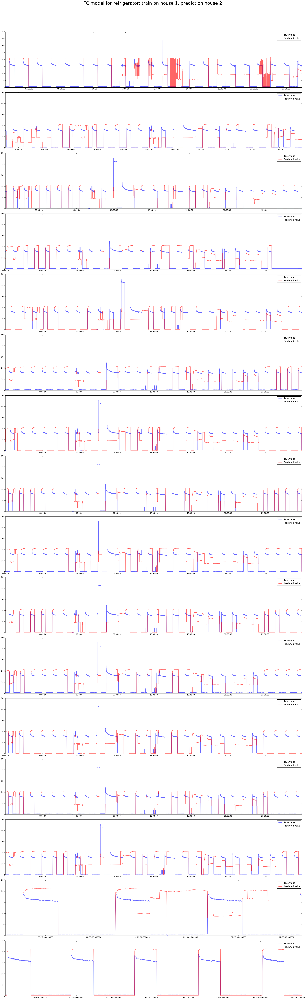

In [45]:
plot_each_app(df[2], dates[2], y_pred_fc_2, y_2, 'FC model for refrigerator: train on house 1, predict on house 2')

### Let's use 50 consecutive total consumtions to predict energy consumption of each appliance

In [46]:
def process_data(df, dates, x_features, y_features, look_back = 50):
    i = 0
    for date in dates:
        data = df.ix[date]
        len_data = data.shape[0]
        x = np.array([data[x_features].values[i:i+look_back] 
                      for i in range(len_data - look_back) ]).reshape(-1,look_back, 2)
        y = data[y_features].values[look_back:,:]
        if i == 0:
            X = x
            Y = y
        else:
            X = np.append(X, x, axis=0)
            Y = np.append(Y, y, axis=0)
        i += 1
    return X,Y

In [47]:
start = time.time()
X_train, y_train = process_data(df[1], dates[1][:17], ['mains_1','mains_2'], df[1].columns.values[2:])
X_test, y_test = process_data(df[1], dates[1][17:], ['mains_1','mains_2'], df[1].columns.values[2:])
print('Process data time: ', time.time() - start)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

Process data time:  131.1120023727417
(318841, 50, 2) (318841, 18) (86757, 50, 2) (86757, 18)


#### Let's use fully connected neural network again, but this time we use the past 50 consecutive main values to predict the present value of refrigerator


In [48]:
fc_model = build_fc_model([100, 256, 512, 1024, 1])

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
dense_5 (Dense)                  (None, 256)           25856       dense_input_6[0][0]              
____________________________________________________________________________________________________
dropout_5 (Dropout)              (None, 256)           0           dense_5[0][0]                    
____________________________________________________________________________________________________
activation_4 (Activation)        (None, 256)           0           dropout_5[0][0]                  
____________________________________________________________________________________________________
dense_6 (Dense)                  (None, 512)           131584      activation_4[0][0]               
___________________________________________________________________________________________

In [49]:
# Let's flatten data to feed into fc model
X_train_fc = X_train.reshape(-1, 100)
y_train_fc = y_train[:,2]
print(X_train_fc.shape, y_train_fc.shape)

(318841, 100) (318841,)


In [52]:
adam = Adam(lr = 1e-5)
fc_model.compile(loss='mean_squared_error', optimizer=adam)
start = time.time()
checkpointer = ModelCheckpoint(filepath="./fc_refrig_h1.hdf5", verbose=0, save_best_only=True)
hist_fc2 = fc_model.fit( X_train_fc, y_train_fc,
                    batch_size=512, verbose=1, nb_epoch= 200,
                    validation_split=0.33, callbacks=[checkpointer])
print('Finish trainning. Time: ', time.time() - start)

Train on 213623 samples, validate on 105218 samples
Epoch 1/200
213623/213623 [==============================] - 2s - loss: 6505.4981 - val_loss: 5682.7645
Epoch 2/200
213623/213623 [==============================] - 1s - loss: 6524.7784 - val_loss: 5680.6661
Epoch 3/200
213623/213623 [==============================] - 1s - loss: 6522.5690 - val_loss: 5571.7637
Epoch 4/200
213623/213623 [==============================] - 1s - loss: 6460.9373 - val_loss: 5674.6952
Epoch 5/200
213623/213623 [==============================] - 1s - loss: 6515.9020 - val_loss: 5748.6559
Epoch 6/200
213623/213623 [==============================] - 1s - loss: 6529.6990 - val_loss: 5641.3719
Epoch 7/200
213623/213623 [==============================] - 1s - loss: 6454.8584 - val_loss: 5573.4369
Epoch 8/200
213623/213623 [==============================] - 1s - loss: 6491.9831 - val_loss: 5673.0675
Epoch 9/200
213623/213623 [==============================] - 1s - loss: 6510.2547 - val_loss: 5496.7455
Epoch 10/200

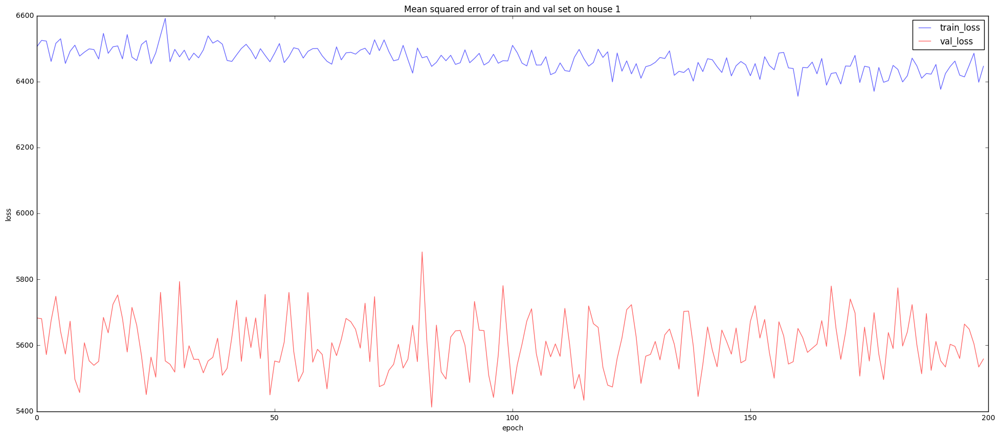

In [53]:
train_loss = hist_fc2.history['loss']
val_loss = hist_fc2.history['val_loss']

plot_losses(train_loss, val_loss)

In [54]:
fc_model = load_model('fc_refrig_h1.hdf5')
pred_fc = fc_model.predict(X_test.reshape(-1, 100)).reshape(-1)
print(pred_fc.shape)

(86757,)


In [55]:
mse_loss_fc = mse_loss(pred_fc, y_test[:,2])
mae_loss_fc = mae_loss(pred_fc, y_test[:,2])
print('Mean square error on test set: ', mse_loss_fc)
print('Mean absolute error on the test set: ', mae_loss_fc)

Mean square error on test set:  6431.12474741
Mean absolute error on the test set:  41.2176835876


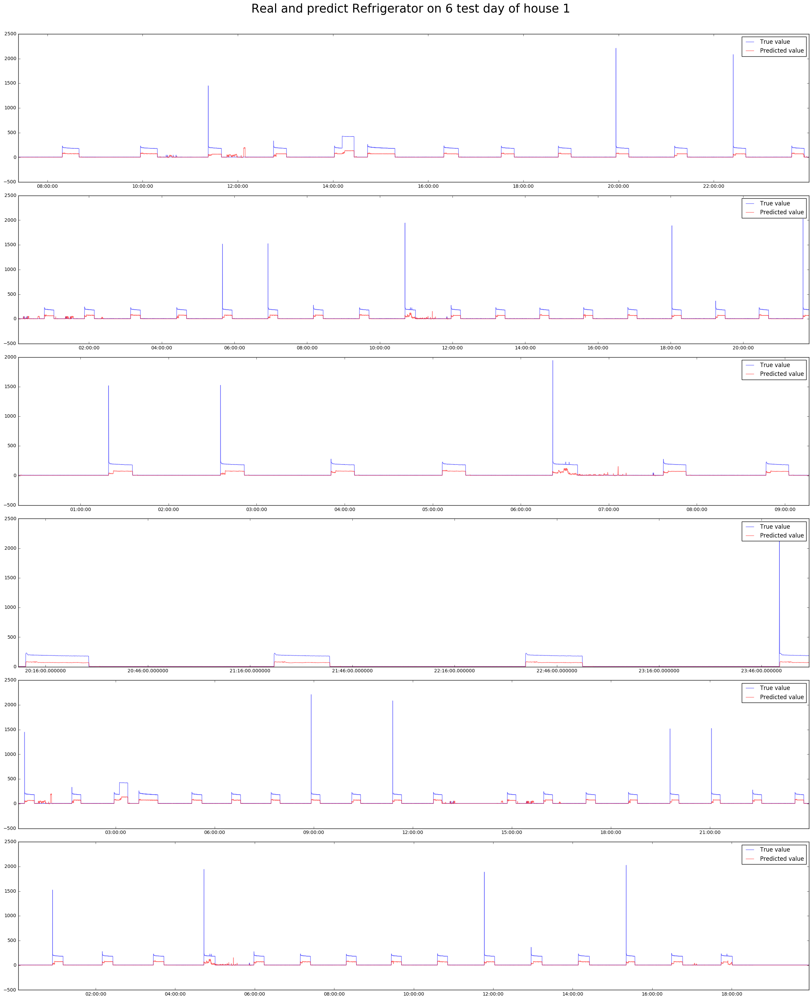

In [56]:
plot_each_app(df1_test, dates[1][17:], pred_fc, y_test[:,2], 
              'Real and predict Refrigerator on 6 test day of house 1', look_back = 50)

#### Test on house 2

In [57]:
start = time.time()
X_2, y_2 = process_data(df[2], dates[2], ['mains_2','mains_1'], ['refrigerator_9'])
X_2_fc = X_2.reshape(-1, 100)
y_2 = y_2.reshape(-1)
print('Process data time: ', time.time() - start)
print(X_2_fc.shape, y_2.shape)

Process data time:  101.4786548614502
(316040, 100) (316040,)


In [60]:
pred_fc_50_h2 = fc_model.predict(X_2_fc).reshape(-1)
mse_loss_fc_50_2 = mse_loss(pred_fc_50_h2, y_2)
mae_loss_fc_50_2 = mae_loss(pred_fc_50_h2, y_2)
print('Mean square error on test set: ', mse_loss_fc_50_2)
print('Mean absolute error on the test set: ', mae_loss_fc_50_2)

Mean square error on test set:  7280.34745165
Mean absolute error on the test set:  51.7709722299


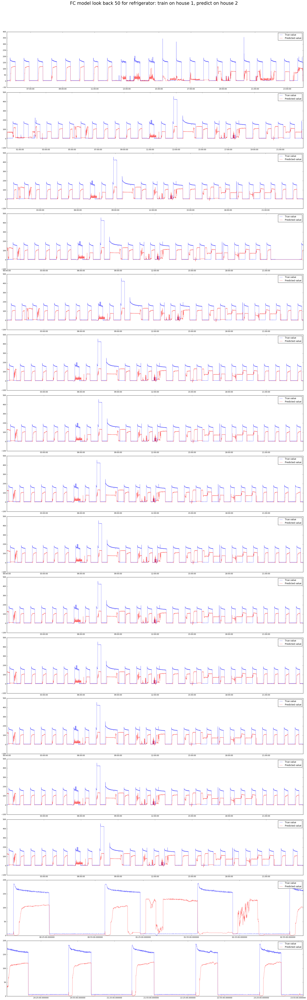

In [61]:
plot_each_app(df[2], dates[2], pred_fc_50_h2, y_2, 'FC model look back 50 for refrigerator: train on house 1, predict on house 2')

### Long term short term memory neural network
#### Now we will try a type of recurrent neural network called long term short term memory model

In [62]:
def build_lstm_model(layers):
    model = Sequential()
    for i in range(len(layers) - 2):
        model.add(LSTM(
            input_dim=layers[i],
            output_dim=layers[i+1], 
            #stateful=True,
            return_sequences= True if i < len(layers) - 3 else False ))
        model.add(Dropout(0.3))
    
    model.add(Dense(layers[-1]))
    model.summary()
    return model

model = build_lstm_model([2,64,128,256, 1])

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lstm_1 (LSTM)                    (None, None, 64)      17152       lstm_input_1[0][0]               
____________________________________________________________________________________________________
dropout_9 (Dropout)              (None, None, 64)      0           lstm_1[0][0]                     
____________________________________________________________________________________________________
lstm_2 (LSTM)                    (None, None, 128)     98816       dropout_9[0][0]                  
____________________________________________________________________________________________________
dropout_10 (Dropout)             (None, None, 128)     0           lstm_2[0][0]                     
___________________________________________________________________________________________

In [ ]:
start = time.time()
adam = Adam(lr = 5e-5)
model.compile(loss='mean_squared_error', optimizer=adam)
checkpointer = ModelCheckpoint(filepath="./lstm_model.hdf5", verbose=0, save_best_only=True)
hist_lstm = model.fit(
            X_train,
            y_train[:,2],
            batch_size=512,
            verbose=1,
            nb_epoch=200,
            validation_split=0.3,
            callbacks=[checkpointer])
print('Finish trainning. Time: ', time.time() - start)

In [ ]:
train_loss = hist_lstm.history['loss']
val_loss = hist_lstm.history['val_loss']

plot_losses(train_loss, val_loss)

In [63]:
model = load_model('lstm_model.hdf5')
pred_lstm = model.predict(X_test).reshape(-1)
print(pred_lstm.shape)

(86757,)


In [64]:
mse_loss_lstm = mse_loss(pred_lstm, y_test[:,2])
mae_loss_lstm = mae_loss(pred_lstm, y_test[:,2])
print('Mean square error on test set: ', mse_loss_lstm)
print('Mean absolute error on the test set: ', mae_loss_lstm)

Mean square error on test set:  2087.58609048
Mean absolute error on the test set:  11.1584995895


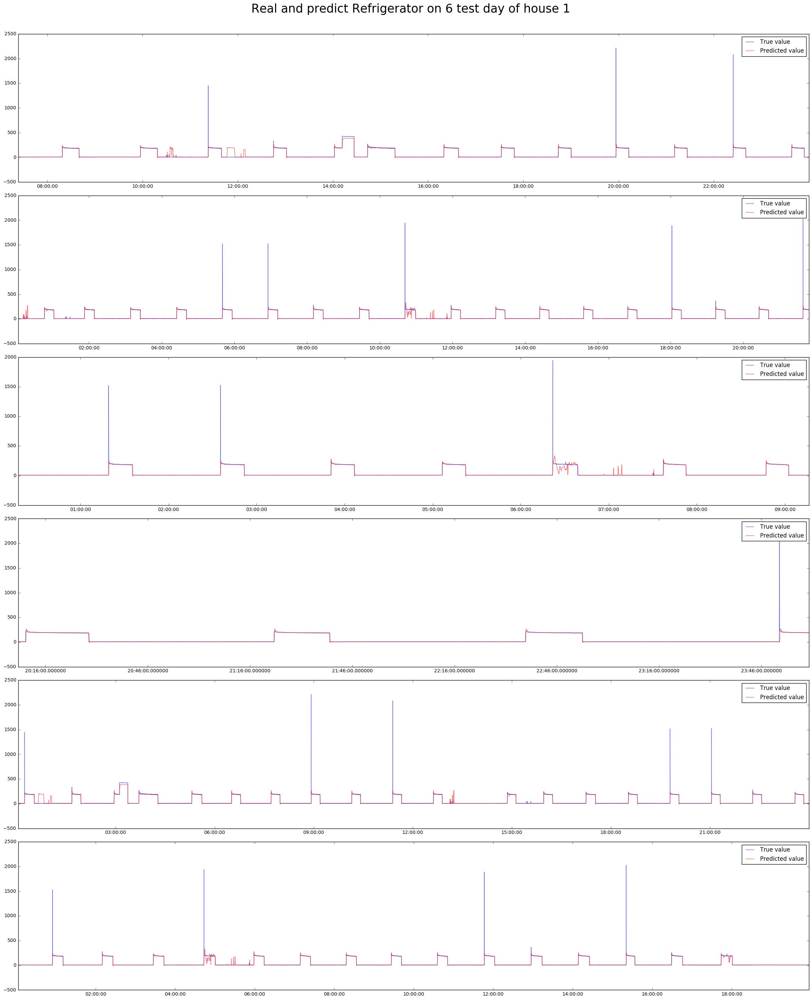

In [65]:
plot_each_app(df1_test, dates[1][17:], pred_lstm, y_test[:,2], 
              'Real and predict Refrigerator on 6 test day of house 1', look_back = 50)

#### Test LST model on house 2 

In [66]:
pred_lstm_h2 = model.predict(X_2).reshape(-1)
mse_loss_lstm_h2 = mse_loss(pred_lstm_h2, y_2)
mae_loss_lstm_h2 = mae_loss(pred_lstm_h2, y_2)
print('Mean square error on test set: ', mse_loss_lstm_h2)
print('Mean absolute error on the test set: ', mae_loss_lstm_h2)


Mean square error on test set:  21135.549708
Mean absolute error on the test set:  92.0653313527


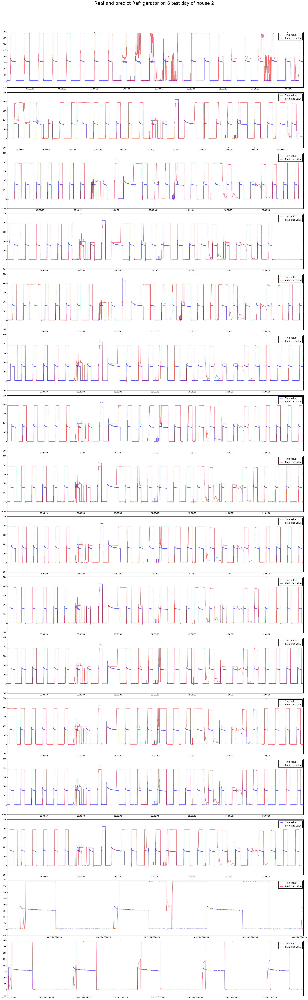

In [67]:
plot_each_app(df[2], dates[2], pred_lstm_h2, y_2, 
              'Real and predict Refrigerator on 6 test day of house 2', look_back = 50)